In [14]:
library(lme4) # necessary for model fitting: glm
library(effects) # necessary for making effect plots
library(blmeco) # necessary for calculating dispersion with GLMM models

# Statistics based on correspondent connection types

The frequencies in the columns (e.g. "hit_freq") represent the number of divine appeals per 100,000 words of total words per correspondent connection type.

In [15]:
jeake_conn <- read.delim(file = "stats_jeake.tsv", sep = "\t", header = T)

In [16]:
head(jeake_conn)

str(jeake_conn)

id,hit_freq,conf_freq,approve_freq,fixed_freq,object_freq,grat_freq,pray_freq,preserve_freq,presupp_freq,...,sender_generation,addressee_generation,sender_is_older,sender_over_40,addressee_over_40,age_gap_over_20,age_gap,gender_sender,gender_addressee,gender_pair
1,281.58,0,0,16.76,0,0,0.00,0.00,83.81,...,1600-1640,UNK,UNK,FALSE,UNK,UNK,NA,MALE,FEMALE,MALE-FEMALE
3,442.48,0,0,16.76,0,0,83.81,33.52,0.00,...,1600-1640,UNK,UNK,FALSE,MULT,UNK,NA,MALE,MULT,MALE-MULT
11,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,TRUE,FALSE,FALSE,FALSE,7,MALE,FEMALE,MALE-FEMALE
12,1.69,0,0,0.00,0,0,1.73,1.73,0.00,...,1600-1640,1600-1640,FALSE,FALSE,FALSE,FALSE,7,FEMALE,MALE,FEMALE-MALE
13,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,TRUE,FALSE,FALSE,FALSE,7,MALE,FEMALE,MALE-FEMALE
18,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,FALSE,FALSE,FALSE,FALSE,7,FEMALE,MALE,FEMALE-MALE


'data.frame':	272 obs. of  35 variables:
 $ id                  : int  1 3 11 12 13 18 20 21 26 27 ...
 $ hit_freq            : num  281.58 442.48 0 1.69 0 ...
 $ conf_freq           : num  0 0 0 0 0 0 1.73 0 0 0 ...
 $ approve_freq        : num  0 0 0 0 0 0 0 0 0 0 ...
 $ fixed_freq          : num  16.8 16.8 0 0 0 ...
 $ object_freq         : num  0 0 0 0 0 0 1.73 1.73 0 0 ...
 $ grat_freq           : num  0 0 0 0 0 0 1.73 1.73 0 0 ...
 $ pray_freq           : num  0 83.81 0 1.73 0 ...
 $ preserve_freq       : num  0 33.52 0 1.73 0 ...
 $ presupp_freq        : num  83.8 0 0 0 0 ...
 $ resign_freq         : num  16.8 33.5 0 0 0 ...
 $ travel_freq         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ trade_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ health_freq         : num  117.3 16.8 0 0 0 ...
 $ politics_freq       : num  0 101 0 0 0 ...
 $ social_freq         : num  0 16.8 0 0 0 ...
 $ connection          : Factor w/ 5 levels "BUSINESS; CORRESPONDENT",..: 5 5 4 4 4 4 4 4 4 4 ...
 $ sender 

The "id" and "year" columns should be cast as factors.

In [17]:
jeake_conn$id <- as.factor(jeake_conn$id)
str(jeake_conn$id)

jeake_conn$year <- as.factor(jeake_conn$year)
str(jeake_conn$year)

 Factor w/ 272 levels "1","3","11","12",..: 1 2 3 4 5 6 7 8 9 10 ...
 Factor w/ 29 levels "1640","1651",..: 1 NA NA 2 2 2 NA 3 4 4 ...


In [5]:
# test for data independence

length(jeake_conn$id)
length(unique(jeake_conn$id))

length(jeake_conn$id) == length(unique(jeake_conn$id))

[1] 272

[1] 272

[1] TRUE

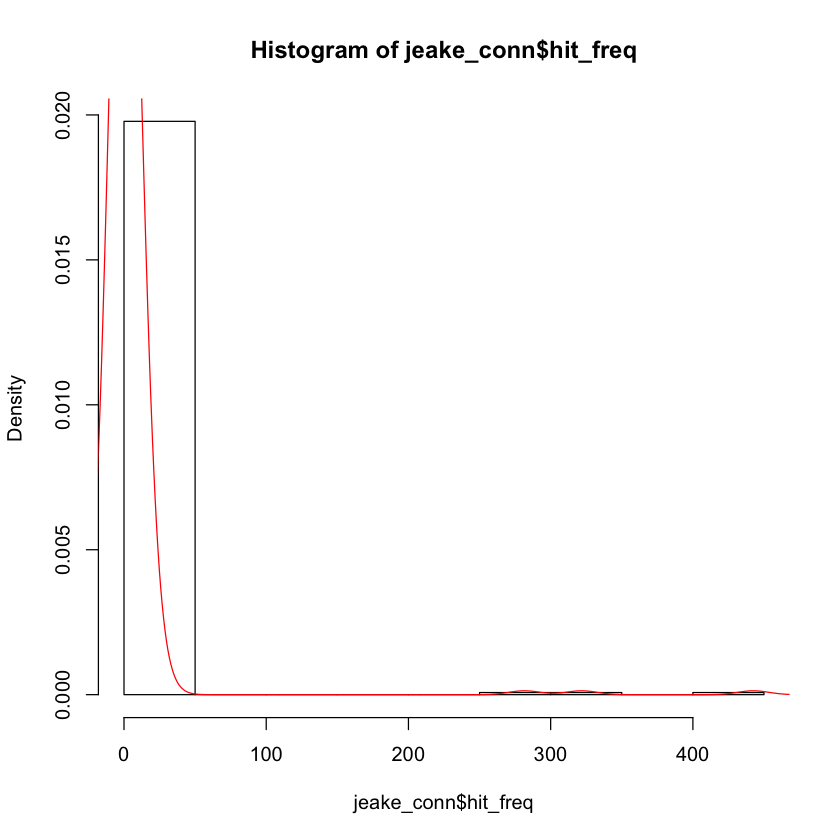

In [13]:
hist(jeake_conn$hit_freq,
    freq=FALSE)
lines(density(jeake_conn$hit_freq), col='red')

In [6]:
# test for normality

shapiro.test(jeake_conn$hit_freq)


	Shapiro-Wilk normality test

data:  jeake_conn$hit_freq
W = 0.11357, p-value < 2.2e-16


The data is not normally distributed. 

### 1 Generalised linear model using "connection" as a predictor and "hit_freq" as response variable

In [7]:
j_conn_model <- glm(hit_freq ~ connection,
                    data=jeake_conn,
                    family=quasipoisson)

summary(j_conn_model)
summary(j_conn_model)$coef


Call:
glm(formula = hit_freq ~ connection, family = quasipoisson, data = jeake_conn)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-22.451   -1.730   -1.334   -1.334   10.148  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)    
(Intercept)                  0.7653     0.4592   1.666   0.0968 .  
connectionBUSINESS; FRIEND   0.2397     0.5935   0.404   0.6866    
connectionEXTENDED FAMILY   -0.3616     0.5809  -0.622   0.5342    
connectionFAMILY            -0.8819     0.5318  -1.658   0.0984 .  
connectionFRIEND             4.8026     0.4699  10.220   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 10.42628)

    Null deviance: 9280.4  on 271  degrees of freedom
Residual deviance: 1936.9  on 267  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.7652656,0.4592246,1.6664299,9.680046e-02
connectionBUSINESS; FRIEND,0.2397141,0.5934992,0.4038997,6.866098e-01
connectionEXTENDED FAMILY,-0.3616203,0.5809443,-0.6224699,5.341642e-01
connectionFAMILY,-0.8818683,0.5317545,-1.6584126,9.840849e-02
connectionFRIEND,4.8025826,0.4699371,10.2196279,6.587869e-21


In [8]:
"------------------------------drop1------------------------------"
drop1(j_conn_model, test = "LR")

"------------------------------anova------------------------------"
simpler_j_conn <- glm(hit_freq ~ 1, data=jeake_conn,
                      family=quasipoisson)
anova(simpler_j_conn, j_conn_model, test = "LR")

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1936.876,NA,NA
connection,4,9280.356,704.3244,4.035311e-151


[1] "------------------------------anova------------------------------"

Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
271,9280.356,NA,NA,NA
267,1936.876,4,7343.48,4.035311e-151


In [9]:
eff <- effect("connection", j_conn_model)
eff


 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.1495652               2.7318519               1.4972727 
                 FAMILY                  FRIEND 
              0.8899387             261.8700000 

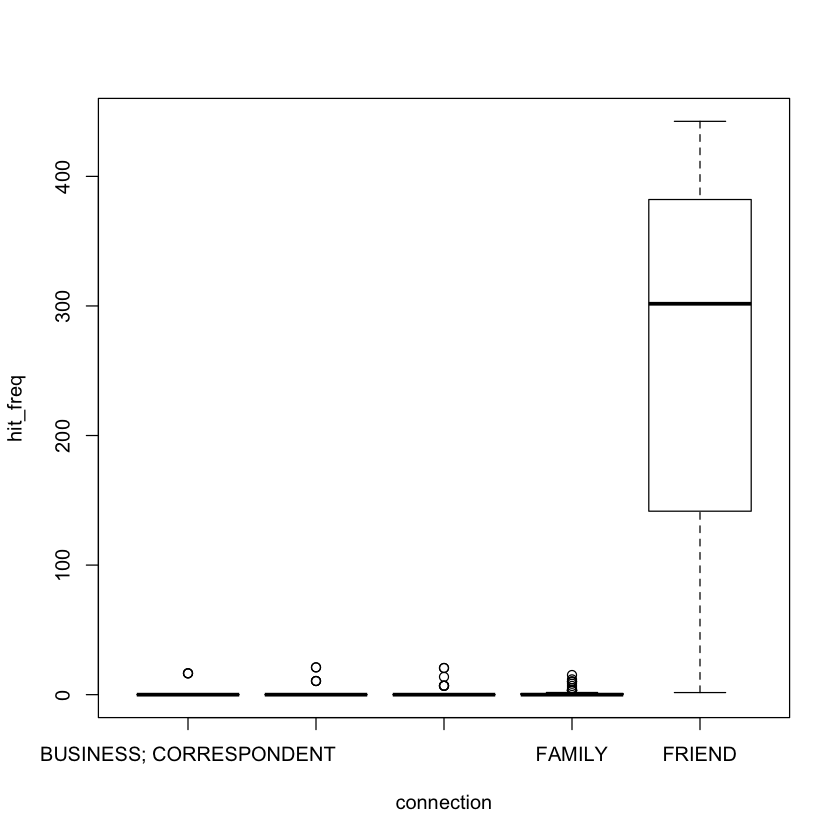

In [10]:
plot(hit_freq ~ connection, data=jeake_conn)

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 8)

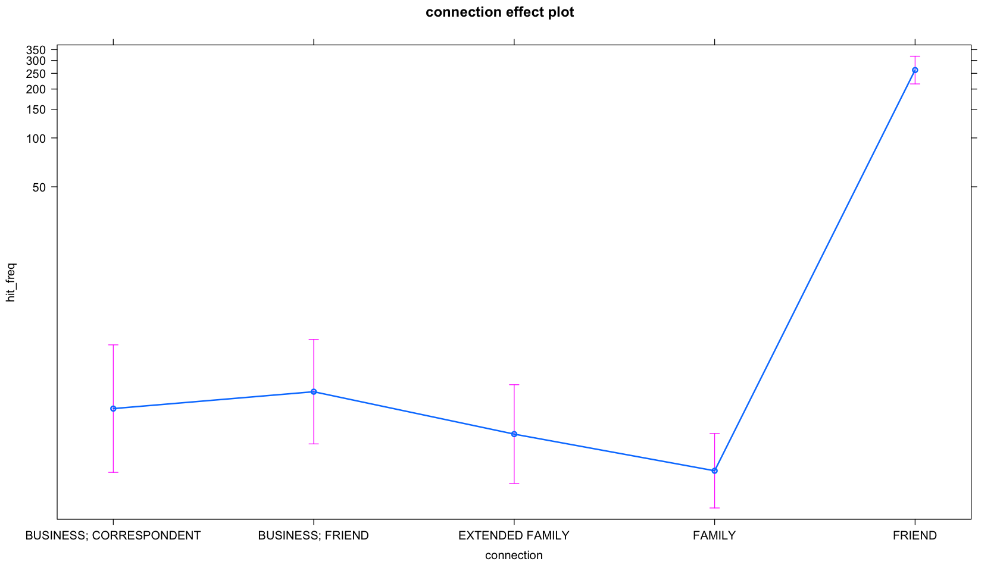

In [11]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 12, repr.plot.height = 6)

Given that the "Friend" term is constructed from four letter writings, it might be treated as an outlier. Let's run the same model without the term.

### 1.1 Generalised linear model using "connection" as a predictor, without "FRIEND", and "hit_freq" as response variable

In [18]:
# make sure it doesn't delete the "BUSINESS; FRIEND" variable as well
jeake_nofriend <- subset(jeake_conn, !(grepl("FRIEND", connection) & connection != "BUSINESS; FRIEND"))
jeake_nofriend$connection <- droplevels(jeake_nofriend$connection)

str(jeake_nofriend$connection)

 Factor w/ 4 levels "BUSINESS; CORRESPONDENT",..: 4 4 4 4 4 4 4 4 4 4 ...


In [54]:
j_nofriend_model <- glm(hit_freq ~ connection,
                        data=jeake_nofriend,
                        family=quasipoisson)

summary(j_nofriend_model)
summary(j_nofriend_model)$coef


Call:
glm(formula = hit_freq ~ connection, family = quasipoisson, data = jeake_nofriend)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.337  -1.730  -1.334  -1.334   8.352  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)  
(Intercept)                  0.7653     0.4275   1.790   0.0746 .
connectionBUSINESS; FRIEND   0.2397     0.5525   0.434   0.6647  
connectionEXTENDED FAMILY   -0.3616     0.5408  -0.669   0.5043  
connectionFAMILY            -0.8819     0.4950  -1.781   0.0760 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 9.035648)

    Null deviance: 1383.8  on 267  degrees of freedom
Residual deviance: 1315.6  on 264  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.7652656,0.4275040,1.7900781,0.07458727
connectionBUSINESS; FRIEND,0.2397141,0.5525037,0.4338688,0.66473807
connectionEXTENDED FAMILY,-0.3616203,0.5408160,-0.6686568,0.50429866
connectionFAMILY,-0.8818683,0.4950240,-1.7814659,0.07598591


In [14]:
"------------------------------drop1------------------------------"
drop1(j_nofriend_model, test = "LR")

"------------------------------anova------------------------------"
simpler_j_nofriend <- glm(hit_freq ~ 1, data=jeake_nofriend,
                          family=quasipoisson)
anova(simpler_j_nofriend, j_nofriend_model, test = "LR")

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1315.648,NA,NA
connection,3,1383.815,7.544184,0.05643397


[1] "------------------------------anova------------------------------"

Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
267,1383.815,NA,NA,NA
264,1315.648,3,68.1666,0.05643397


The exclusion of the "FRIEND" parameter in the model does not make the model worse.

In [15]:
eff <- effect("connection", j_nofriend_model)
eff


 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.1495652               2.7318519               1.4972727 
                 FAMILY 
              0.8899387 

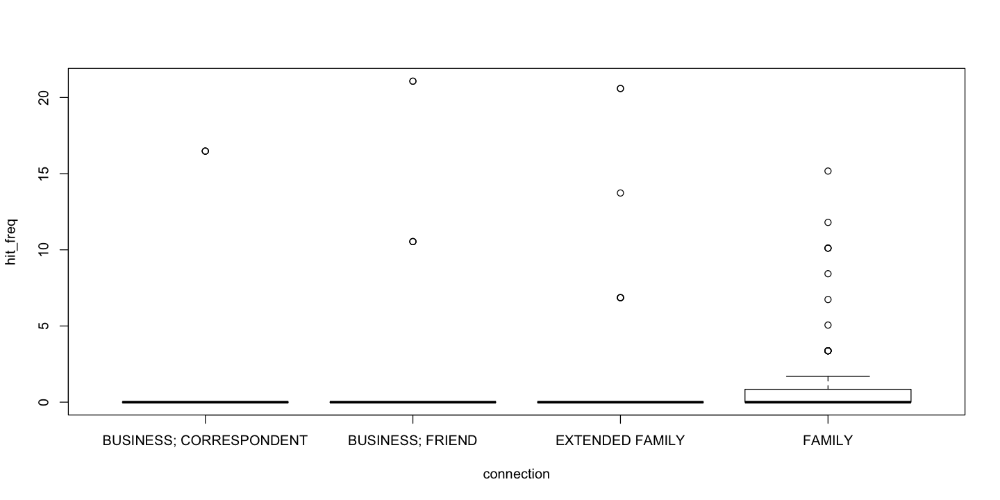

In [16]:
plot(hit_freq ~ connection, data=jeake_nofriend)

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 8)

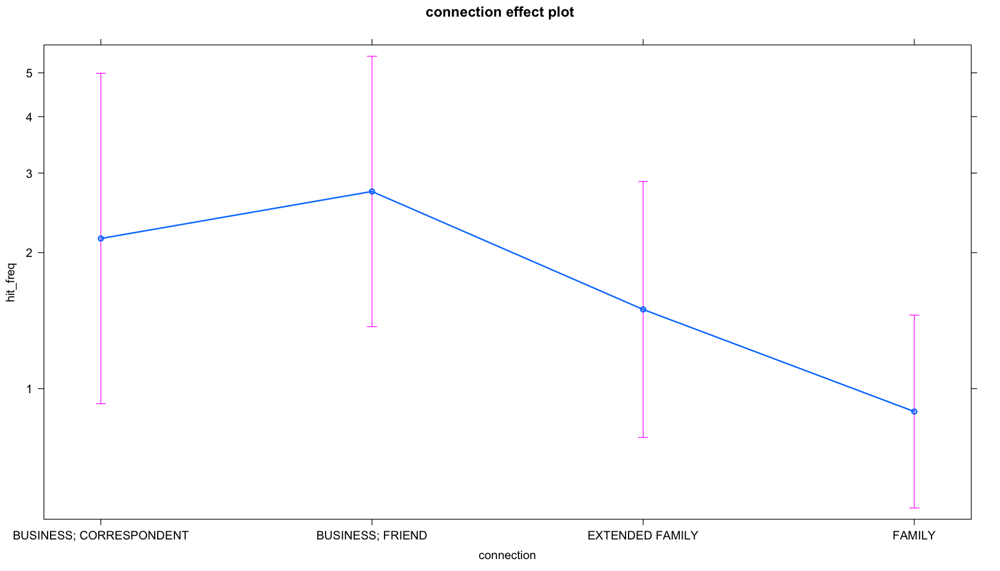

In [17]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)

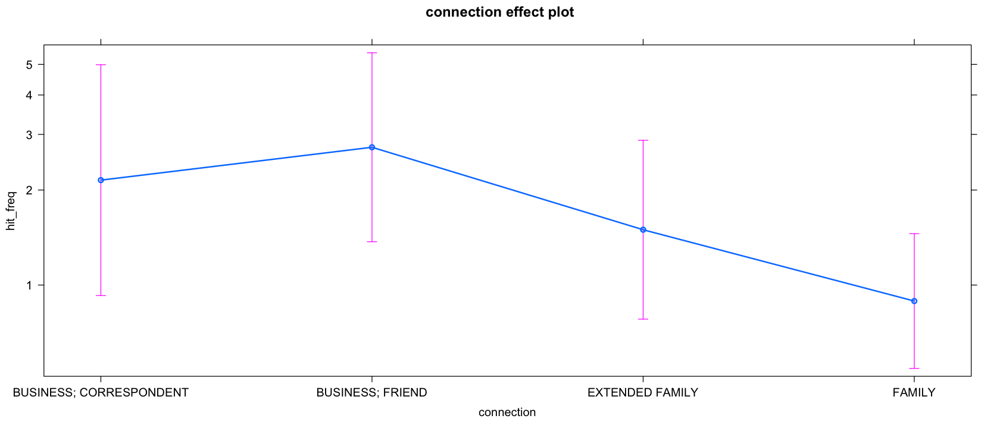

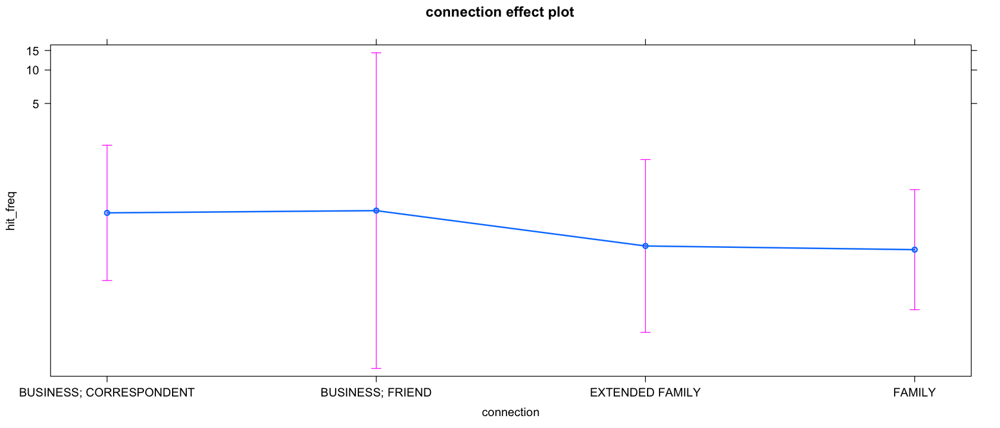

In [55]:
plot(effect("connection", j_nofriend_model))
plot(effect("connection", j_glmer1g))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.1 Generalised linear mixed-effects model using "connection" as a fixed effect and "sender" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   806.7    831.9   -396.3    792.7      265 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7472 -0.5839 -0.3589  9.7868 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.553    1.885   
Number of obs: 272, groups:  sender, 33

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                -0.15123    0.55991  -0.270   0.7871    
connectionBUSINESS; FRIEND -0.07231    1.61539  -0.045   0.9643    
connectionEXTENDED FAMILY  -0.56467    0.96370  -0.586   0.5579    
connectionFAMILY           -1.26472    0.50475  -2.506   0.0122 *  
connectionFRIEND            4.26846    0.81234   5.255 1.48e-07 ***
---
Signif. codes:  0 ‘***’

[1] "------------------------------dispersion------------------------------"

[1] 1.222563

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,806.661,NA,NA
connection,4,1019.143,220.4822,1.476231e-46



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.8596512               0.7996809               0.4887540 
                 FAMILY                  FRIEND 
              0.2426954              61.3889121 

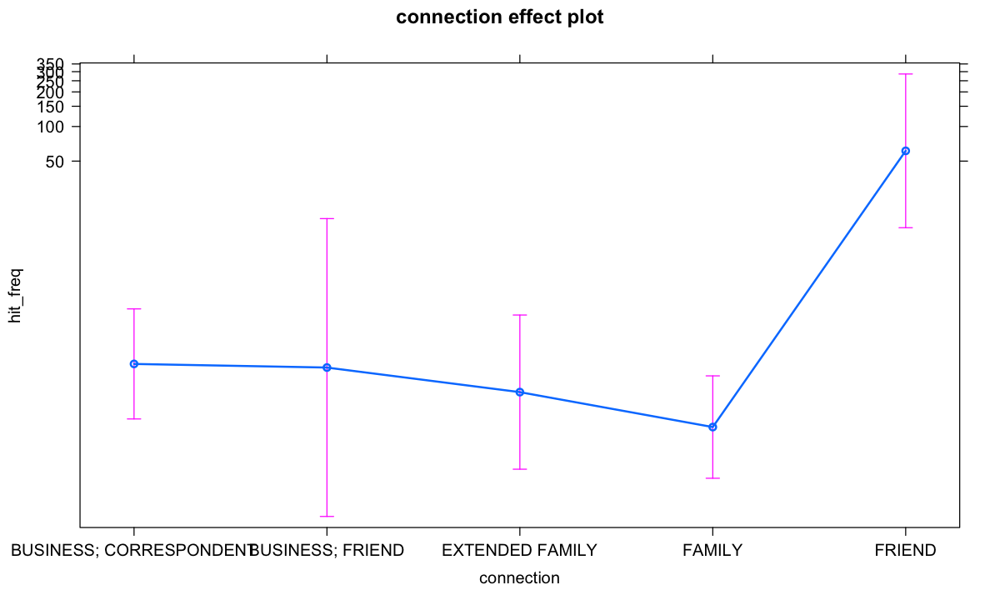

In [18]:
# negative binomial models are better at dealing with overdispersion

j_glmer1 <- glmer(hit_freq ~ connection + (1|sender),
                  data=jeake_conn,
                  family=negative.binomial(theta=1),
                  nAGQ=0L)
# setting theta to 1 makes the negative binomial distribution a poisson distribution,
# assuming equality between mean and variance
summary(j_glmer1)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1)

"------------------------------drop1------------------------------"
drop1(j_glmer1, test = "Chisq")

effect("connection", j_glmer1)

plot(effect("connection", j_glmer1))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.2 Generalised linear mixed-effects model using "connection" as a fixed effect, and "pair" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | pair)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   781.0    806.3   -383.5    767.0      265 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9347 -0.6424 -0.4726 -0.3270  9.8308 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 3.38     1.839   
Number of obs: 272, groups:  pair, 59

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -1.0383     0.6678  -1.555    0.120    
connectionBUSINESS; FRIEND   0.3884     1.4897   0.261    0.794    
connectionEXTENDED FAMILY    0.1799     0.9884   0.182    0.856    
connectionFAMILY             0.3834     0.7976   0.481    0.631    
connectionFRIEND             5.8087     1.2443   4.668 3.04e-06 ***
---
Signif. codes:  0 ‘***’ 0.0

[1] "------------------------------dispersion------------------------------"

[1] 1.152836

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,781.0186,NA,NA
connection,4,795.8550,22.83644,0.0001365175



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3540552               0.5220894               0.4238415 
                 FAMILY                  FRIEND 
              0.5194915             117.9605079 

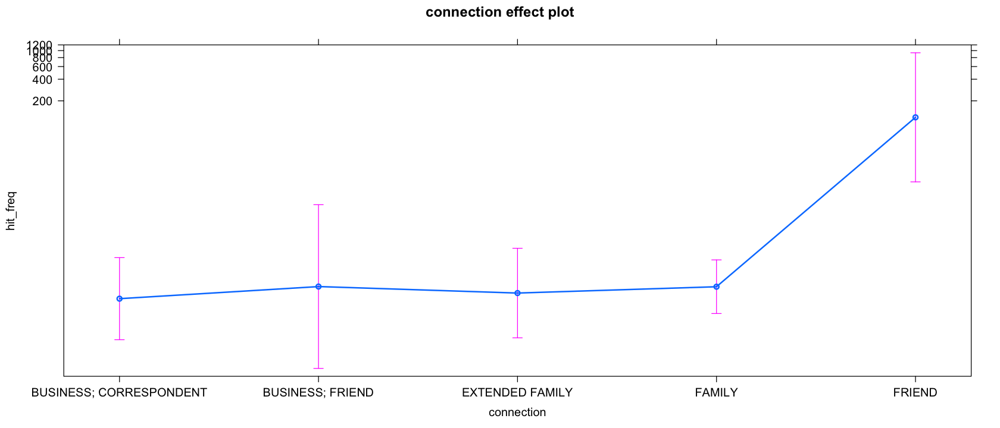

In [19]:
j_glmer1b <- glmer(hit_freq ~ connection + (1|pair),
                   data=jeake_conn,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1b)

"------------------------------drop1------------------------------"
drop1(j_glmer1b, test = "Chisq")

effect("connection", j_glmer1b)

plot(effect("connection", j_glmer1b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Using pair as a mixed effect rather than sender increases the significance of the BUSINESS;FRIEND variable. However, it's higher AIC score indicates that the model using "sender" as a mixed effect is a better fit.

### 2.3 Generalised linear mixed-effects model using "connection" as a fixed effect, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | pair) + (1 | decennium)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   780.7    809.5   -382.3    764.7      264 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9547 -0.6269 -0.4643 -0.3374  8.9614 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 3.6850   1.9196  
 decennium (Intercept) 0.1398   0.3739  
Number of obs: 272, groups:  pair, 59; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                -1.08494    0.73960  -1.467    0.142    
connectionBUSINESS; FRIEND  0.03997    1.56947   0.025    0.980    
connectionEXTENDED FAMILY  -0.02566    1.04038  -0.025    0.980    
connectionFAMILY            0.32508    0.85342   0.381    0.703    
connectionFRIEND   

[1] "------------------------------dispersion------------------------------"

[1] 1.140275

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,780.6881,NA,NA
connection,4,794.3786,21.69054,0.0002309424



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3379222               0.3517012               0.3293614 
                 FAMILY                  FRIEND 
              0.4677342             103.6523315 

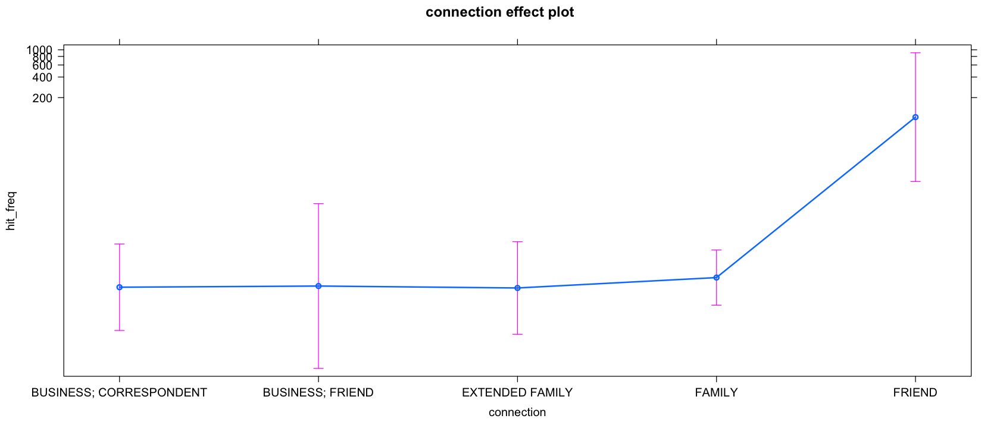

In [20]:
j_glmer1c <- glmer(hit_freq ~ connection + (1|pair) + (1|decennium),
                   data=jeake_conn,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1c)

"------------------------------drop1------------------------------"
drop1(j_glmer1c, test = "Chisq")

effect("connection", j_glmer1c)

plot(effect("connection", j_glmer1c))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.4 Generalised linear mixed-effects model using "connection" as a fixed effect, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender) + (1 | decennium)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   804.9    833.7   -394.4    788.9      264 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9528 -0.6569 -0.5220 -0.3494  9.0395 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 3.9014   1.9752  
 decennium (Intercept) 0.2011   0.4485  
Number of obs: 272, groups:  sender, 33; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -0.4180     0.6569  -0.636    0.525    
connectionBUSINESS; FRIEND  -0.2343     1.7079  -0.137    0.891    
connectionEXTENDED FAMILY   -0.6028     1.0218  -0.590    0.555    
connectionFAMILY            -1.0882     0.5717  -1.903    0.057 .  
connectionFRIEN

[1] "------------------------------dispersion------------------------------"

[1] 1.206522

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,804.8663,NA,NA
connection,4,835.1319,38.26563,9.877072e-08



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6583625               0.5208297               0.3603002 
                 FAMILY                  FRIEND 
              0.2217531              63.4886299 

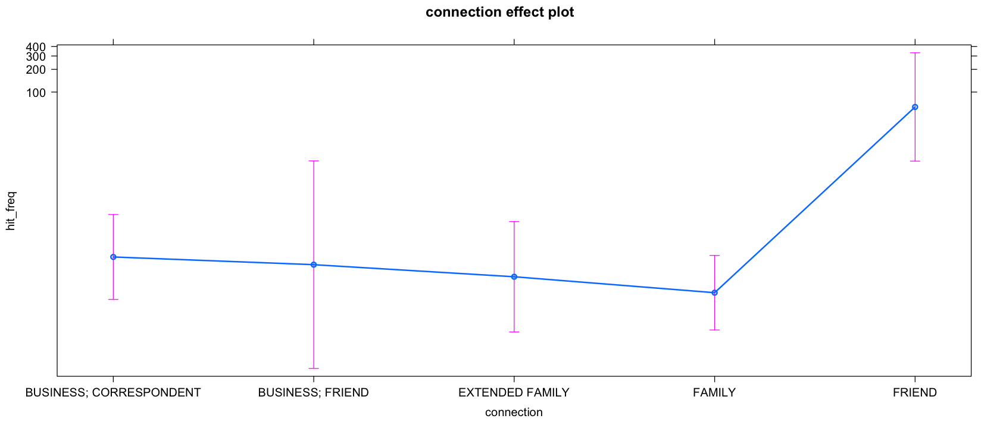

In [21]:
j_glmer1d <- glmer(hit_freq ~ connection + (1|sender) + (1|decennium),
                   data=jeake_conn,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1d)

"------------------------------drop1------------------------------"
drop1(j_glmer1d, test = "Chisq")

effect("connection", j_glmer1d)

plot(effect("connection", j_glmer1d))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

While the variables are less significant than the model using "pair" as a mixed effect, the AIC score is slightly lower. Of the four models within this category, the one with "sender" as a mixed effect provided the best fit.

Adding "decennium" to the mixed effects increases the significance of the "BUSINESS;FRIEND", "EXTENDED FAMILY" (now borderline significant) and "FRIEND" variables, while it decreases the signifance of "FAMILY": possibly it accounts for variation that was initially attributed to the fixed effect. The AIC score is lower, meaning that this model is a better fit than using "pair" as a sole random effect.

### 2.5 Generalised linear mixed-effects model using "connection" as a fixed effect and "sender" as a random effect, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   754.1    775.6   -371.0    742.1      262 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9347 -0.7455 -0.5842 -0.3944  9.7566 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.17     1.78    
Number of obs: 268, groups:  sender, 31

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                -0.07034    0.54664  -0.129    0.898  
connectionBUSINESS; FRIEND -0.10697    1.53686  -0.070    0.945  
connectionEXTENDED FAMILY  -0.60656    0.92424  -0.656    0.512  
connectionFAMILY           -1.21440    0.50399  -2.410    0.016 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
   

[1] "------------------------------dispersion------------------------------"

[1] 1.229641

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,754.0810,NA,NA
connection,3,754.6632,6.582248,0.08647469



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.9320768               0.8375226               0.5081889 
                 FAMILY 
              0.2767214 

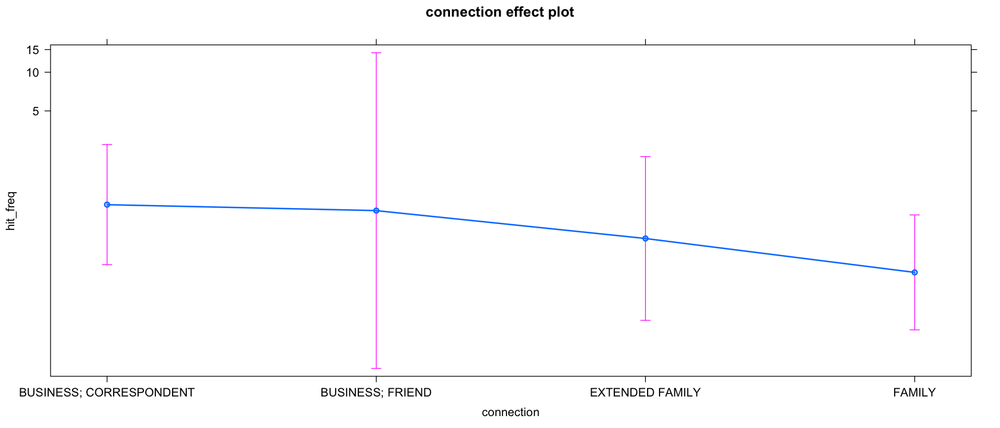

In [22]:
# experiment with running the same model without the friend variable
# to see how it impacts the sender variance

j_glmer1e <- glmer(hit_freq ~ connection + (1|sender),
                   data=jeake_nofriend,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1e)

"------------------------------drop1------------------------------"
drop1(j_glmer1e, test = "Chisq")

effect("connection", j_glmer1e)

plot(effect("connection", j_glmer1e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Without the "FRIEND" variable, there are no significant variables in the connection predictor. However, the lower AIC score suggest the model is a better fit than if the friend parameter was left in.

### 2.6 Generalised linear mixed-effects model using "connection" as a fixed effect, and "sender" and "decennium" as random effects, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender) + (1 | decennium)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   752.0    777.1   -369.0    738.0      261 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9500 -0.6505 -0.5193 -0.3726  9.1295 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 3.5332   1.880   
 decennium (Intercept) 0.2411   0.491   
Number of obs: 268, groups:  sender, 31; decennium, 10

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                 -0.3867     0.6480  -0.597   0.5506  
connectionBUSINESS; FRIEND  -0.2409     1.6380  -0.147   0.8831  
connectionEXTENDED FAMILY   -0.6336     0.9868  -0.642   0.5208  
connectionFAMILY            -0.9607     0.5757  -1.669   0.0951 .
---
Signif. codes:  0

[1] "------------------------------dispersion------------------------------"

[1] 1.212407

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,752.0020,NA,NA
connection,3,748.4552,2.453215,0.4838055



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6792752               0.5338802               0.3604615 
                 FAMILY 
              0.2598970 

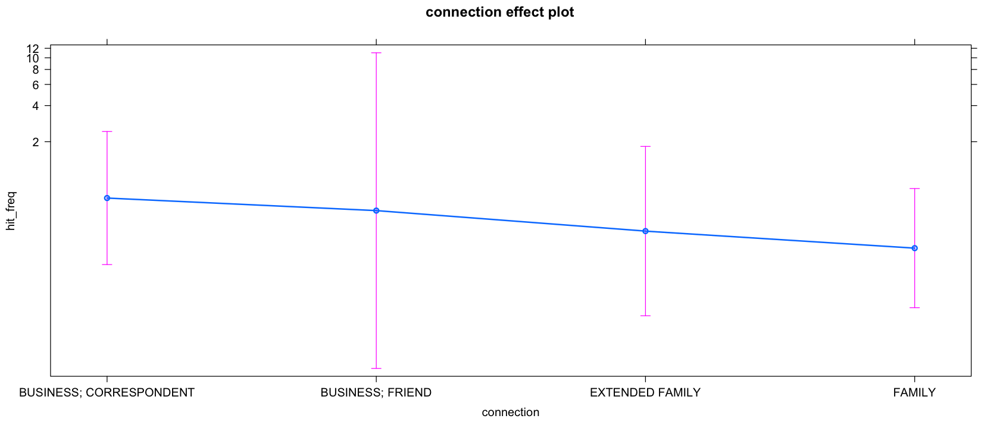

In [23]:
j_glmer1f <- glmer(hit_freq ~ connection + (1|sender) + (1|decennium),
                   data=jeake_nofriend,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1f)

"------------------------------drop1------------------------------"
drop1(j_glmer1f, test = "Chisq")

effect("connection", j_glmer1f)

plot(effect("connection", j_glmer1f))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.7 Generalised linear mixed-effects model using "connection" as a fixed effect, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender) + (1 | quinquennial)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   720.2    745.3   -353.1    706.2      261 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9711 -0.6165 -0.5151 -0.3005  9.5492 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 4.1497   2.0371  
 quinquennial (Intercept) 0.5544   0.7446  
Number of obs: 268, groups:  sender, 31; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.6574     0.7119  -0.923    0.356
connectionBUSINESS; FRIEND   0.0470     1.7681   0.027    0.979
connectionEXTENDED FAMILY   -0.6862     1.0786  -0.636    0.525
connectionFAMILY            -0.7627     0.6238  -1.223    0.221

Correlation of 

[1] "------------------------------dispersion------------------------------"

[1] 1.148485

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,720.1757,NA,NA
connection,3,715.5463,1.370521,0.7124591



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5181724               0.5431096               0.2609043 
                 FAMILY 
              0.2416838 

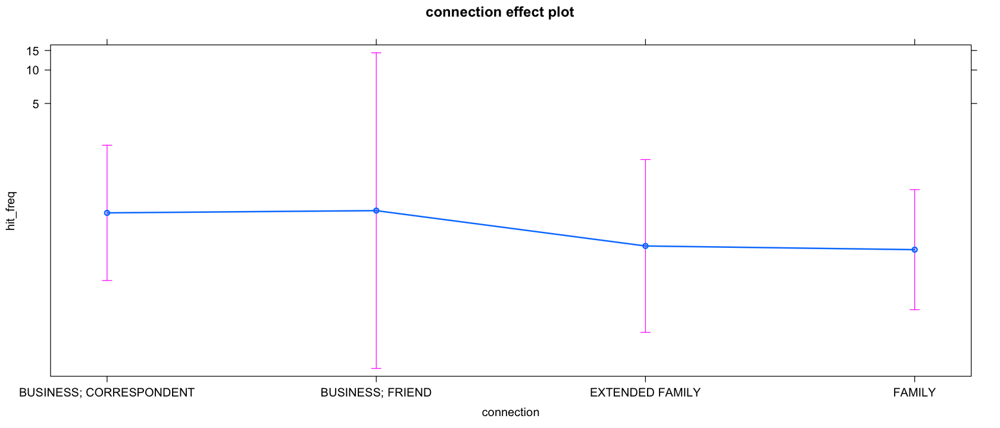

In [53]:
j_glmer1g <- glmer(hit_freq ~ connection + (1|sender) + (1|quinquennial),
                   data=jeake_nofriend,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1g)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1g)

"------------------------------drop1------------------------------"
drop1(j_glmer1g, test = "Chisq")

effect("connection", j_glmer1g)

plot(effect("connection", j_glmer1g))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Removing the "FRIEND" variable while adding "sender" and "quinquennial" as random effects results in the best fitting model. "EXTENDED FAMILY" is borderline significant, but it doesn't reach the 0.05 treshold.

### 3 Generalised linear mixed-effects model using "connection" as a fixed effect, and "sender" and "year" as random effects, negative binomial

In [20]:
j_glmer2 <- glmer(hit_freq ~ connection + (1|sender) + (1|year),
                  data=jeake_nofriend,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer2)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender) + (1 | year)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   671.5    696.4   -328.7    657.5      251 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9713 -0.6377 -0.4728 -0.2743  9.1438 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.316    1.821   
 year   (Intercept) 1.162    1.078   
Number of obs: 258, groups:  sender, 31; year, 28

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.3872     0.7829  -0.495    0.621
connectionBUSINESS; FRIEND  -0.4540     1.6822  -0.270    0.787
connectionEXTENDED FAMILY   -0.6279     1.0580  -0.593    0.553
connectionFAMILY            -1.1776     0.7668  -1.536    0.125

Correlation of Fixed Effects:
            (Intr) 

In [25]:
j_glmer2 <- glmer(hit_freq ~ connection + (1|sender) + (1|year),
                  data=jeake_conn,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer2)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender) + (1 | year)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   711.6    740.1   -347.8    695.6      253 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9754 -0.6376 -0.4761 -0.2730  9.0524 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 4.054    2.014   
 year   (Intercept) 1.039    1.019   
Number of obs: 261, groups:  sender, 33; year, 29

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -0.4967     0.8047  -0.617 0.537037    
connectionBUSINESS; FRIEND  -0.4174     1.8188  -0.230 0.818472    
connectionEXTENDED FAMILY   -0.5955     1.1290  -0.527 0.597859    
connectionFAMILY            -1.1892     0.7696  -1.545 0.122307    
connectionFRIEND             4.757

The low variance of "year" suggests that the effect of the year on amount of times God is called upon is consistent across different years.

In [26]:
dispersion_glmer(j_glmer2)

[1] 1.099004

In [27]:
"------------------------------drop1------------------------------"
drop1(j_glmer2, test = "Chisq")

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,711.5614,NA,NA
connection,4,729.6964,26.13496,2.972225e-05


In [28]:
effect("connection", j_glmer2)


 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6085285               0.4008612               0.3354584 
                 FAMILY                  FRIEND 
              0.1852757              70.8675334 

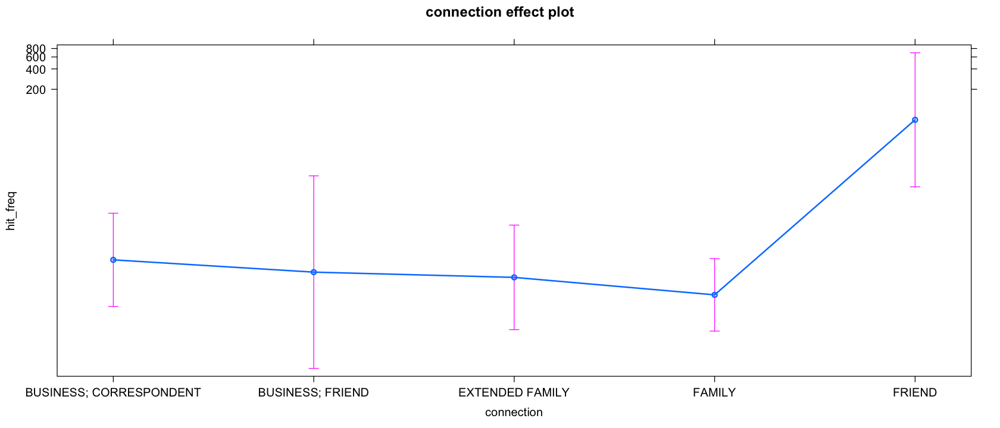

In [29]:
plot(effect("connection", j_glmer2))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 4.1 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects and "sender" as random effect, negative binomial

In [30]:
# remove "UNK" and "MULT" values from age_gap_over_20 column
j_conn_gap <- jeake_conn[!(jeake_conn$age_gap_over_20 %in% c("MULT", "UNK")),  ]
j_conn_gap$age_gap_over_20 <- droplevels(j_conn_gap$age_gap_over_20)

levels(j_conn_gap$age_gap_over_20)
nrow(j_conn_gap)

[1] "FALSE" "TRUE"

[1] 186

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   524.5    543.8   -256.2    512.5      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9343 -0.7193 -0.6720 -0.1235  7.1990 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02936  0.1714  
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 1.1228     0.2908   3.860 0.000113 ***
connectionEXTENDED FAMILY  -0.1777     0.6112  -0.291 0.771219    
connectionFAMILY           -2.1629     0.4071  -5.313 1.08e-07 ***
age_gap_over_20TRUE         0.9566     0.3214   2.976 0.002921 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of

[1] "------------------------------dispersion------------------------------"

[1] 1.240854

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,524.4927,NA,NA
connection,2,533.3710,12.878243,0.001597810
age_gap_over_20,1,531.2314,8.738641,0.003115366



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       5.3283436        4.4606929        0.6127256 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5034227 1.3102690 

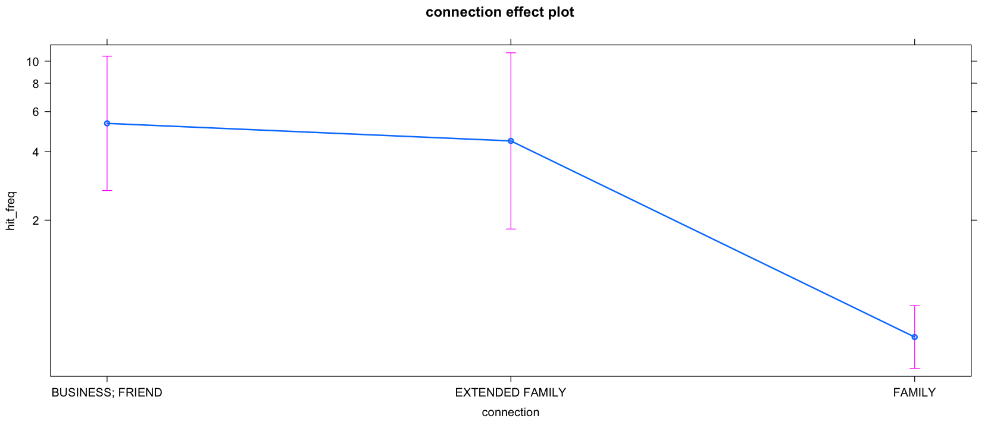

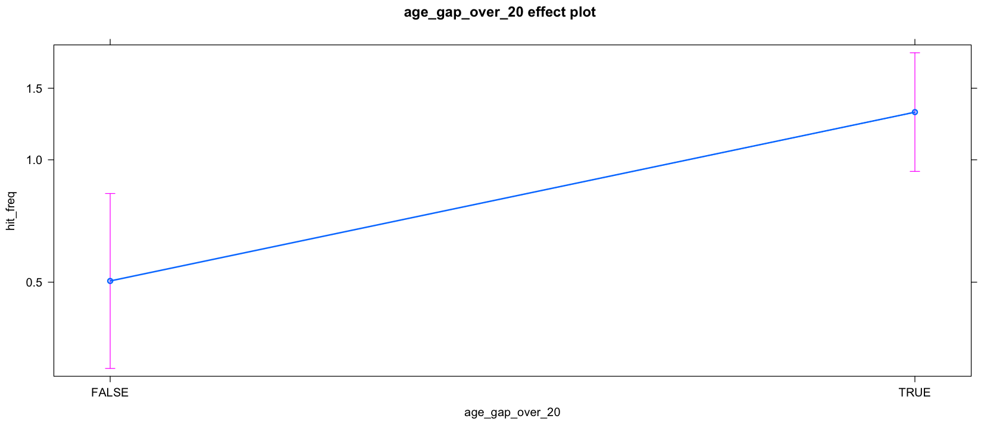

In [31]:
j_glmer3 <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3)

"------------------------------drop1------------------------------"
drop1(j_glmer3, test = "Chisq")

effect("connection", j_glmer3)
effect("age_gap_over_20", j_glmer3)

plot(effect("connection", j_glmer3))
plot(effect("age_gap_over_20", j_glmer3))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"age_gap_over_20" is a significant predictor. There is a moderate negative correlation with "FAMILY", so if the age gap within this connection group is larger than 20 years, the number of divine appeals decrease. However, given that the effect is small compared to the other variables, the impact on the hit frequency is low.

### 4.2 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "pair" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | pair)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   519.9    539.3   -254.0    507.9      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9349 -0.7477 -0.5285 -0.1302  6.2118 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 0.3182   0.5641  
Number of obs: 186, groups:  pair, 24

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)                1.12276    0.61107   1.837  0.06616 . 
connectionEXTENDED FAMILY  0.01162    0.98978   0.012  0.99064   
connectionFAMILY          -2.00237    0.72439  -2.764  0.00571 **
age_gap_over_20TRUE        0.54645    0.47181   1.158  0.24678   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Ef

[1] "------------------------------dispersion------------------------------"

[1] 1.207249

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,519.9242,NA,NA
connection,2,524.3681,8.443906,0.01466996
age_gap_over_20,1,519.0568,1.132604,0.28722066



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       4.2085535        4.2577260        0.5682162 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5795846 1.0010079 

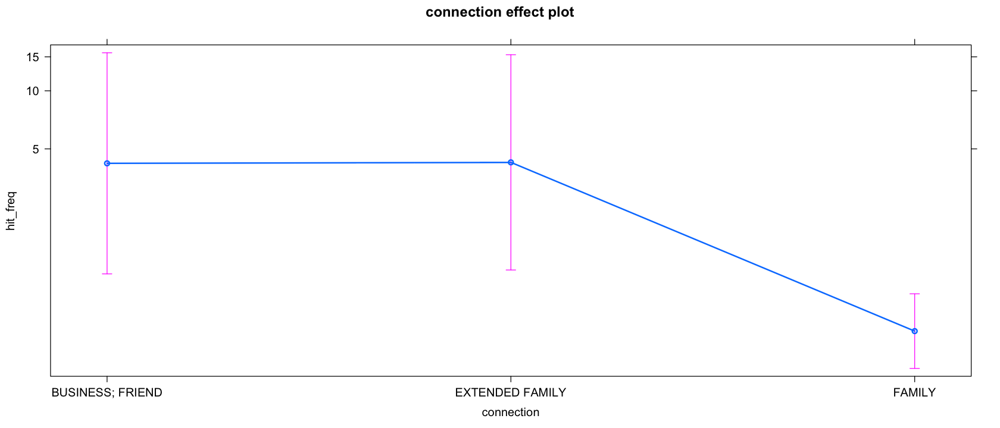

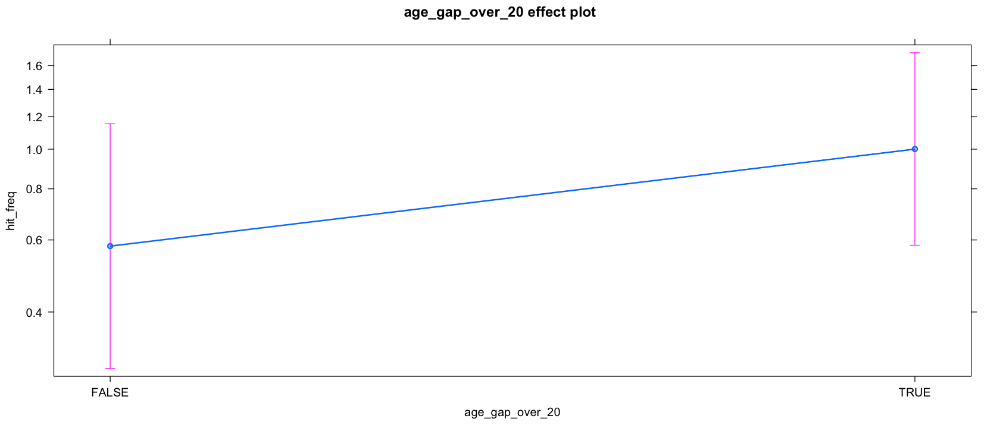

In [32]:
j_glmer3b <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|pair),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3b)

"------------------------------drop1------------------------------"
drop1(j_glmer3b, test = "Chisq")

effect("connection", j_glmer3b)
effect("age_gap_over_20", j_glmer3b)

plot(effect("connection", j_glmer3b))
plot(effect("age_gap_over_20", j_glmer3b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"age_gap_over_20" is no longer a significant predictor when the mixed effect is replaced with correspondent pairs rather than the sender.

### 4.3 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender) + (1 |  
    decennium)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   519.7    542.3   -252.9    505.7      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9349 -0.6605 -0.5385 -0.1197  8.9940 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 0.0000   0.0000  
 decennium (Intercept) 0.2821   0.5312  
Number of obs: 186, groups:  sender, 12; decennium, 10

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 0.5931     0.3610   1.643 0.100443    
connectionEXTENDED FAMILY  -0.3928     0.6579  -0.597 0.550510    
connectionFAMILY           -1.9116     0.4248  -4.500  6.8e-06 ***
age_gap_over_20TRUE         1.2074     0.3660   3.298 0.000972 

[1] "------------------------------dispersion------------------------------"

[1] 1.210381

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,519.7311,NA,NA
connection,2,527.6663,11.93519,0.0025603866
age_gap_over_20,1,529.5261,11.79497,0.0005939086



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.6241422        2.4469401        0.5358282 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.3625153 1.2124876 

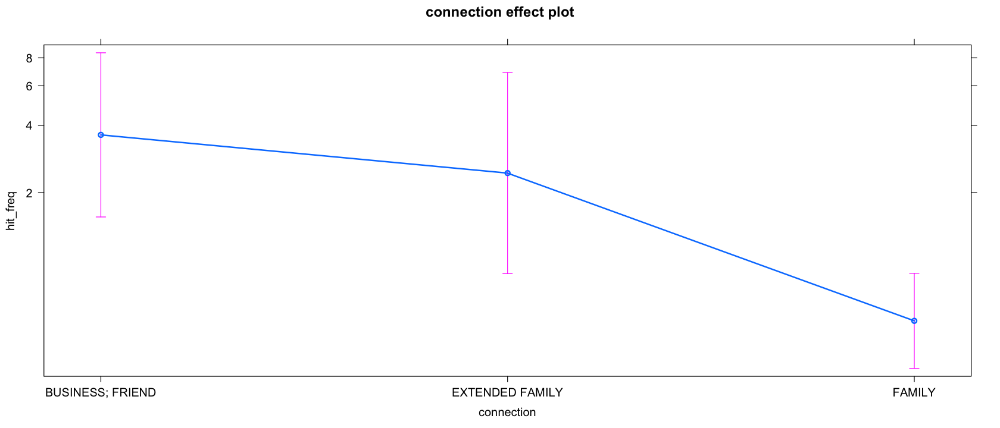

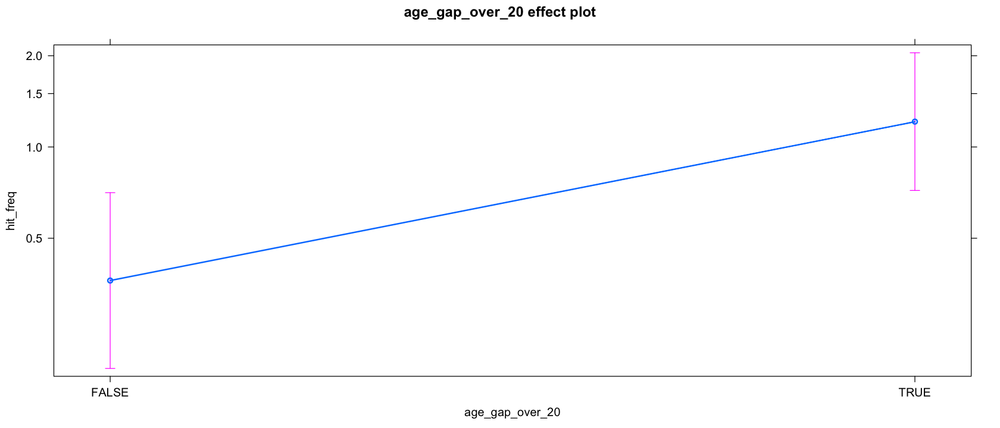

In [33]:
j_glmer3c <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender) + (1|decennium),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3c)

"------------------------------drop1------------------------------"
drop1(j_glmer3c, test = "Chisq")

effect("connection", j_glmer3c)
effect("age_gap_over_20", j_glmer3c)

plot(effect("connection", j_glmer3c))
plot(effect("age_gap_over_20", j_glmer3c))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

No variance or standard deviation on the "sender" mixed effect. This model is unreliable.

### 4.4 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | pair) + (1 | decennium)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   519.8    542.4   -252.9    505.8      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9385 -0.6569 -0.5254 -0.1233  8.0939 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 0.1493   0.3864  
 decennium (Intercept) 0.1717   0.4143  
Number of obs: 186, groups:  pair, 24; decennium, 10

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)                 0.7194     0.5189   1.387  0.16557   
connectionEXTENDED FAMILY  -0.1373     0.8594  -0.160  0.87303   
connectionFAMILY           -1.8661     0.5993  -3.114  0.00185 **
age_gap_over_20TRUE         0.8879     0.4351   2.041  0.04129 * 
---
Signif.

[1] "------------------------------dispersion------------------------------"

[1] 1.202199

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,519.7936,NA,NA
connection,2,523.6285,7.834976,0.0198910
age_gap_over_20,1,519.7703,1.976721,0.1597363



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.4220185        2.9828725        0.5294494 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.4313421 1.0481902 

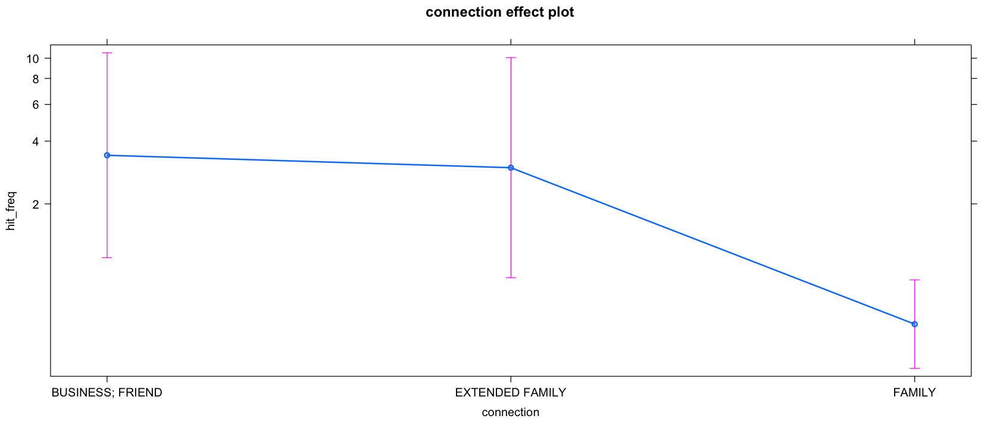

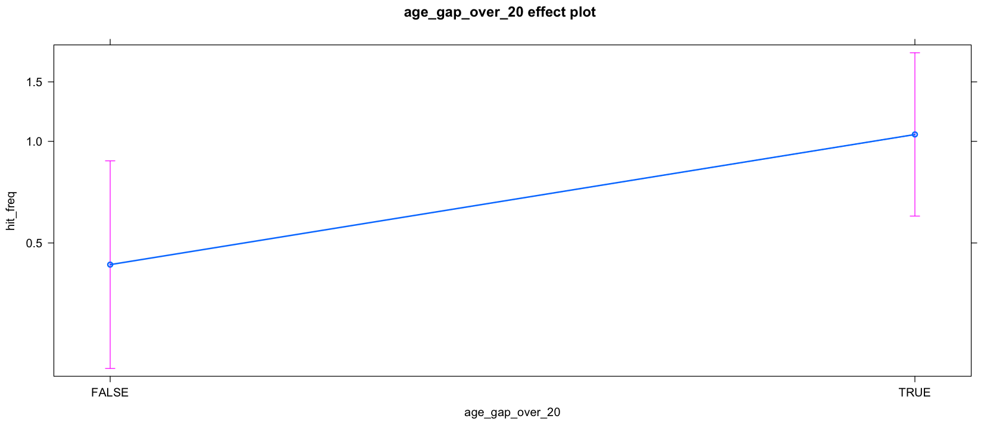

In [34]:
j_glmer3d <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|pair) + (1|decennium),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3d)

"------------------------------drop1------------------------------"
drop1(j_glmer3d, test = "Chisq")

effect("connection", j_glmer3d)
effect("age_gap_over_20", j_glmer3d)

plot(effect("connection", j_glmer3d))
plot(effect("age_gap_over_20", j_glmer3d))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

When "pair" and "decennium" are both taken as random effects, the "age_gap_over_20" becomes a highly significant predictor. The negative moderate to strong correlation with the FAMILY variable suggests that the frequency of divine appeals decreases when the age gap between the correspondents is larger than twenty years. The AIC score suggest this model is the best fit.

#### Preprocess columns from the "nofriend" subset

In [21]:
# remove "UNK" and "MULT" values from age_gap_over_20 column
jnf_gap <- jeake_nofriend[!(jeake_nofriend$age_gap_over_20 %in% c("MULT", "UNK")),  ]
jnf_gap$age_gap_over_20 <- droplevels(jnf_gap$age_gap_over_20)

# remove "UNK" and "MULT" values from sender_is_older column
jnf_old <- jeake_nofriend[!(jeake_nofriend$sender_is_older %in% c("MULT", "UNK")),  ]
jnf_old$sender_is_older <- droplevels(jnf_old$sender_is_older)

# remove "UNK" and "MULT" values from sender_over_40 column
jnf_se40 <- jeake_nofriend[!(jeake_nofriend$sender_over_40 %in% c("MULT", "UNK")),  ]
jnf_se40$sender_over_40 <- droplevels(jnf_se40$sender_over_40)

# remove "UNK" and "MULT" values from addressee_over_40 column
jnf_ad40 <- jeake_nofriend[!(jeake_nofriend$addressee_over_40 %in% c("MULT", "UNK")),  ]
jnf_ad40$addressee_over_40 <- droplevels(jnf_ad40$addressee_over_40)

# remove multigender values from gender_pair column
jnf_gender <- jeake_nofriend[!(jeake_nofriend$gender_pair %in% c("FEMALE-MULT", "MALE-MULT")),  ]
jnf_gender$gender_pair <- droplevels(jnf_gender$gender_pair)

"gender_pair:"
levels(jnf_gender$gender_pair)
nrow(jnf_gender)

"addressee_over_40:"
levels(jnf_ad40$addressee_over_40)
nrow(jnf_ad40)

"sender_over_40:"
levels(jnf_se40$sender_over_40)
nrow(jnf_se40)

"sender_is_older:"
levels(jnf_old$sender_is_older)
nrow(jnf_old)

"age_gap_over_20:"
levels(jnf_gap$age_gap_over_20)
nrow(jnf_gap)

[1] "gender_pair:"

[1] "FEMALE-FEMALE" "FEMALE-MALE"   "MALE-FEMALE"   "MALE-MALE"

[1] 266

[1] "addressee_over_40:"

[1] "FALSE" "TRUE"

[1] 257

[1] "sender_over_40:"

[1] "FALSE" "TRUE"

[1] 210

[1] "sender_is_older:"

[1] "FALSE" "TRUE"

[1] 191

[1] "age_gap_over_20:"

[1] "FALSE" "TRUE"

[1] 186

### 4.5 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender) + (1 |  
    quinquennial)
   Data: jnf_gap

     AIC      BIC   logLik deviance df.resid 
   499.9    522.5   -242.9    485.9      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9574 -0.6559 -0.5180 -0.2655  9.2405 

Random effects:
 Groups       Name        Variance Std.Dev.
 quinquennial (Intercept) 0.3865   0.6217  
 sender       (Intercept) 0.0000   0.0000  
Number of obs: 186, groups:  quinquennial, 13; sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 0.6923     0.3779   1.832  0.06698 .  
connectionEXTENDED FAMILY  -0.3046     0.6817  -0.447  0.65497    
connectionFAMILY           -1.8588     0.4604  -4.038  5.4e-05 ***
age_gap_over_20TRUE         1.0119     0.3838   2.6

[1] "------------------------------dispersion------------------------------"

[1] 1.155908

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,499.8877,NA,NA
connection,2,507.4179,11.530262,0.003134984
age_gap_over_20,1,505.4295,7.541871,0.006028141



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
        3.576688         2.637458         0.557480 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.4197433 1.1546369 

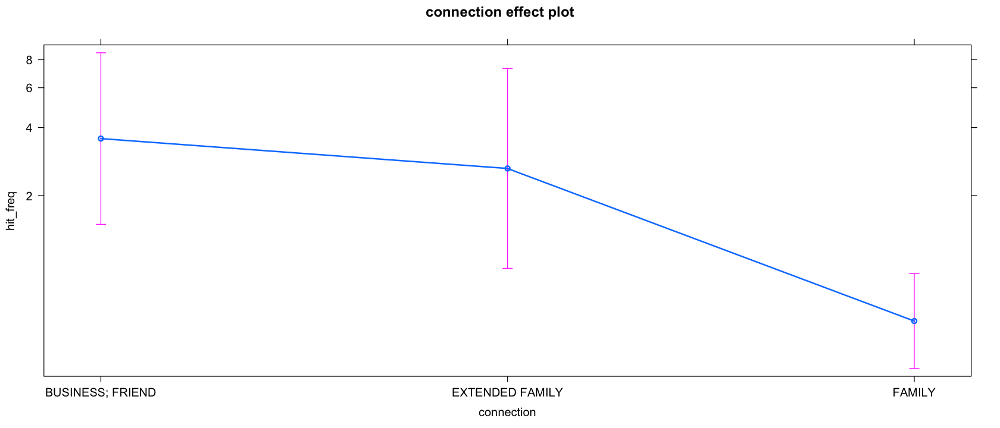

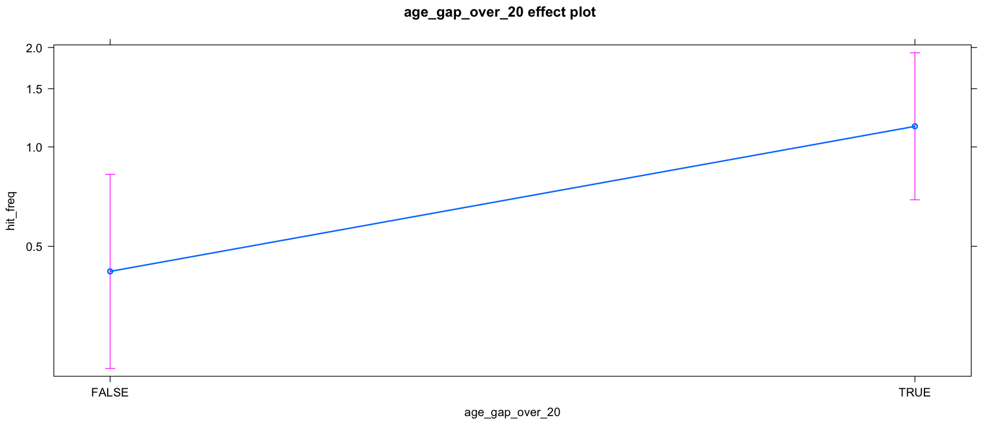

In [36]:
j_glmer3e <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender) + (1|quinquennial),
                  data=jnf_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3e)

"------------------------------drop1------------------------------"
drop1(j_glmer3e, test = "Chisq")

effect("connection", j_glmer3e)
effect("age_gap_over_20", j_glmer3e)

plot(effect("connection", j_glmer3e))
plot(effect("age_gap_over_20", j_glmer3e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"age_gap_over_20" is a significant predictor. There is a negative moderate correlation with "FAMILY", suggesting that the frequency of divine appeals decreases if the age gap in family connections is over twenty years.

### 4.6 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT, but "FRIEND" was already pruned by removing "UNK" and "MULT" values

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender)
   Data: jnf_gap

     AIC      BIC   logLik deviance df.resid 
   524.5    543.8   -256.2    512.5      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9343 -0.7193 -0.6720 -0.1235  7.1990 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02936  0.1714  
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 1.1228     0.2908   3.860 0.000113 ***
connectionEXTENDED FAMILY  -0.1777     0.6112  -0.291 0.771219    
connectionFAMILY           -2.1629     0.4071  -5.313 1.08e-07 ***
age_gap_over_20TRUE         0.9566     0.3214   2.976 0.002921 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fi

[1] "------------------------------dispersion------------------------------"

[1] 1.240854

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,524.4927,NA,NA
connection,2,533.3710,12.878243,0.001597810
age_gap_over_20,1,531.2314,8.738641,0.003115366



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       5.3283436        4.4606929        0.6127256 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5034227 1.3102690 

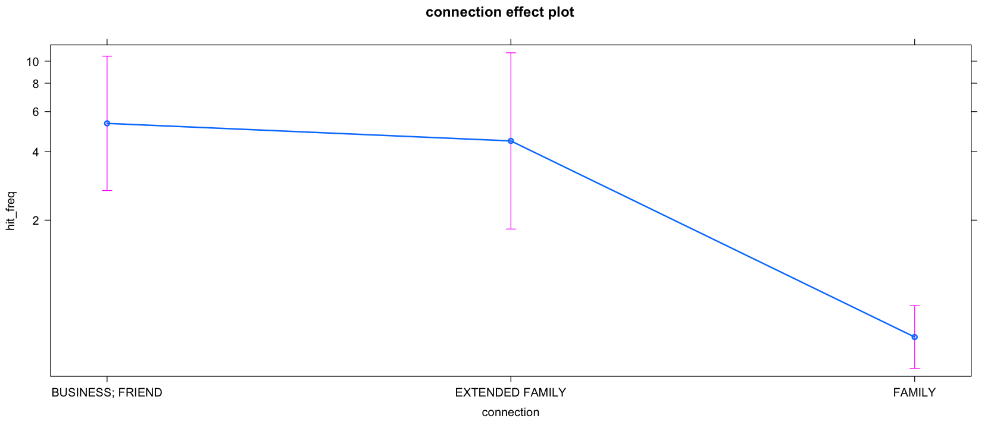

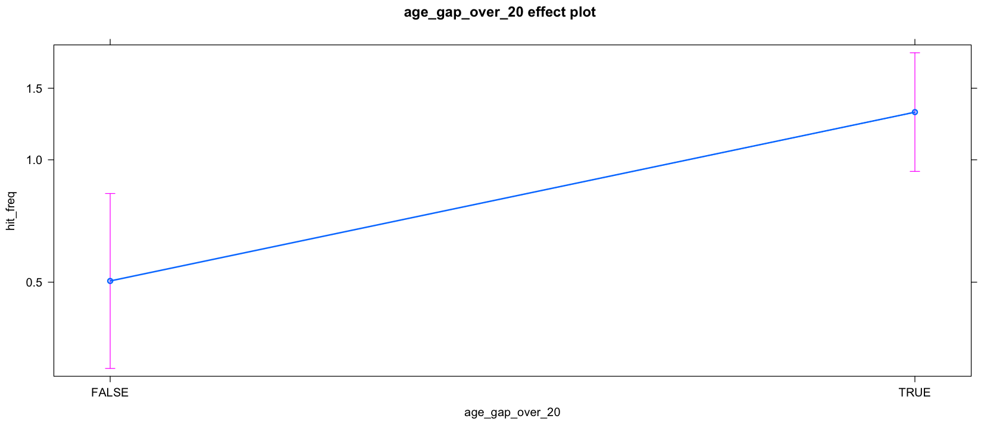

In [49]:
j_glmer3f <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender),
                  data=jnf_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3f)

"------------------------------drop1------------------------------"
drop1(j_glmer3f, test = "Chisq")

effect("connection", j_glmer3f)
effect("age_gap_over_20", j_glmer3f)

plot(effect("connection", j_glmer3f))
plot(effect("age_gap_over_20", j_glmer3f))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Returns the exact same result as the model's counterpart using jeake_conn dataset rather than the jnf_gap dataset. The "friend" variable was already removed in the process pruning the "age_gap_over_20" of its "UNK" and "MULT" values. The more complex models return 0 variance on their random effects, making this one (and the first in the series the best fit. 

### 5.1 Generalised linear mixed-effects model using "connection" and "sender_is_older" as fixed effects and "sender" as random effect, negative binomial

In [38]:
# remove "UNK" and "MULT" values from sender_is_older column
j_conn_old <- jeake_conn[!(jeake_conn$sender_is_older %in% c("MULT", "UNK")),  ]
j_conn_old$sender_is_older <- droplevels(j_conn_old$sender_is_older)

levels(j_conn_old$sender_is_older)
nrow(j_conn_old)

[1] "FALSE" "TRUE"

[1] 192

In [39]:
j_glmer4 <- glmer(hit_freq ~ connection + sender_is_older + (1|sender),
                  data=j_conn_old,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer4)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer4)

"------------------------------drop1------------------------------"
drop1(j_glmer4, test = "Chisq")

effect("connection", j_glmer4)
effect("sender_is_older", j_glmer4)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_is_older + (1 | sender)
   Data: j_conn_old

     AIC      BIC   logLik deviance df.resid 
   544.5    570.6   -264.3    528.5      184 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9351 -0.7044 -0.6664 -0.0109  7.7348 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02041  0.1428  
Number of obs: 192, groups:  sender, 13

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)  
(Intercept)                 -15.7273  1629.2615  -0.010   0.9923  
connectionBUSINESS; FRIEND   16.2185  1629.2615   0.010   0.9921  
connectionEXTENDED FAMILY    17.0210  1629.2615   0.010   0.9917  
connectionFAMILY             14.9354  1629.2615   0.009   0.9927  
connectionFRIEND             15.5782  1629.2620   0.010   0.9924  
sender_is_older

[1] "------------------------------dispersion------------------------------"

Warning message in sqrt(object$devResid()):
“NaNs produced”Warning message in sqrt(object$devResid()):
“NaNs produced”

[1] NaN

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,544.5144,NA,NA
connection,4,551.9329,15.418479,0.00390751
sender_is_older,1,545.9460,3.431596,0.06396025



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           2.335031e-07            2.581651e+00            5.760218e+00 
                 FAMILY                  FRIEND 
           7.156025e-01            1.360827e+00 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.5326629 1.0016837 

In [40]:
plot(effect("connection", j_glmer4))
plot(effect("sender_is_older", j_glmer4))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

ERROR: Error in grid::grid.pretty(range.labels): infinite axis extents [GEPretty(2.22045e-16,inf,5)]


The effects cannot be plotted. It seems that the model is suffering from perfect separations, causing extremely high standard errors and perfect correlations. Given that there are only 197 useable data points available for the sender_is_older variable, it is possible that the scarcity disables the model from making meaningful estimations with the given predictors/effects. 

### 5.2 Generalised linear model using "connection" and "sender_is_older" as predictors, quasipoisson

In [41]:
j_glm4b <- glm(hit_freq ~ connection + sender_is_older,
               data=j_conn_old,
               family=quasipoisson)

summary(j_glm4b)

"------------------------------dispersion------------------------------"
279.03 / 179

"------------------------------drop1------------------------------"
drop1(j_glm4b, test = "Chisq")

effect("connection", j_glm4b)
effect("sender_is_older", j_glm4b)


Call:
glm(formula = hit_freq ~ connection + sender_is_older, family = quasipoisson, 
    data = j_conn_old)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-3.864  -1.357  -1.357  -0.169   6.718  

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)
(Intercept)                 -13.3026  1089.2662  -0.012    0.990
connectionBUSINESS; FRIEND   13.5930  1089.2664   0.012    0.990
connectionEXTENDED FAMILY    14.4805  1089.2664   0.013    0.989
connectionFAMILY             12.3869  1089.2664   0.011    0.991
connectionFRIEND             12.9526  1089.2679   0.012    0.991
sender_is_olderTRUE           0.8324     0.5195   1.602    0.111

(Dispersion parameter for quasipoisson family taken to be 5.386706)

    Null deviance: 875.04  on 191  degrees of freedom
Residual deviance: 689.03  on 186  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 11


[1] "------------------------------dispersion------------------------------"

[1] 1.558827

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,689.0277,NA,NA
connection,4,827.5015,25.70657,3.626111e-05
sender_is_older,1,705.6235,3.08088,7.921767e-02



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           3.051187e-06            2.442427e+00            5.932879e+00 
                 FAMILY                  FRIEND 
           7.311944e-01            1.287440e+00 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.4722898 1.0856871 

In [42]:
plot(effect("connection", j_glm4b))
plot(effect("sender_is_older", j_glm4b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

ERROR: Error in grid::grid.pretty(range.labels): infinite axis extents [GEPretty(2.22045e-16,inf,5)]


Once again, we run into the same problem.

### 5.3 Generalised linear mixed-effects model using "connection" and "sender_is_older" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

In [47]:
j_glmer4c <- glmer(hit_freq ~ connection + sender_is_older + (1|sender) + (1|decennium),
                  data=j_conn_old,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer4c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer4c)

"------------------------------drop1------------------------------"
drop1(j_glmer4c, test = "Chisq")

effect("connection", j_glmer4c)
effect("sender_is_older", j_glmer4c)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_is_older + (1 | sender) + (1 |  
    decennium)
   Data: j_conn_old

     AIC      BIC   logLik deviance df.resid 
   543.3    572.7   -262.7    525.3      183 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9415 -0.7192 -0.6117 -0.0057  8.2281 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 0.0000   0.0000  
 decennium (Intercept) 0.1112   0.3335  
Number of obs: 192, groups:  sender, 13; decennium, 10

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)  
(Intercept)                 -18.0509  4428.8779  -0.004   0.9967  
connectionBUSINESS; FRIEND   18.1252  4428.8780   0.004   0.9967  
connectionEXTENDED FAMILY    19.0565  4428.8780   0.004   0.9966  
connectionFAMILY             17.1918  4428.8780   0.004   0.996

[1] "------------------------------dispersion------------------------------"

[1] 1.226738

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,543.3376,NA,NA
connection,4,549.4073,14.069745,0.007075753
sender_is_older,1,545.3844,4.046799,0.044255173



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           2.349151e-08            1.748192e+00            4.436701e+00 
                 FAMILY                  FRIEND 
           6.874171e-01            1.039296e+00 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.4668147 0.9112947 

### 5.4 Generalised linear mixed-effects model using "connection" and "sender_is_older" as fixed effects, and "pair" and "decennium" as random effects, negative binomial

In [48]:
j_glmer4d <- glmer(hit_freq ~ connection + sender_is_older + (1|pair) + (1|decennium),
                  data=j_conn_old,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer4d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer4d)

"------------------------------drop1------------------------------"
drop1(j_glmer4d, test = "Chisq")

effect("connection", j_glmer4d)
effect("sender_is_older", j_glmer4d)

ERROR: Error in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, : Downdated VtV is not positive definite


### 5.5 Generalised linear mixed-effects model using "connection" and "sender_is_older" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, "FRIEND" variable removed

In [49]:
j_glmer4e <- glmer(hit_freq ~ connection + sender_is_older + (1|sender) + (1|quinquennial),
                  data=jnf_old,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer4e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer4e)

"------------------------------drop1------------------------------"
drop1(j_glmer4e, test = "Chisq")

effect("connection", j_glmer4e)
effect("sender_is_older", j_glmer4e)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_is_older + (1 | sender) + (1 |  
    quinquennial)
   Data: jnf_old

     AIC      BIC   logLik deviance df.resid 
   516.6    542.6   -250.3    500.6      183 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9632 -0.6342 -0.5846 -0.0728  8.9829 

Random effects:
 Groups       Name        Variance  Std.Dev. 
 quinquennial (Intercept) 3.066e-01 5.537e-01
 sender       (Intercept) 7.310e-14 2.704e-07
Number of obs: 191, groups:  quinquennial, 13; sender, 12

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -19.1001  7301.8495  -0.003    0.998
connectionBUSINESS; FRIEND   19.4885  7301.8495   0.003    0.998
connectionEXTENDED FAMILY    20.3434  7301.8495   0.003    0.998
connectionFAMILY             18.4088  7301.8495   0.0

[1] "------------------------------dispersion------------------------------"

[1] 1.169741

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,516.6198,NA,NA
connection,3,524.3091,13.689249,0.003360154
sender_is_older,1,515.9719,1.352095,0.244912130



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           6.787792e-09            1.974607e+00            4.642360e+00 
                 FAMILY 
           6.707334e-01 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.5592785 0.8377192 

The problem persists.

### 6.1 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects and "sender" as random effect, negative binomial

In [51]:
# remove "UNK" and "MULT" values from sender_over_40 column
j_conn_se40 <- jeake_conn[!(jeake_conn$sender_over_40 %in% c("MULT", "UNK")),  ]
j_conn_se40$sender_over_40 <- droplevels(j_conn_se40$sender_over_40)

levels(j_conn_se40$sender_over_40)
nrow(j_conn_se40)

[1] "FALSE" "TRUE"

[1] 212

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | sender)
   Data: j_conn_se40

     AIC      BIC   logLik deviance df.resid 
   634.4    661.2   -309.2    618.4      204 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9290 -0.7498 -0.5455 -0.3055  6.8615 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 1.49     1.221   
Number of obs: 212, groups:  sender, 14

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                  1.5417     0.7250   2.126 0.033474 *  
connectionBUSINESS; FRIEND  -1.2291     1.5074  -0.815 0.414849    
connectionEXTENDED FAMILY   -2.5645     1.1512  -2.228 0.025898 *  
connectionFAMILY            -2.2877     0.6293  -3.635 0.000278 ***
connectionFRIEND             4.1325     0.9252   4.467 7.94e-06 ***
sender_ov

[1] "------------------------------dispersion------------------------------"

[1] 1.221908

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,634.3896,NA,NA
connection,4,759.2419,132.852336,9.556753e-28
sender_over_40,1,637.8427,5.453116,1.953345e-02



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              7.4490014               2.1792454               0.5732752 
                 FAMILY                  FRIEND 
              0.7560719             464.3227552 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.5885228 1.2819506 

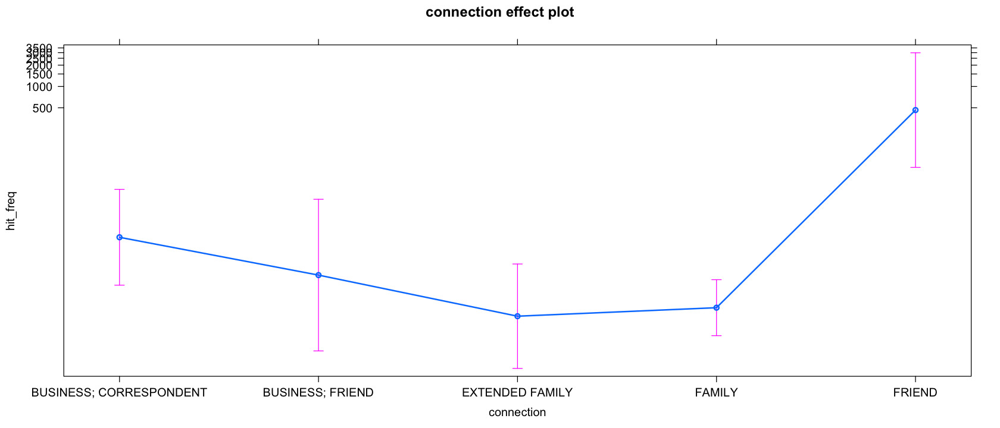

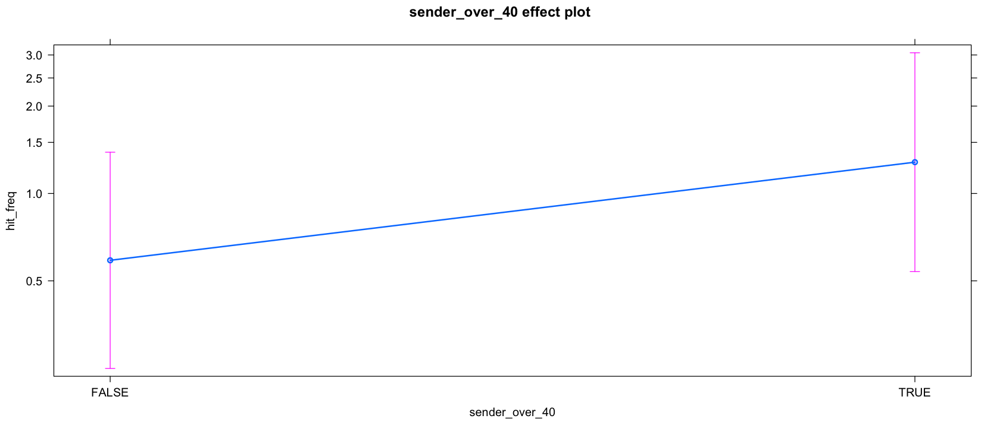

In [52]:
j_glmer5 <- glmer(hit_freq ~ connection + sender_over_40 + (1|sender),
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5)

"------------------------------drop1------------------------------"
drop1(j_glmer5, test = "Chisq")

effect("connection", j_glmer5)
effect("sender_over_40", j_glmer5)

plot(effect("connection", j_glmer5))
plot(effect("sender_over_40", j_glmer5))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"sender_over_40" is a significant predictor. There is a negative moderate correlation to FAMILY, meaning that if the sender is older than 40, the number of divine appeals used in their correspondence decreases. The effect of this variable, however, is low. There is almost no correlation to the "FRIEND" variable.

### 6.2 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | pair)
   Data: j_conn_se40

     AIC      BIC   logLik deviance df.resid 
   617.6    644.5   -300.8    601.6      204 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9313 -0.7573 -0.4890 -0.2248  5.8877 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 2.059    1.435   
Number of obs: 212, groups:  pair, 38

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                -0.34989    0.98691  -0.355    0.723    
connectionBUSINESS; FRIEND  0.09607    1.64542   0.058    0.953    
connectionEXTENDED FAMILY  -0.75075    1.40732  -0.533    0.594    
connectionFAMILY           -0.38085    1.07306  -0.355    0.723    
connectionFRIEND            6.21907    1.58271   3.929 8.52e-05 ***
sender_over_4

[1] "------------------------------dispersion------------------------------"

[1] 1.149613

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,617.6080,NA,NA
connection,4,629.9064,20.298391,0.0004360175
sender_over_40,1,616.8532,1.245173,0.2644763304



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.9925100               1.0925932               0.4684794 
                 FAMILY                  FRIEND 
              0.6781641             498.4726369 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.5301191 0.9388096 

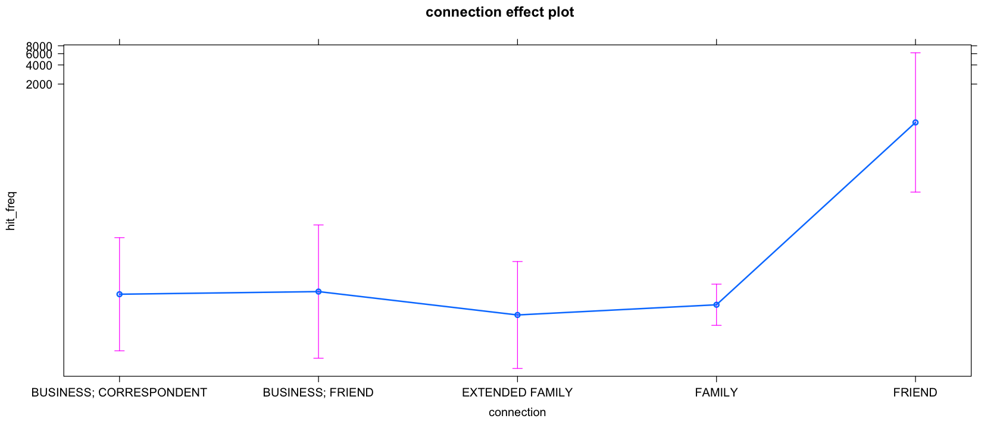

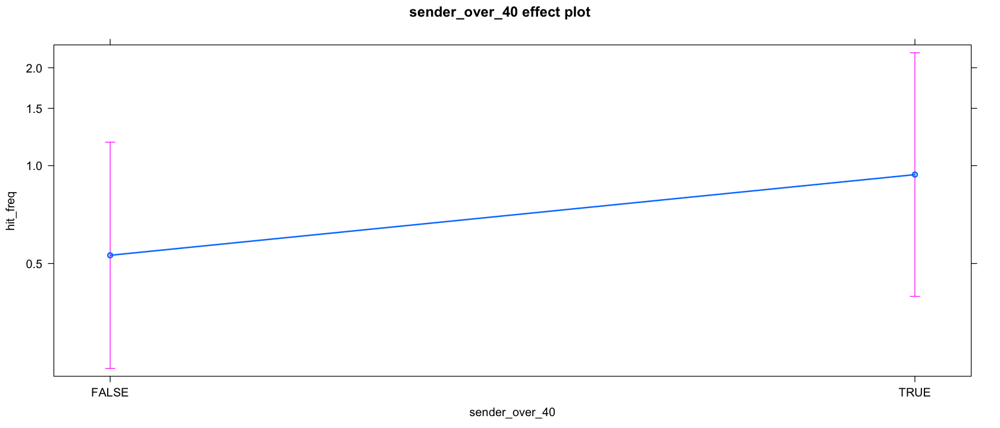

In [53]:
j_glmer5b <- glmer(hit_freq ~ connection + sender_over_40 + (1|pair),
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5b)

"------------------------------drop1------------------------------"
drop1(j_glmer5b, test = "Chisq")

effect("connection", j_glmer5b)
effect("sender_over_40", j_glmer5b)

plot(effect("connection", j_glmer5b))
plot(effect("sender_over_40", j_glmer5b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

The predictor remains significant, with the following caveat: the correlations towards the connections have lowered, and are weak.

### 6.3 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | sender) + (1 |  
    decennium)
   Data: j_conn_se40

     AIC      BIC   logLik deviance df.resid 
   631.8    662.0   -306.9    613.8      203 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9242 -0.6605 -0.5955 -0.2941  7.9970 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 1.4648   1.2103  
 decennium (Intercept) 0.3127   0.5592  
Number of obs: 212, groups:  sender, 14; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                  0.5325     0.8326   0.640  0.52243    
connectionBUSINESS; FRIEND  -1.0761     1.5174  -0.709  0.47824    
connectionEXTENDED FAMILY   -2.2755     1.1634  -1.956  0.05047 .  
connectionFAMILY            -1.6057     0.6768  -2.372  0.0

[1] "------------------------------dispersion------------------------------"

[1] 1.200025

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,631.8365,NA,NA
connection,4,666.9612,43.124655,9.749536e-09
sender_over_40,1,637.5201,7.683542,5.572669e-03



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              3.5128859               1.1976797               0.3609224 
                 FAMILY                  FRIEND 
              0.7052208             897.1610955 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.3820212 1.2791090 

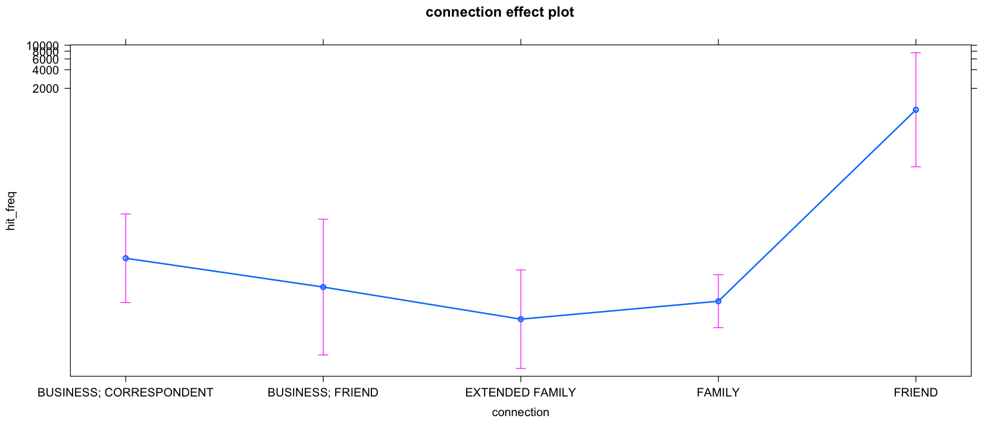

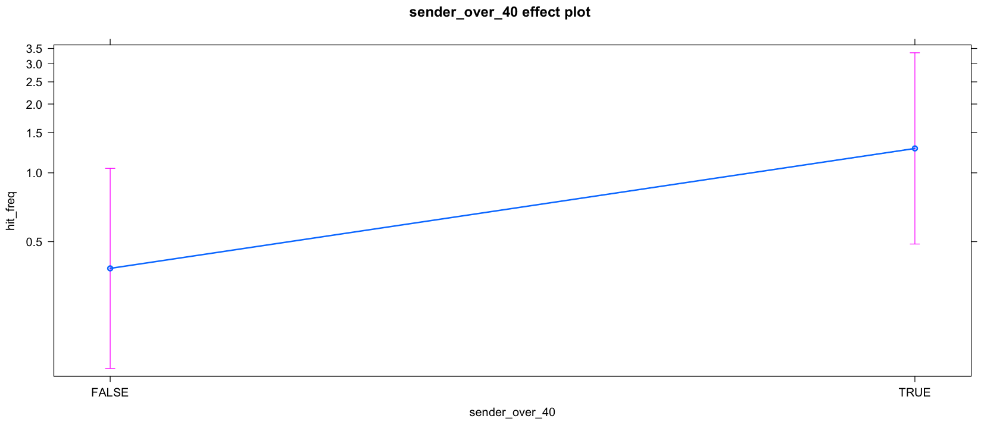

In [54]:
j_glmer5c <- glmer(hit_freq ~ connection + sender_over_40 + (1|sender) + (1|decennium),
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5c)

"------------------------------drop1------------------------------"
drop1(j_glmer5c, test = "Chisq")

effect("connection", j_glmer5c)
effect("sender_over_40", j_glmer5c)

plot(effect("connection", j_glmer5c))
plot(effect("sender_over_40", j_glmer5c))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

sender_over_40 remains a signifcant predictor, FAMILY is no longer a significant variable. There is a positive weak correlation to FRIEND.

### 6.4 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | pair) + (1 | decennium)
   Data: j_conn_se40

     AIC      BIC   logLik deviance df.resid 
   617.6    647.8   -299.8    599.6      203 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9387 -0.6710 -0.4826 -0.2246  7.6110 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 2.0751   1.4405  
 decennium (Intercept) 0.1818   0.4264  
Number of obs: 212, groups:  pair, 38; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -0.5359     1.0452  -0.513    0.608    
connectionBUSINESS; FRIEND  -0.1519     1.6788  -0.090    0.928    
connectionEXTENDED FAMILY   -0.8084     1.4162  -0.571    0.568    
connectionFAMILY            -0.3522     1.1081  -0.318    0.751    
c

[1] "------------------------------dispersion------------------------------"

[1] 1.137706

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,617.5514,NA,NA
connection,4,629.7715,20.220069,0.0004518385
sender_over_40,1,617.2340,1.682642,0.1945738003



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.8913354               0.7657606               0.3971531 
                 FAMILY                  FRIEND 
              0.6267615             551.5574012 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4356348 0.8795663 

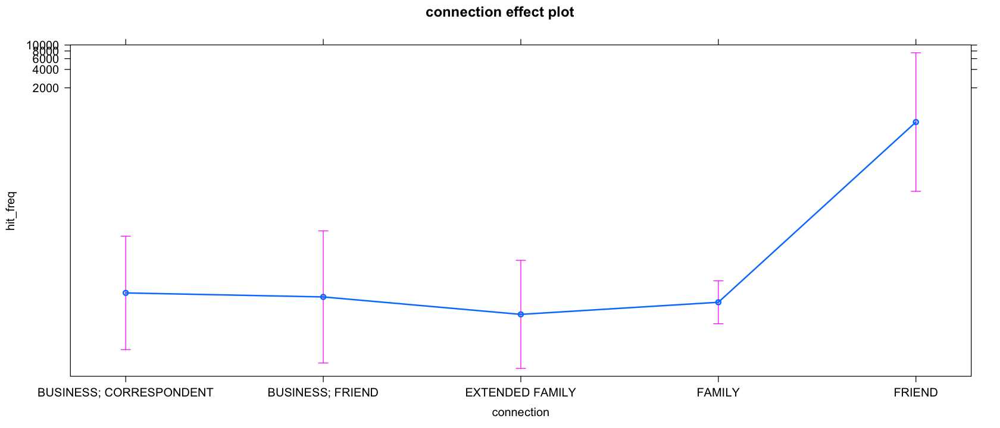

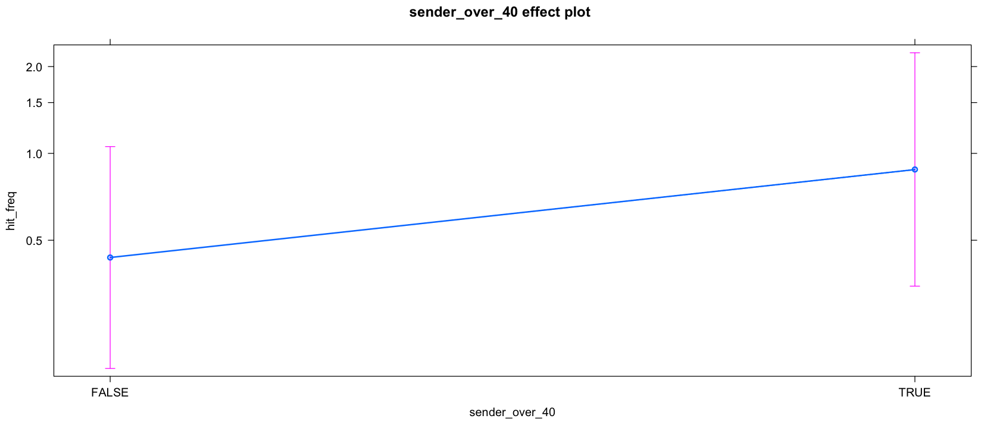

In [55]:
j_glmer5d <- glmer(hit_freq ~ connection + sender_over_40 + (1|pair) + (1|decennium),
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5d)

"------------------------------drop1------------------------------"
drop1(j_glmer5d, test = "Chisq")

effect("connection", j_glmer5d)
effect("sender_over_40", j_glmer5d)

plot(effect("connection", j_glmer5d))
plot(effect("sender_over_40", j_glmer5d))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"sender_over_40" becomes a highly significant predictor once pairs are taken into account rather than individual senders. There is a positive weak correlation with the FRIEND variable.

### 6.5 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | sender) + (1 |  
    quinquennial)
   Data: jnf_se40

     AIC      BIC   logLik deviance df.resid 
   579.7    606.5   -281.8    563.7      202 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9587 -0.6346 -0.5439 -0.2847  8.8797 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 1.6125   1.2698  
 quinquennial (Intercept) 0.5562   0.7458  
Number of obs: 210, groups:  sender, 14; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                  0.3365     0.8914   0.378   0.7058  
connectionBUSINESS; FRIEND  -0.7341     1.5995  -0.459   0.6463  
connectionEXTENDED FAMILY   -1.9976     1.2111  -1.649   0.0991 .
connectionFAMILY            -1.4103     0.7259  -1.943 

[1] "------------------------------dispersion------------------------------"

[1] 1.148248

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,579.6853,NA,NA
connection,3,579.2189,5.533629,0.13664102
sender_over_40,1,583.8565,6.171269,0.01298414



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.7914516               1.3397863               0.3786749 
                 FAMILY 
              0.6813311 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.3642185 1.1399568 

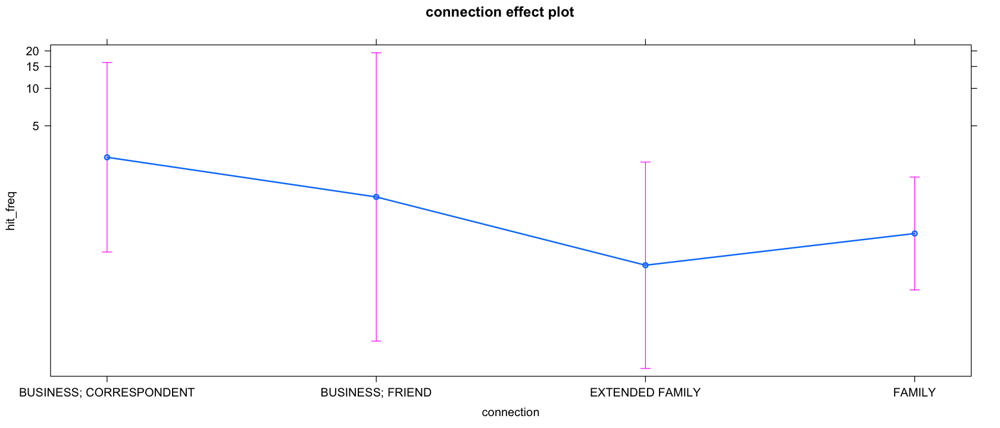

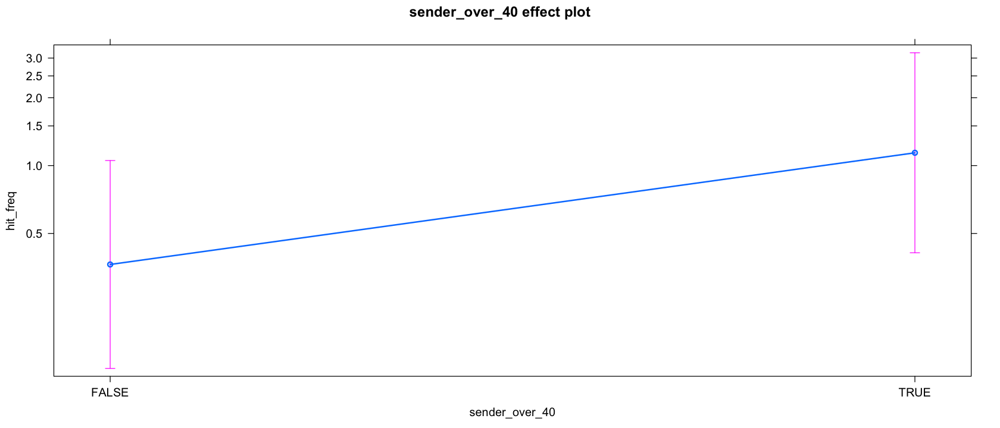

In [48]:
j_glmer5e <- glmer(hit_freq ~ connection + sender_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5e)

"------------------------------drop1------------------------------"
drop1(j_glmer5e, test = "Chisq")

effect("connection", j_glmer5e)
effect("sender_over_40", j_glmer5e)

plot(effect("connection", j_glmer5e))
plot(effect("sender_over_40", j_glmer5e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"sender_over_40" is a significant predictor. There is a negative weak correlation with "FAMILY". The "FAMILY" variable does not reach the 0.05 treshold for being significant.

### 6.6 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "pair" and "quinquennial" as random effects, negative binomial (BEST FIT)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: 
hit_freq ~ connection + sender_over_40 + (1 | pair) + (1 | quinquennial)
   Data: jnf_se40

     AIC      BIC   logLik deviance df.resid 
   564.8    591.6   -274.4    548.8      202 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9659 -0.6323 -0.4851 -0.2488  8.9635 

Random effects:
 Groups       Name        Variance Std.Dev.
 pair         (Intercept) 2.6273   1.6209  
 quinquennial (Intercept) 0.4922   0.7016  
Number of obs: 210, groups:  pair, 36; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.7244     1.1789  -0.614    0.539
connectionBUSINESS; FRIEND   0.2955     1.8979   0.156    0.876
connectionEXTENDED FAMILY   -0.7611     1.5567  -0.489    0.625
connectionFAMILY            -0.2187     1.2373  -0.177    0.860
sender_o

[1] "------------------------------dispersion------------------------------"

[1] 1.077566

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,564.7909,NA,NA
connection,3,559.2142,0.4232995,0.9353884
sender_over_40,1,563.7379,0.9470965,0.3304595



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6783134               0.9114734               0.3168751 
                 FAMILY 
              0.5450917 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.3972851 0.6927009 

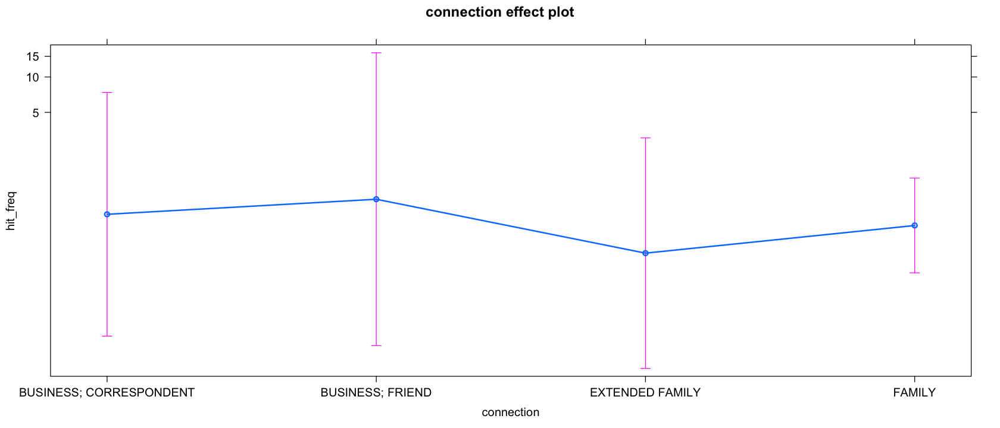

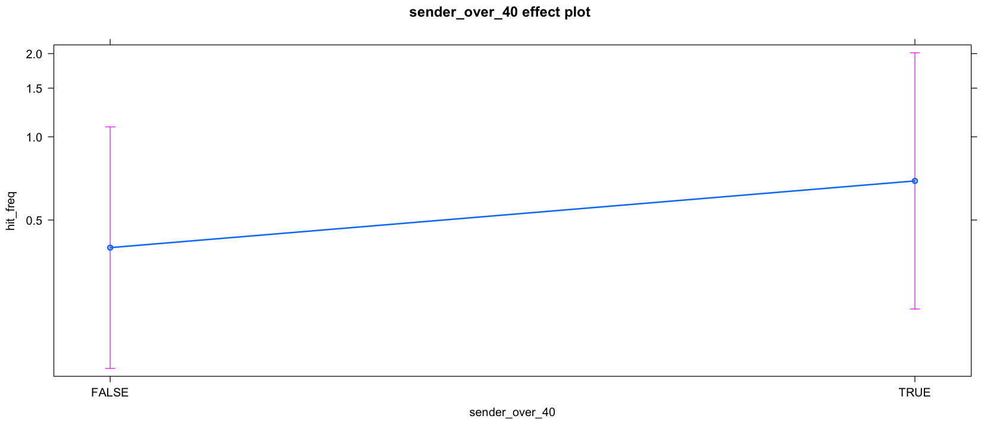

In [57]:
j_glmer5f <- glmer(hit_freq ~ connection + sender_over_40 + (1|pair) + (1|quinquennial),
                  data=jnf_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5f)

"------------------------------drop1------------------------------"
drop1(j_glmer5f, test = "Chisq")

effect("connection", j_glmer5f)
effect("sender_over_40", j_glmer5f)

plot(effect("connection", j_glmer5f))
plot(effect("sender_over_40", j_glmer5f))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

In [26]:
j_glmer5g <- glmer(hit_freq ~ connection + sender_over_40 + (1|pair) + (1|year),
                  data=jnf_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5g)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5g)

"------------------------------drop1------------------------------"
drop1(j_glmer5f, test = "Chisq")

effect("connection", j_glmer5g)
effect("sender_over_40", j_glmer5g)

plot(effect("connection", j_glmer5g))
plot(effect("sender_over_40", j_glmer5g))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | pair) + (1 | year)
   Data: jnf_se40

     AIC      BIC   logLik deviance df.resid 
   530.9    557.4   -257.5    514.9      194 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9276 -0.6094 -0.4505 -0.2574  7.6903 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 2.6666   1.6330  
 year   (Intercept) 0.7292   0.8539  
Number of obs: 202, groups:  pair, 34; year, 28

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.4564     1.2623  -0.362    0.718
connectionBUSINESS; FRIEND  -0.1787     2.0163  -0.089    0.929
connectionEXTENDED FAMILY   -0.9536     1.6417  -0.581    0.561
connectionFAMILY            -0.6269     1.3600  -0.461    0.645
sender_over_40TRUE           0.6013     0.7

[1] "------------------------------dispersion------------------------------"

[1] 1.052163

[1] "------------------------------drop1------------------------------"

ERROR: Error in drop1(j_glmer5f, test = "Chisq"): object 'j_glmer5f' not found


"sender_over_40" remains a significant predictor. It is highly significant when "pairs" are used instead of "sender". This model is the best fit. It has negative correlations, meaning that senders who are older than 40 are less inclined to appeal to God.

### 7.1 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "sender" as random effect, negative binomial

In [34]:
# remove "UNK" and "MULT" values from sender_over_40 column
j_conn_ad40 <- jeake_conn[!(jeake_conn$addressee_over_40 %in% c("MULT", "UNK")),  ]
j_conn_ad40$addressee_over_40 <- droplevels(j_conn_ad40$addressee_over_40)

levels(j_conn_ad40$addressee_over_40)
nrow(j_conn_ad40)

[1] "FALSE" "TRUE"

[1] 259

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | sender)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   724.7    753.2   -354.4    708.7      251 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9332 -0.6674 -0.5623 -0.3706  9.6899 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 2.578    1.606   
Number of obs: 259, groups:  sender, 32

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)   
(Intercept)                 -0.8794     0.7444  -1.181  0.23750   
connectionBUSINESS; FRIEND   0.8126     1.5012   0.541  0.58831   
connectionEXTENDED FAMILY    0.2717     1.0083   0.270  0.78754   
connectionFAMILY             0.1782     0.9485   0.188  0.85098   
connectionFRIEND             4.4572     1.5432   2.888  0.00387 **
addressee_ov

[1] "------------------------------dispersion------------------------------"

[1] 1.212901

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,724.7473,NA,NA
connection,4,725.3202,8.5728473,0.07270961
addressee_over_40,1,723.1198,0.3724401,0.54167721



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3991682               0.8996074               0.5238072 
                 FAMILY                  FRIEND 
              0.4770231              34.4278529 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.5512358 0.4281918 

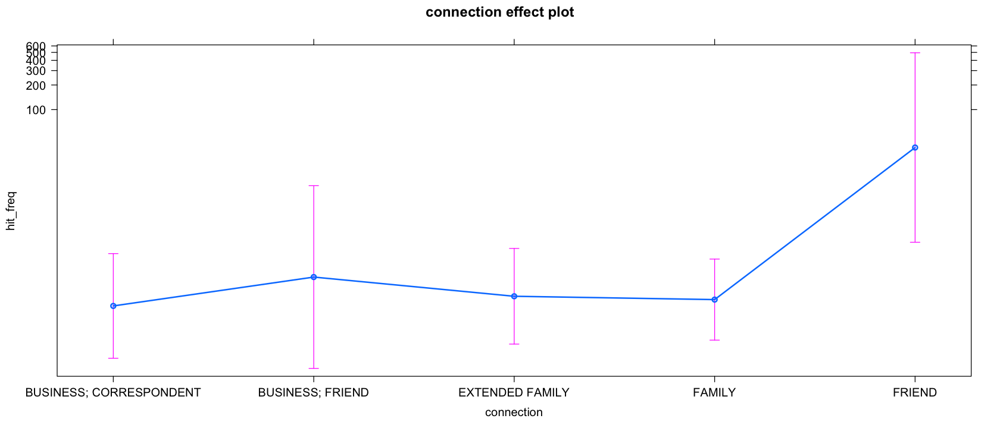

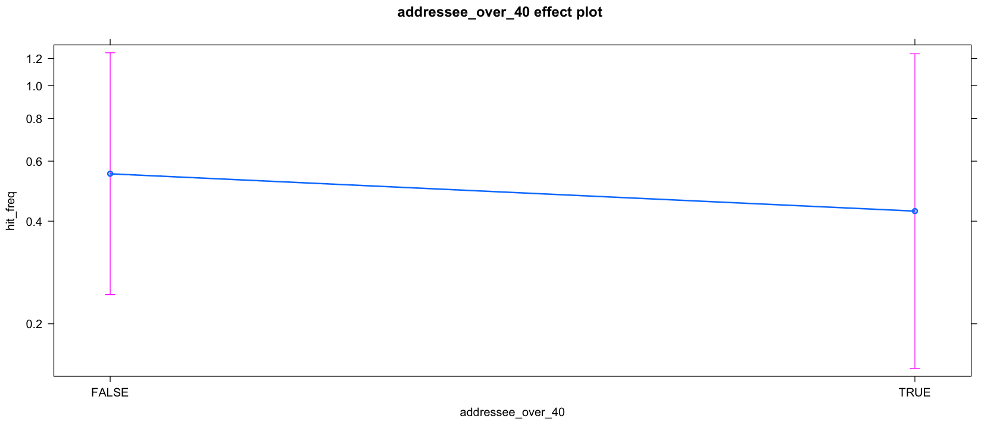

In [35]:
j_glmer6 <- glmer(hit_freq ~ connection + addressee_over_40 + (1|sender),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6)

"------------------------------drop1------------------------------"
drop1(j_glmer6, test = "Chisq")

effect("connection", j_glmer6)
effect("addressee_over_40", j_glmer6)

plot(effect("connection", j_glmer6))
plot(effect("addressee_over_40", j_glmer6))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

'addressee_over_40' shows no significance and has weak to no correlation with the other predictors. The presence of this variable would not help improve the model, as shown by the higher AIC coupled with the high p-value in the drop1 result.

### 7.2 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | pair)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   708.0    736.4   -346.0    692.0      251 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9322 -0.6358 -0.4728 -0.3695  9.7332 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 2.434    1.56    
Number of obs: 259, groups:  pair, 47

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)   
(Intercept)                -0.84688    0.72805  -1.163   0.2447   
connectionBUSINESS; FRIEND  0.80332    1.46338   0.549   0.5830   
connectionEXTENDED FAMILY   0.12203    0.96430   0.127   0.8993   
connectionFAMILY            0.04242    0.87390   0.049   0.9613   
connectionFRIEND            4.45472    1.51094   2.948   0.0032 **
addressee_over_4

[1] "------------------------------dispersion------------------------------"

[1] 1.17022

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,707.9592,NA,NA
connection,4,709.6754,9.71618402,0.04548976
addressee_over_40,1,705.9849,0.02566519,0.87272069



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.4147840               0.9261878               0.4686203 
                 FAMILY                  FRIEND 
              0.4327567              35.6846703 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.5067567 0.4089631 

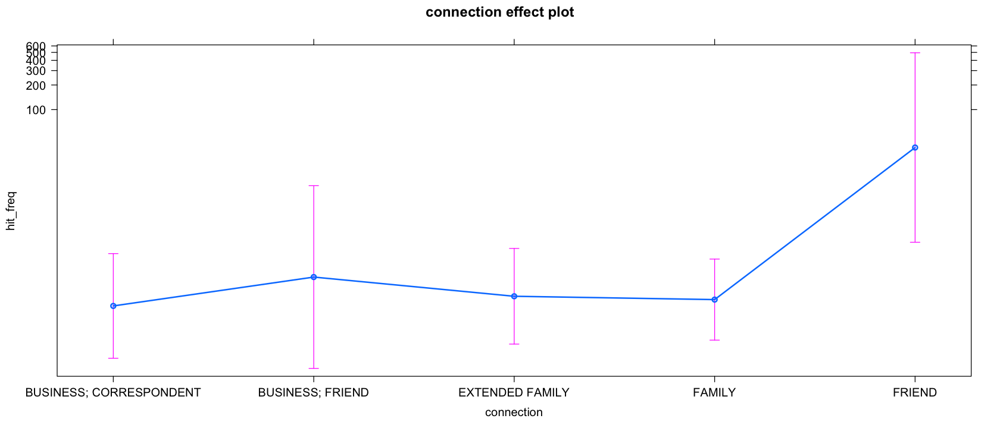

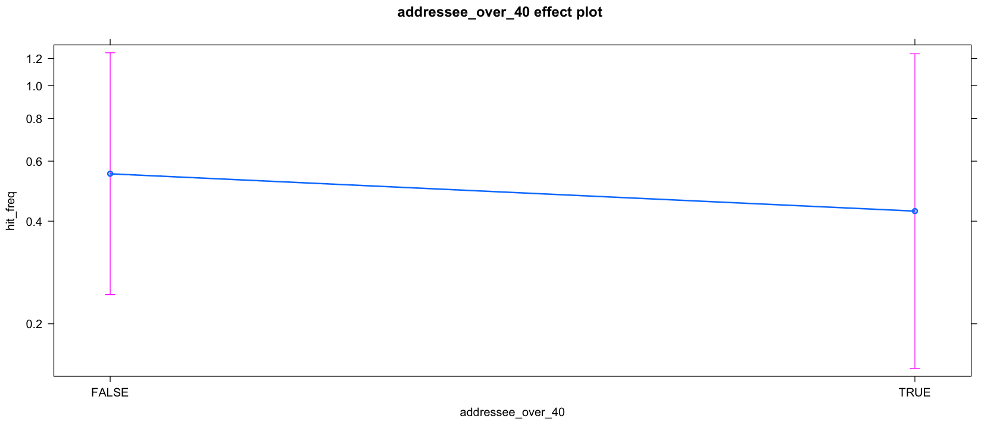

In [36]:
j_glmer6b <- glmer(hit_freq ~ connection + addressee_over_40 + (1|pair),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6b)

"------------------------------drop1------------------------------"
drop1(j_glmer6b, test = "Chisq")

effect("connection", j_glmer6b)
effect("addressee_over_40", j_glmer6b)

plot(effect("connection", j_glmer6))
plot(effect("addressee_over_40", j_glmer6))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

When using "pair" as a mixed effect, the addressee being over 40 years old become a significant predictor. The correlations to the connection types are negative and weak (but still higher than if "sender" was used as a mixed effect). The model is a slightly worse fit.

### 7.3 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | sender) + (1 |  
    decennium)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   722.9    754.9   -352.4    704.9      250 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9536 -0.6489 -0.5276 -0.3416  8.9028 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 2.9214   1.7092  
 decennium (Intercept) 0.2444   0.4944  
Number of obs: 259, groups:  sender, 32; decennium, 10

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)   
(Intercept)                -1.06371    0.83907  -1.268   0.2049   
connectionBUSINESS; FRIEND  0.47863    1.61116   0.297   0.7664   
connectionEXTENDED FAMILY   0.08274    1.07876   0.077   0.9389   
connectionFAMILY            0.14305    1.02649   0.139   0.8

[1] "------------------------------dispersion------------------------------"

[1] 1.19481

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,722.8684,NA,NA
connection,4,722.5346,7.66621088,0.1045995
addressee_over_40,1,720.9135,0.04514558,0.8317366



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3500748               0.5649700               0.3802710 
                 FAMILY                  FRIEND 
              0.4039125              24.9481186 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.4161239 0.4558961 

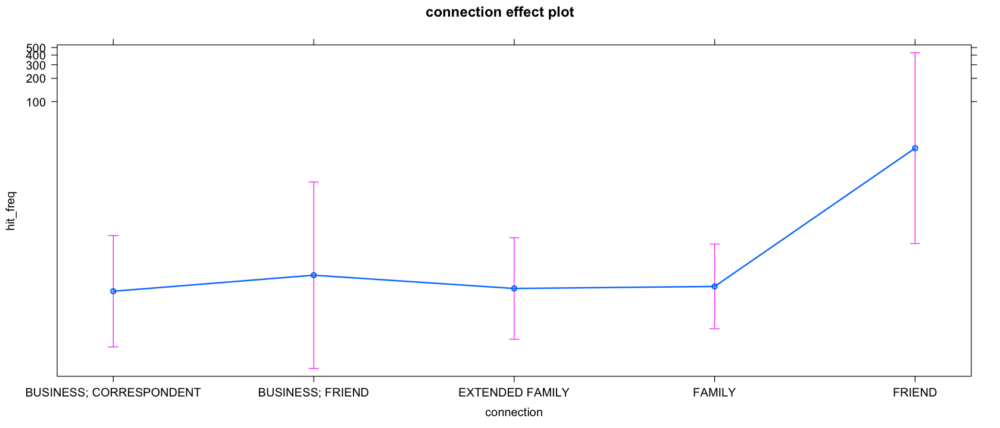

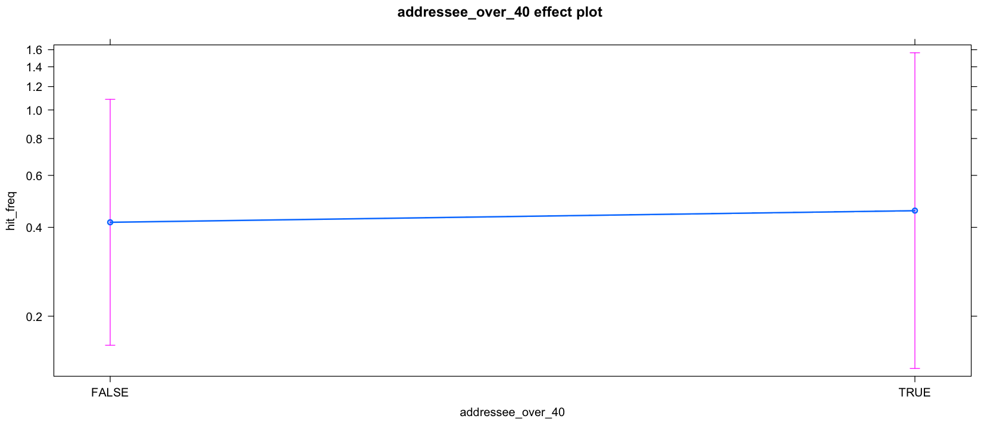

In [37]:
j_glmer6c <- glmer(hit_freq ~ connection + addressee_over_40 + (1|sender) + (1|decennium),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6c)

"------------------------------drop1------------------------------"
drop1(j_glmer6c, test = "Chisq")

effect("connection", j_glmer6c)
effect("addressee_over_40", j_glmer6c)

plot(effect("connection", j_glmer6c))
plot(effect("addressee_over_40", j_glmer6c))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

The trend is similar to the results of the model with "sender" but without "decennium" as mixed effects. ('addressee_over_40' shows no significance and has weak to no correlation with the other predictors. The presence of this variable would not help improve the model, as shown by the higher AIC coupled with the high p-value in the drop1 result). However, this model proves to be the best fit.

### 7.4 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | pair) + (1 |  
    decennium)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   707.3    739.3   -344.7    689.3      250 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9538 -0.6614 -0.4634 -0.3574  8.8525 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 2.7410   1.6556  
 decennium (Intercept) 0.1408   0.3752  
Number of obs: 259, groups:  pair, 47; decennium, 10

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)   
(Intercept)                -0.952325   0.807188  -1.180  0.23808   
connectionBUSINESS; FRIEND  0.447726   1.564628   0.286  0.77476   
connectionEXTENDED FAMILY  -0.095455   1.027807  -0.093  0.92600   
connectionFAMILY           -0.008771   0.937035  -0.009  0.9

[1] "------------------------------dispersion------------------------------"

[1] 1.156341

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,707.3054,NA,NA
connection,4,708.0373,8.731949686,0.06816004
addressee_over_40,1,705.3018,-0.003612752,1.00000000



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3789718               0.5929958               0.3444699 
                 FAMILY                  FRIEND 
              0.3756622              26.3873710 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.4064468 0.3618045 

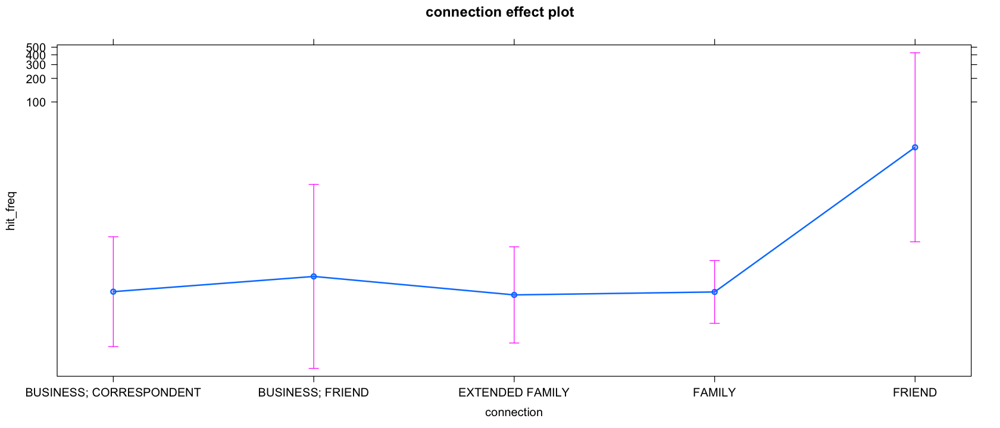

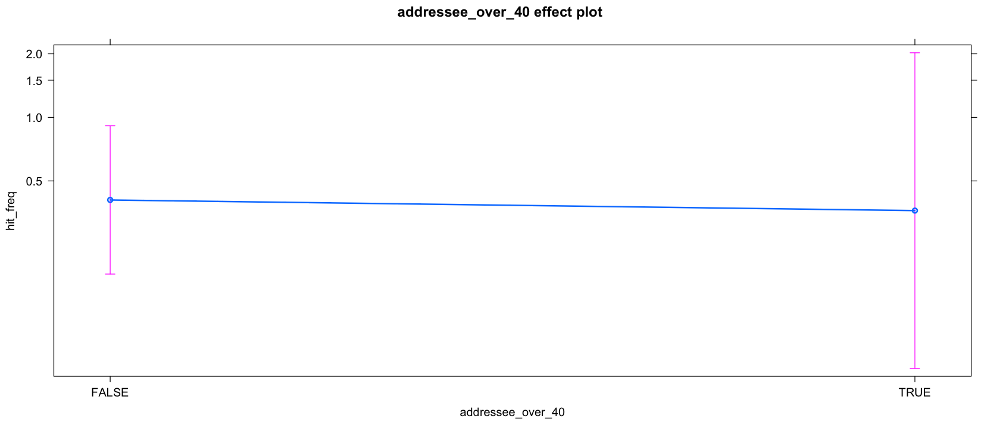

In [38]:
j_glmer6d <- glmer(hit_freq ~ connection + addressee_over_40 + (1|pair) + (1|decennium),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6d)

"------------------------------drop1------------------------------"
drop1(j_glmer6d, test = "Chisq")

effect("connection", j_glmer6d)
effect("addressee_over_40", j_glmer6d)

plot(effect("connection", j_glmer6d))
plot(effect("addressee_over_40", j_glmer6d))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 7.5 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | sender) + (1 |  
    quinquennial)
   Data: jnf_ad40

     AIC      BIC   logLik deviance df.resid 
   668.2    696.6   -326.1    652.2      249 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9708 -0.6188 -0.5116 -0.3167  9.4643 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 3.2617   1.8060  
 quinquennial (Intercept) 0.5394   0.7344  
Number of obs: 257, groups:  sender, 30; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                -1.27999    0.89245  -1.434    0.152
connectionBUSINESS; FRIEND  0.74938    1.69722   0.442    0.659
connectionEXTENDED FAMILY  -0.01384    1.14400  -0.012    0.990
connectionFAMILY            0.29406    1.07859   0.273    0.

[1] "------------------------------dispersion------------------------------"

[1] 1.131959

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,668.1901,NA,NA
connection,3,662.6444,0.45429220,0.9288121
addressee_over_40,1,666.2786,0.08848173,0.7661163



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.2841853               0.6012452               0.2802789 
                 FAMILY 
              0.3813398 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.3591322 0.4132896 

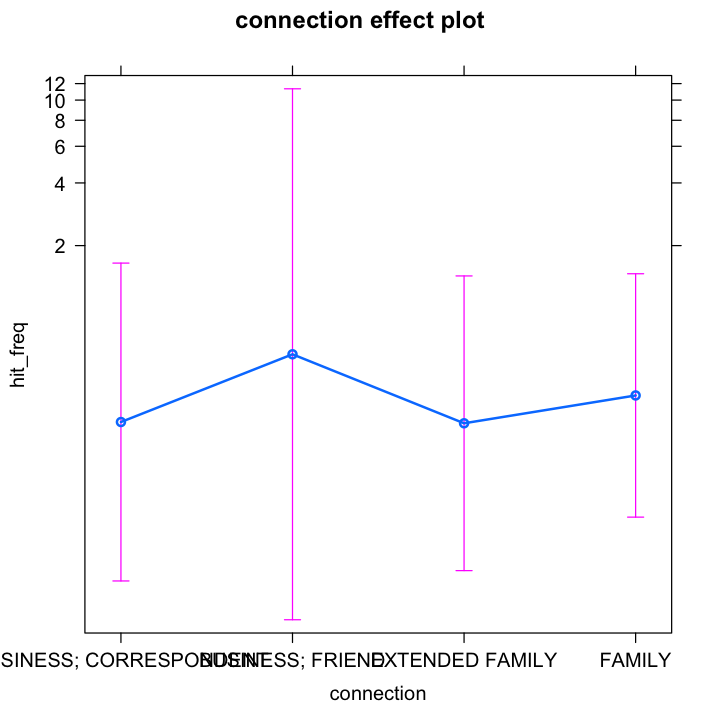

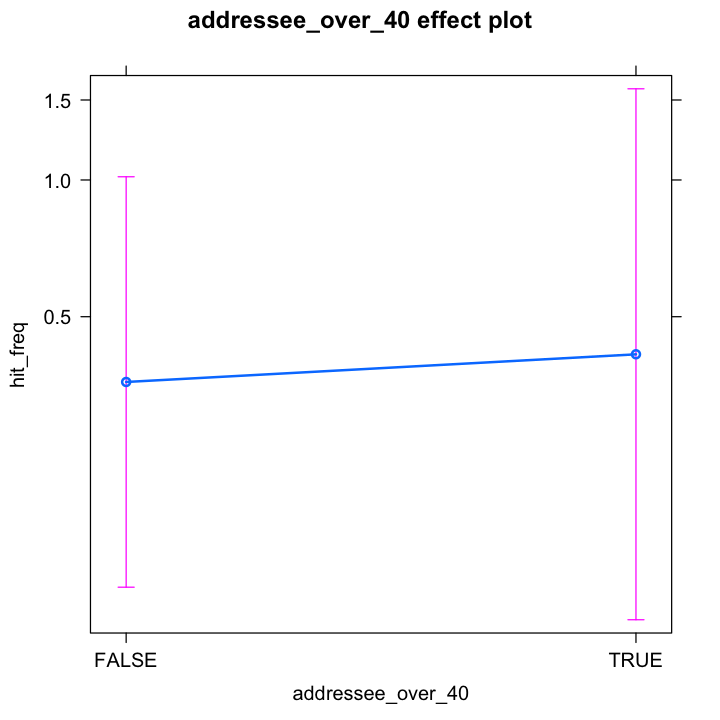

In [47]:
j_glmer6e <- glmer(hit_freq ~ connection + addressee_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6e)

"------------------------------drop1------------------------------"
drop1(j_glmer6e, test = "Chisq")

effect("connection", j_glmer6e)
effect("addressee_over_40", j_glmer6e)

plot(effect("connection", j_glmer6e))
plot(effect("addressee_over_40", j_glmer6e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"addressee_over_40" is still not a significant predictor.

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | sender) + (1 |  
    year)
   Data: jnf_ad40

     AIC      BIC   logLik deviance df.resid 
   630.0    658.1   -307.0    614.0      240 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9624 -0.6213 -0.4655 -0.2980  8.7729 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 2.588    1.609   
 year   (Intercept) 1.032    1.016   
Number of obs: 248, groups:  sender, 30; year, 27

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.4931     0.9115  -0.541    0.589
connectionBUSINESS; FRIEND  -0.2205     1.6179  -0.136    0.892
connectionEXTENDED FAMILY   -0.3744     1.1145  -0.336    0.737
connectionFAMILY            -0.6747     1.0956  -0.616    0.538
addressee_over_40TRUE       -0

[1] "------------------------------dispersion------------------------------"

[1] 1.08885

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,629.9973,NA,NA
connection,3,624.1500,0.1526347,0.9848470
addressee_over_40,1,628.2248,0.2274352,0.6334321



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5798171               0.4650730               0.3987523 
                 FAMILY 
              0.2952942 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.3621988 0.2593606 

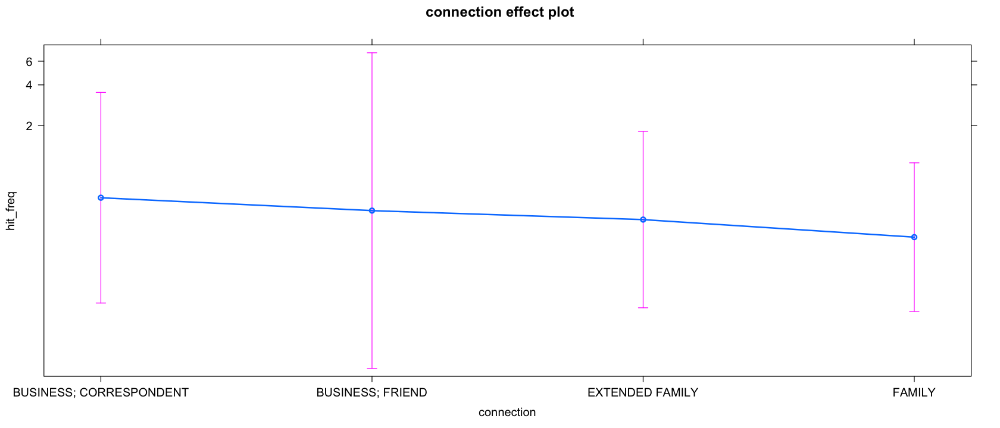

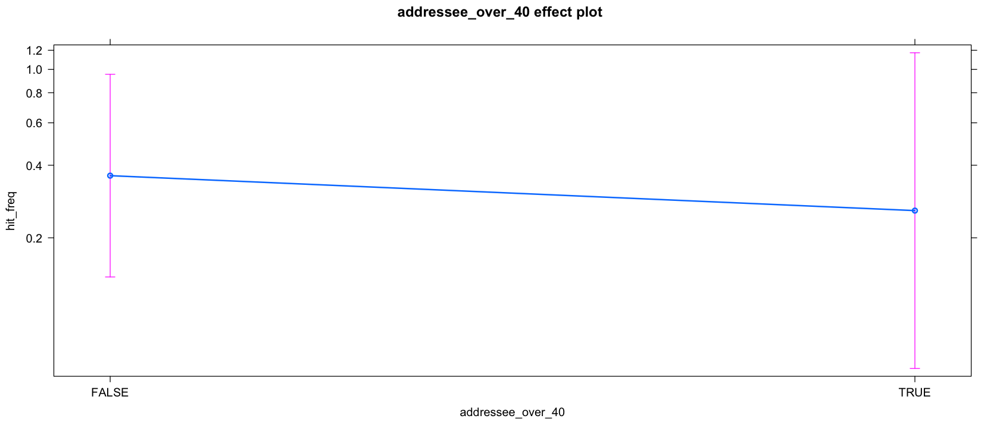

In [40]:
j_glmer6e <- glmer(hit_freq ~ connection + addressee_over_40 + (1|sender) + (1|year),
                  data=jnf_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6e)

"------------------------------drop1------------------------------"
drop1(j_glmer6e, test = "Chisq")

effect("connection", j_glmer6e)
effect("addressee_over_40", j_glmer6e)

plot(effect("connection", j_glmer6e))
plot(effect("addressee_over_40", j_glmer6e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

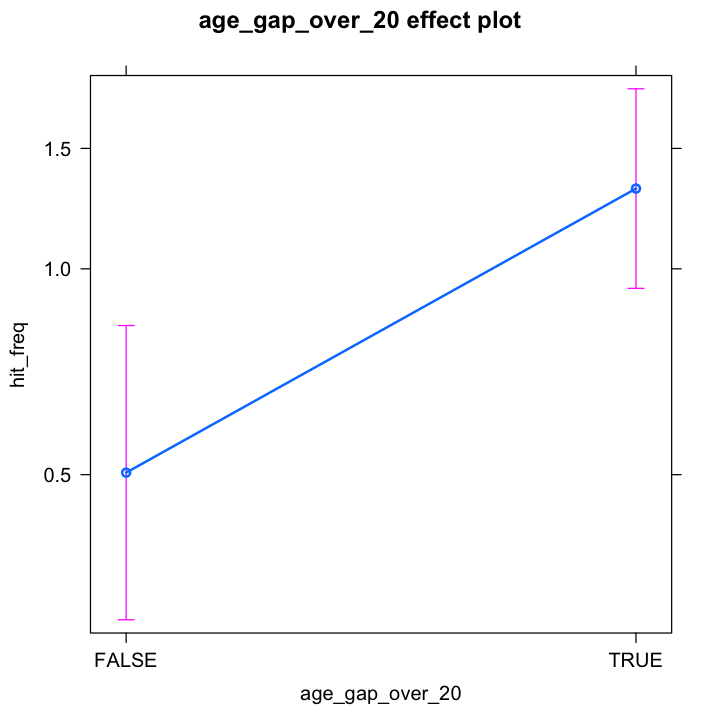

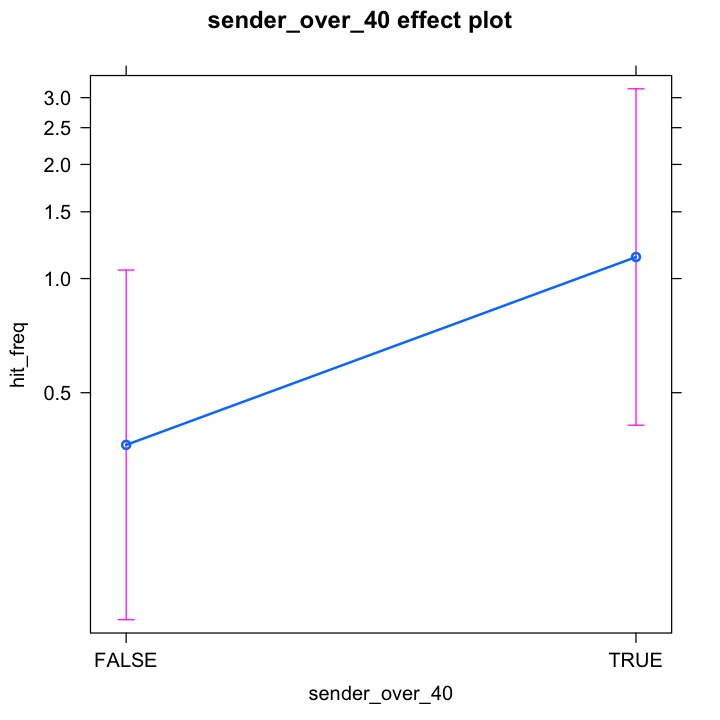

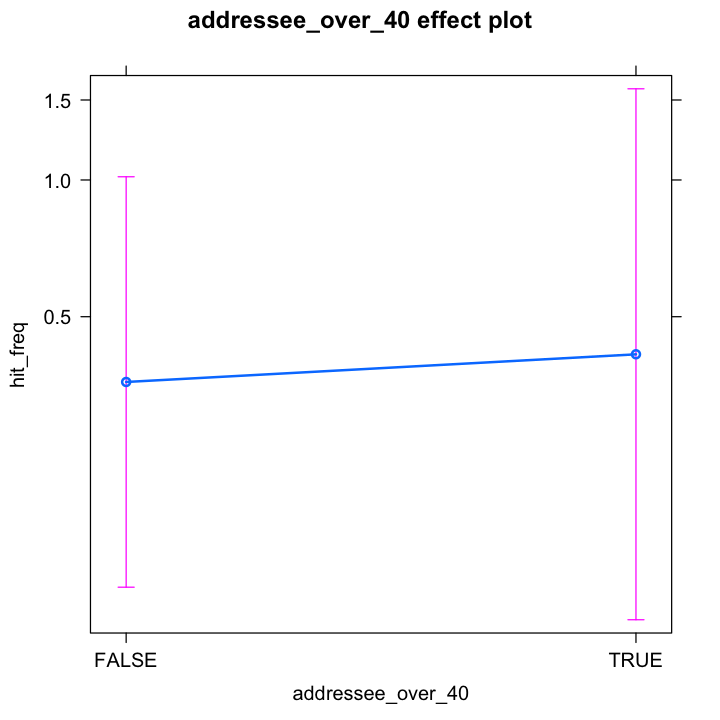

In [51]:
plot(effect("age_gap_over_20", j_glmer3f))
plot(effect("sender_over_40", j_glmer5e))
plot(effect("addressee_over_40", j_glmer6e))










par(cex.axis = 0.8)

options(repr.plot.width = 6, repr.plot.height = 6)

### 8.1 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "sender" as random effect, negative binomial

In [64]:
# remove multigender values from gender_pair column
j_conn_gender <- jeake_conn[!(jeake_conn$gender_pair %in% c("FEMALE-MULT", "MALE-MULT")),  ]
j_conn_gender$gender_pair <- droplevels(j_conn_gender$gender_pair)

levels(j_conn_gender$gender_pair)
nrow(j_conn_gender)

[1] "FEMALE-FEMALE" "FEMALE-MALE"   "MALE-FEMALE"   "MALE-MALE"

[1] 269

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | sender)
   Data: j_conn_gender

     AIC      BIC   logLik deviance df.resid 
   782.5    818.4   -381.2    762.5      259 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9347 -0.7245 -0.5785 -0.3571  9.7781 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.304    1.818   
Number of obs: 269, groups:  sender, 33

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                  0.3904     1.0279   0.380   0.7041    
connectionBUSINESS; FRIEND   0.2263     1.5736   0.144   0.8857    
connectionEXTENDED FAMILY   -0.3252     0.9883  -0.329   0.7421    
connectionFAMILY            -0.9022     0.5481  -1.646   0.0998 .  
connectionFRIEND             4.8362     1.0434   4.635 3.57e-06 ***
gender_pai

[1] "------------------------------dispersion------------------------------"

[1] 1.218458

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,782.4577,NA,NA
connection,4,886.5354,112.077690,2.623068e-23
gender_pair,3,781.7947,5.336957,1.487222e-01



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6464329               0.8105653               0.4669573 
                 FAMILY                  FRIEND 
              0.2622503              81.4419085 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.8662279     0.3708534     0.1989440     0.3954604 

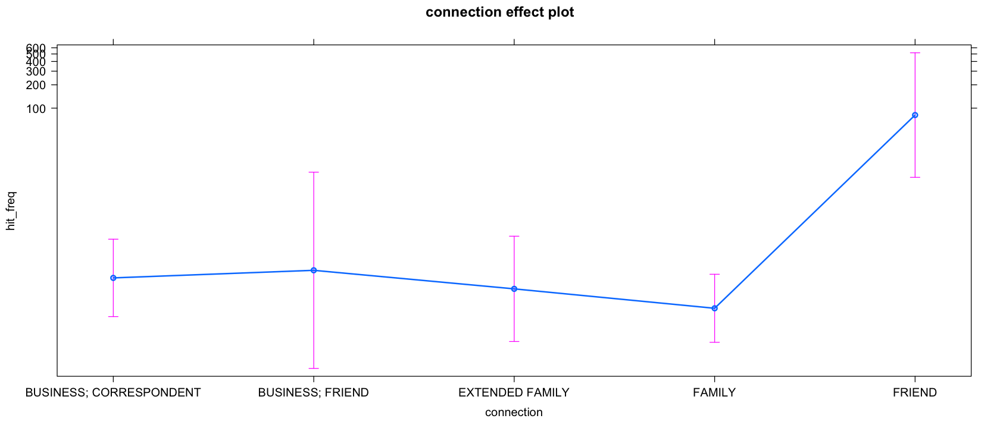

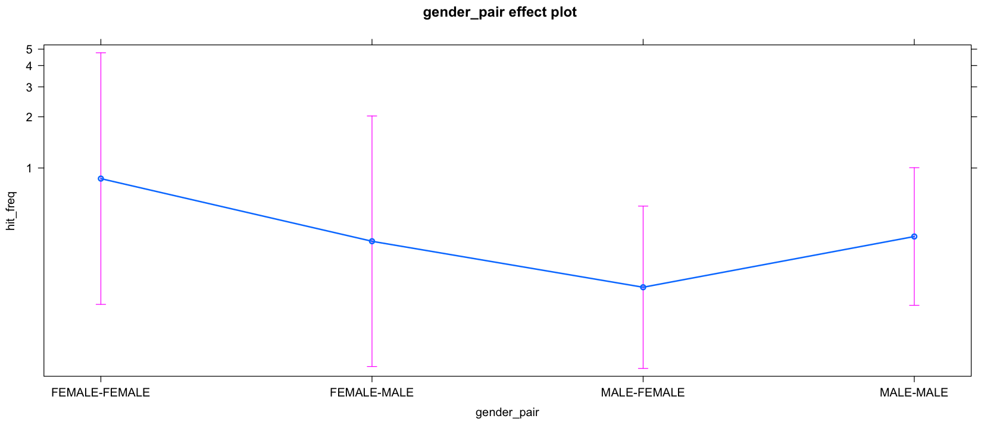

In [65]:
j_glmer7 <- glmer(hit_freq ~ connection + gender_pair + (1|sender),
                  data=j_conn_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7)

"------------------------------drop1------------------------------"
drop1(j_glmer7, test = "Chisq")

effect("connection", j_glmer7)
effect("gender_pair", j_glmer7)

plot(effect("connection", j_glmer7))
plot(effect("gender_pair", j_glmer7))

Gender is not a significant predictor for the number of divine appeals used in correspondence when "sender" is the mixed effect.

### 8.2 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | pair)
   Data: j_conn_gender

     AIC      BIC   logLik deviance df.resid 
   758.5    794.5   -369.3    738.5      259 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9341 -0.6433 -0.4706 -0.3319  9.7796 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 3.295    1.815   
Number of obs: 269, groups:  pair, 56

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -1.1802     1.2232  -0.965 0.334610    
connectionBUSINESS; FRIEND   0.8341     1.6052   0.520 0.603353    
connectionEXTENDED FAMILY    0.2765     1.0645   0.260 0.795028    
connectionFAMILY             0.4065     0.9221   0.441 0.659337    
connectionFRIEND             5.4242     1.3983   3.879 0.000105 ***
gender_pairFEM

[1] "------------------------------dispersion------------------------------"

[1] 1.154537

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,758.5470,NA,NA
connection,4,766.6467,16.0996348,0.002888342
gender_pair,3,752.9572,0.4101589,0.938136009



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3254765               0.7494611               0.4291629 
                 FAMILY                  FRIEND 
              0.4887158              73.8292531 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.4781745     0.4320664     0.3906730     0.5723488 

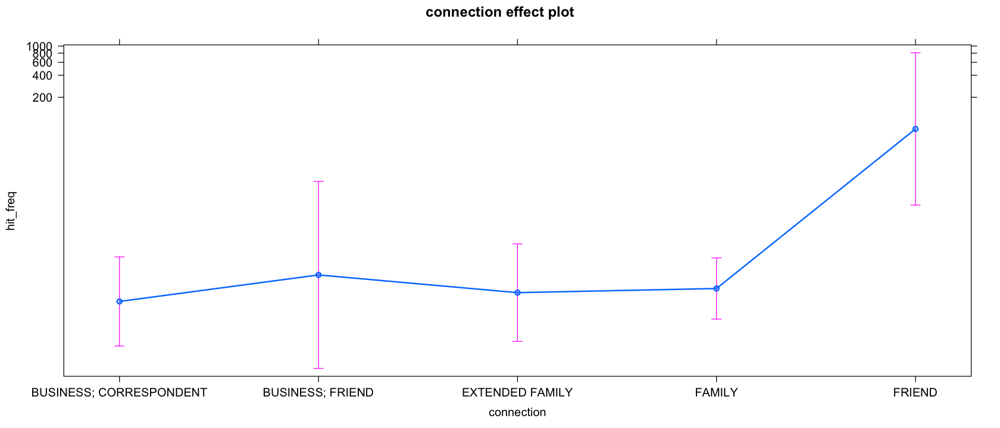

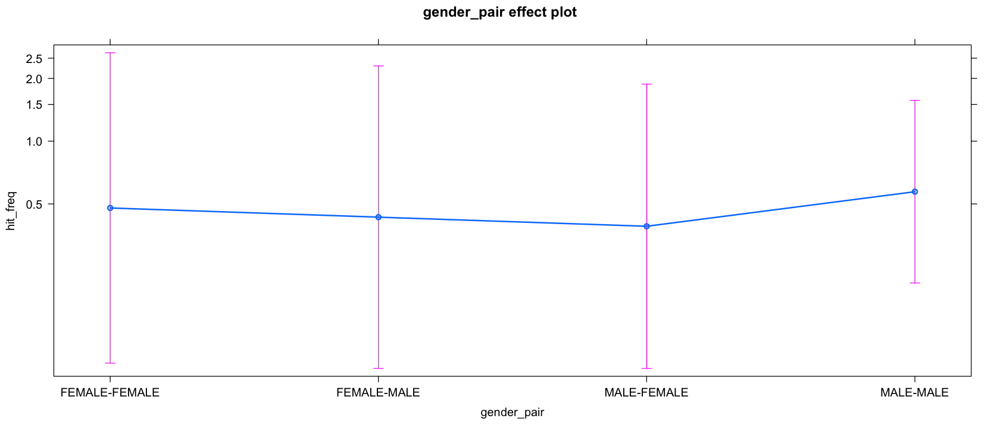

In [66]:
j_glmer7b <- glmer(hit_freq ~ connection + gender_pair + (1|pair),
                  data=j_conn_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7b)

"------------------------------drop1------------------------------"
drop1(j_glmer7b, test = "Chisq")

effect("connection", j_glmer7b)
effect("gender_pair", j_glmer7b)

plot(effect("connection", j_glmer7b))
plot(effect("gender_pair", j_glmer7b))

Gender_pair becomes a significant predictor when "pair" is used as a mixed effect. Although the correlation is very weak, the frequency of divine appeals decrease if a woman writes to a man within the FAMILY connection sphere. FAMILY has a low effect.

### 8.3 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "sender" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | sender) + (1 | decennium)
   Data: j_conn_gender

     AIC      BIC   logLik deviance df.resid 
   778.3    817.8   -378.1    756.3      258 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9607 -0.6346 -0.5336 -0.3092  9.4401 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 3.8801   1.970   
 decennium (Intercept) 0.2884   0.537   
Number of obs: 269, groups:  sender, 33; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                  0.6262     1.1264   0.556   0.5782    
connectionBUSINESS; FRIEND  -0.1232     1.7135  -0.072   0.9427    
connectionEXTENDED FAMILY   -0.5375     1.0720  -0.501   0.6161    
connectionFAMILY            -0.8976     0.5926  -1.515   0.1298   

[1] "------------------------------dispersion------------------------------"

[1] 1.195012

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,778.2738,NA,NA
connection,4,795.6727,25.398890,4.182194e-05
gender_pair,3,779.7005,7.426666,5.947296e-02



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5263769               0.4653466               0.3075225 
                 FAMILY                  FRIEND 
              0.2145266              76.5341021 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    1.0196146     0.2680337     0.1360978     0.2844764 

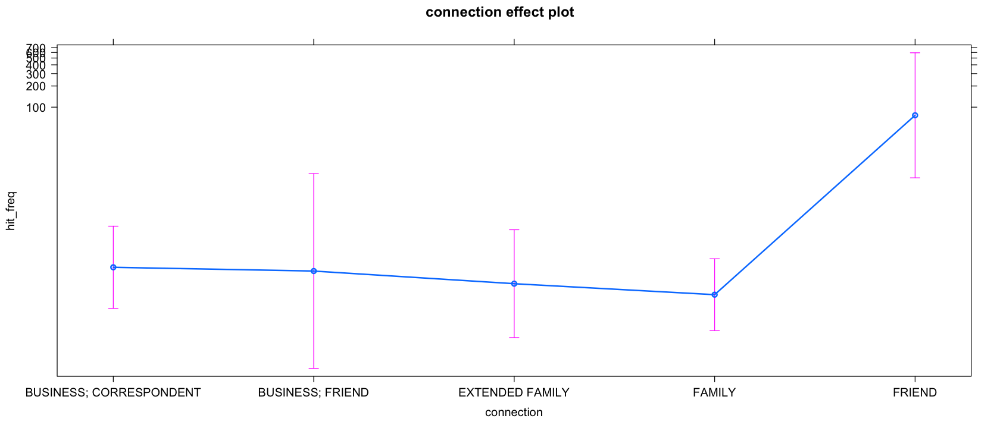

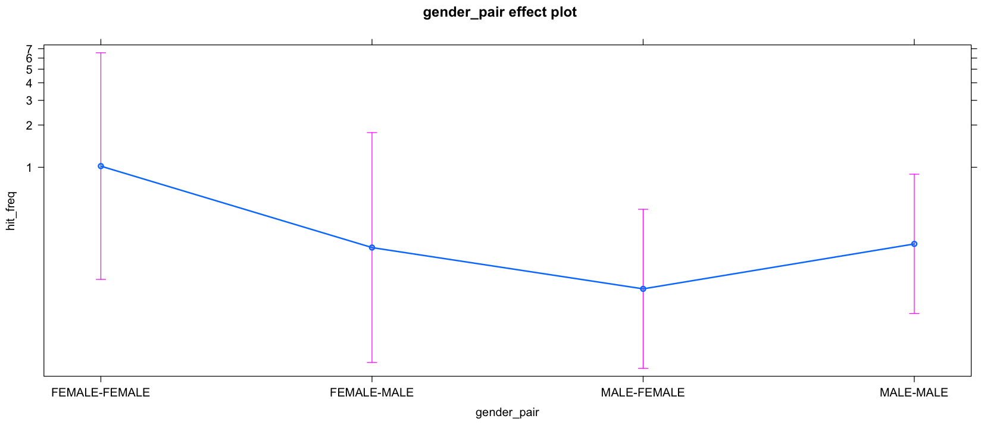

In [67]:
j_glmer7c <- glmer(hit_freq ~ connection + gender_pair + (1|sender) + (1|decennium),
                  data=j_conn_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7c)

"------------------------------drop1------------------------------"
drop1(j_glmer7c, test = "Chisq")

effect("connection", j_glmer7c)
effect("gender_pair", j_glmer7c)

plot(effect("connection", j_glmer7c))
plot(effect("gender_pair", j_glmer7c))

"gender_pair" is not a significant predictor.

### 8.4 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | pair) + (1 | decennium)
   Data: j_conn_gender

     AIC      BIC   logLik deviance df.resid 
   758.1    797.6   -368.0    736.1      258 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9550 -0.6453 -0.4621 -0.3147  8.8888 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 3.6678   1.9152  
 decennium (Intercept) 0.1417   0.3764  
Number of obs: 269, groups:  pair, 56; decennium, 11

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                -1.21812    1.29093  -0.944 0.345374    
connectionBUSINESS; FRIEND  0.48269    1.70686   0.283 0.777334    
connectionEXTENDED FAMILY   0.06919    1.12690   0.061 0.951045    
connectionFAMILY            0.38315    0.97340   0.394 0.693862    
co

[1] "------------------------------dispersion------------------------------"

[1] 1.14105

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,758.0702,NA,NA
connection,4,765.0610,14.9908321,0.00472027
gender_pair,3,752.5906,0.5204645,0.91437298



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3004595               0.4868740               0.3219829 
                 FAMILY                  FRIEND 
              0.4407430              61.9922284 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.4201502     0.3577408     0.3077172     0.4899370 

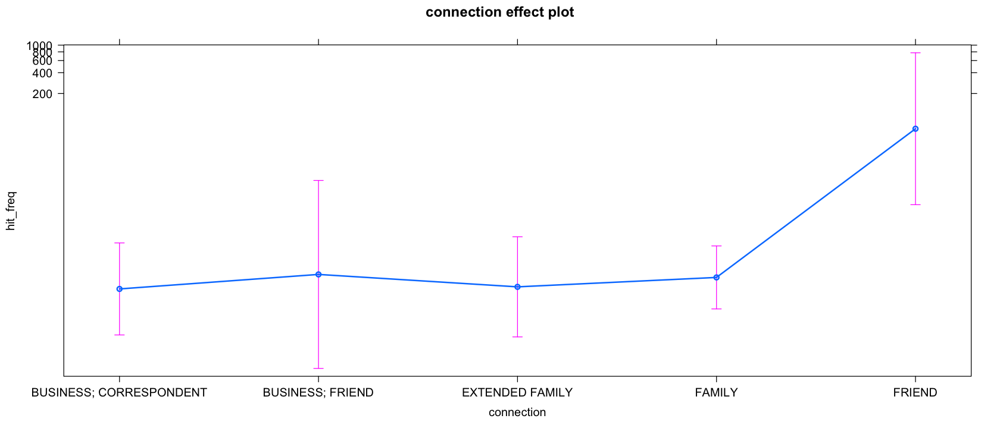

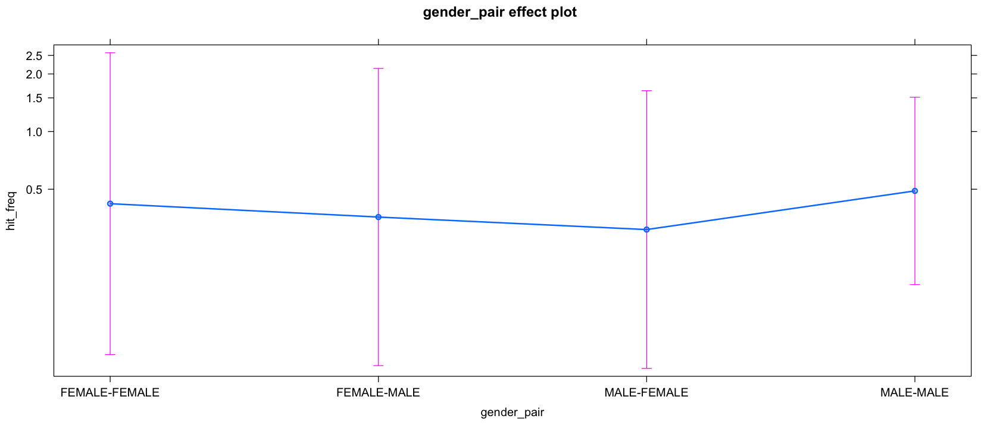

In [68]:
j_glmer7d <- glmer(hit_freq ~ connection + gender_pair + (1|pair) + (1|decennium),
                  data=j_conn_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7d)

"------------------------------drop1------------------------------"
drop1(j_glmer7d, test = "Chisq")

effect("connection", j_glmer7d)
effect("gender_pair", j_glmer7d)

plot(effect("connection", j_glmer7d))
plot(effect("gender_pair", j_glmer7d))

### 8.5 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: 
hit_freq ~ connection + gender_pair + (1 | sender) + (1 | quinquennial)
   Data: jnf_gender

     AIC      BIC   logLik deviance df.resid 
   712.7    748.5   -346.3    692.7      256 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9726 -0.6096 -0.5253 -0.2866  9.8113 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 3.8738   1.9682  
 quinquennial (Intercept) 0.5512   0.7425  
Number of obs: 266, groups:  sender, 31; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                  0.3591     1.1654   0.308   0.7579  
connectionBUSINESS; FRIEND   0.1409     1.7240   0.082   0.9349  
connectionEXTENDED FAMILY   -0.6513     1.1007  -0.592   0.5541  
connectionFAMILY            -0.6709     0.6352  -1.056   0.29

[1] "------------------------------dispersion------------------------------"

[1] 1.144741

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,712.6622,NA,NA
connection,3,707.5654,0.9032371,0.8246466
gender_pair,3,711.2776,4.6154626,0.2022196



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.4753010               0.5472192               0.2478180 
                 FAMILY 
              0.2430012 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.8433854     0.2553863     0.1560701     0.2723310 

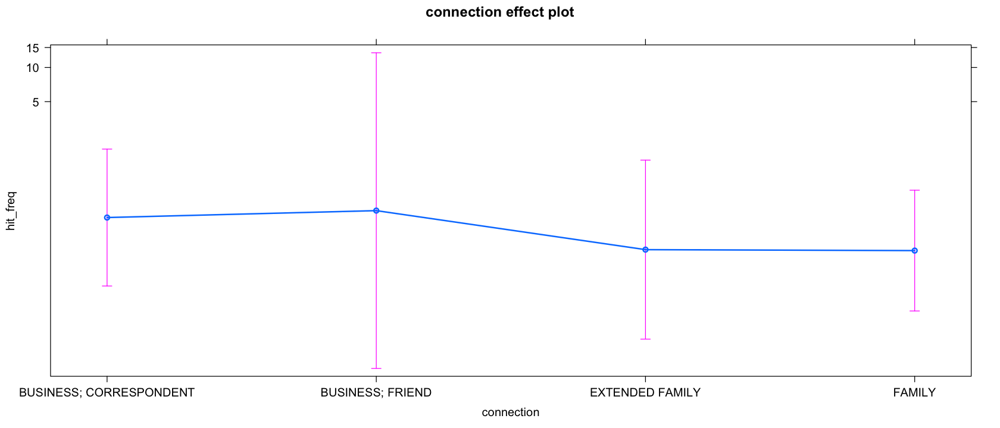

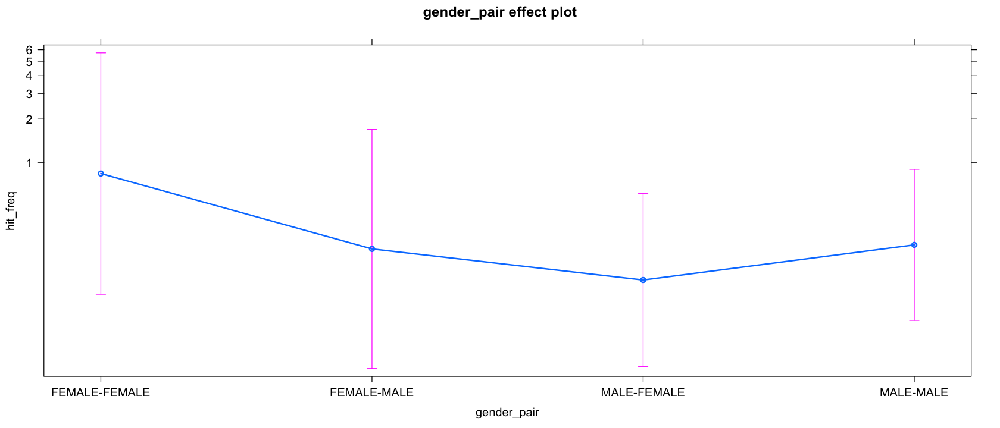

In [69]:
j_glmer7e <- glmer(hit_freq ~ connection + gender_pair + (1|sender) + (1|quinquennial),
                  data=jnf_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7e)

"------------------------------drop1------------------------------"
drop1(j_glmer7e, test = "Chisq")

effect("connection", j_glmer7e)
effect("gender_pair", j_glmer7e)

plot(effect("connection", j_glmer7e))
plot(effect("gender_pair", j_glmer7e))

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | sender) + (1 | year)
   Data: jnf_gender

     AIC      BIC   logLik deviance df.resid 
   671.1    706.6   -325.5    651.1      247 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9718 -0.6243 -0.4738 -0.2746  8.6956 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.285    1.812   
 year   (Intercept) 1.014    1.007   
Number of obs: 257, groups:  sender, 31; year, 28

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                  0.4039     1.2390   0.326   0.7445  
connectionBUSINESS; FRIEND  -0.2885     1.6830  -0.171   0.8639  
connectionEXTENDED FAMILY   -0.5355     1.1094  -0.483   0.6293  
connectionFAMILY            -0.8968     0.7965  -1.126   0.2602  
gender_pairFEMALE-MALE      -0

[1] "------------------------------dispersion------------------------------"

[1] 1.096959

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,671.0685,NA,NA
connection,3,666.0717,1.003268,0.8004613
gender_pair,3,670.4129,5.344472,0.1482426



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5349678               0.4009010               0.3131686 
                 FAMILY 
              0.2181887 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
   0.75483222    0.31775005    0.09107695    0.30101390 

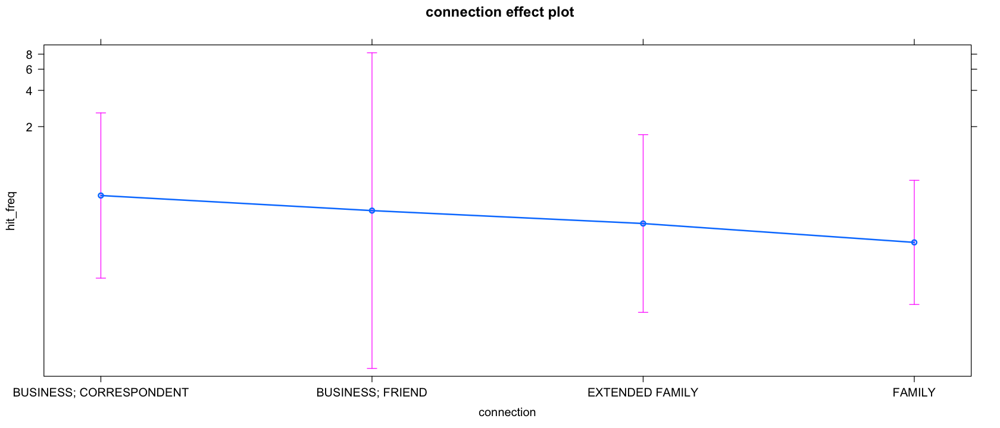

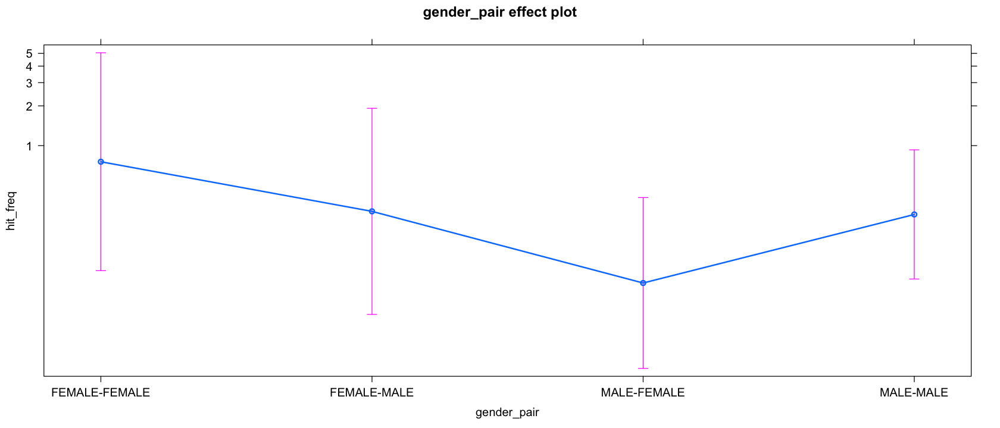

In [27]:
j_glmer7e <- glmer(hit_freq ~ connection + gender_pair + (1|sender) + (1|year),
                  data=jnf_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7e)

"------------------------------drop1------------------------------"
drop1(j_glmer7e, test = "Chisq")

effect("connection", j_glmer7e)
effect("gender_pair", j_glmer7e)

plot(effect("connection", j_glmer7e))
plot(effect("gender_pair", j_glmer7e))

When paired, gender is not a significant predictor. What if we looked at the sender and addressee's gender apart?

In [30]:
# remove multigender values from gender_addressee column

jnf_genderadd <- jeake_nofriend[!(jeake_nofriend$gender_addressee %in% "MULT"),  ]
jnf_genderadd$gender_addressee <- droplevels(jnf_genderadd$gender_addressee)

levels(jnf_genderadd$gender_addressee)
nrow(jnf_genderadd)

str(jnf_genderadd)

[1] "FEMALE" "MALE"

[1] 266

'data.frame':	266 obs. of  35 variables:
 $ id                  : Factor w/ 272 levels "1","3","11","12",..: 3 4 5 6 8 9 10 11 12 13 ...
 $ hit_freq            : num  0 1.69 0 0 15.17 ...
 $ conf_freq           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ approve_freq        : num  0 0 0 0 0 0 0 0 0 1.73 ...
 $ fixed_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ object_freq         : num  0 0 0 0 1.73 0 0 0 0 0 ...
 $ grat_freq           : num  0 0 0 0 1.73 0 0 0 0 0 ...
 $ pray_freq           : num  0 1.73 0 0 0 0 0 0 0 0 ...
 $ preserve_freq       : num  0 1.73 0 0 0 0 0 0 0 0 ...
 $ presupp_freq        : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ resign_freq         : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ travel_freq         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ trade_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ health_freq         : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ politics_freq       : num  0 0 0 0 0 0 0 0 0 0 ...
 $ social_freq         : num  0 0 0 0 0 0 0 0 0 1.73 ...
 $ connection          : Fact

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: 
hit_freq ~ connection + gender_sender + (1 | sender) + (1 | quinquennial)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   721.8    750.5   -352.9    705.8      260 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9716 -0.6167 -0.5131 -0.2984  9.5410 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 4.0479   2.0119  
 quinquennial (Intercept) 0.5537   0.7441  
Number of obs: 268, groups:  sender, 31; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                -0.09721    1.13210  -0.086    0.932
connectionBUSINESS; FRIEND  0.15131    1.75650   0.086    0.931
connectionEXTENDED FAMILY  -0.88267    1.11670  -0.790    0.429
connectionFAMILY           -0.82529    0.63325  -1.303    0.192

[1] "------------------------------dispersion------------------------------"

[1] 1.148518

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,721.8205,NA,NA
connection,3,717.4587,1.6381405,0.6507730
gender_sender,1,720.1757,0.3552225,0.5511716



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5403559               0.6286267               0.2235333 
                 FAMILY 
              0.2367337 


 gender_sender effect
gender_sender
   FEMALE      MALE 
0.4653034 0.2393818 

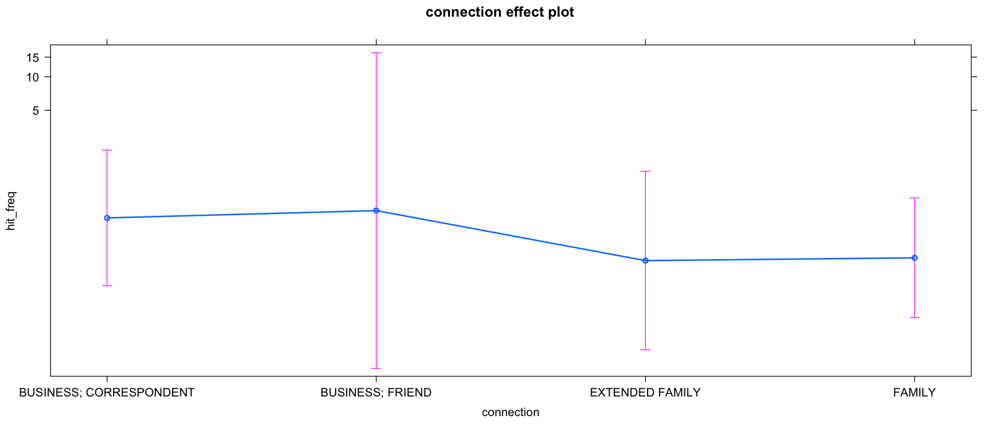

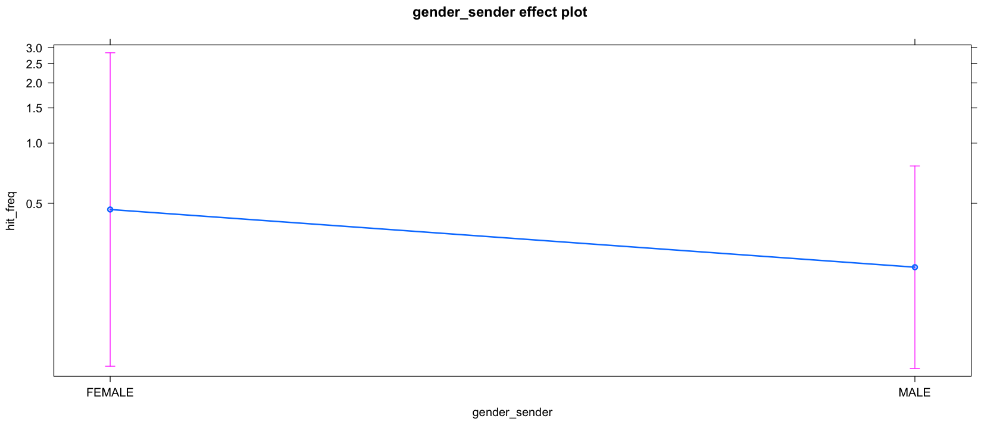

In [71]:
j_glmer7f <- glmer(hit_freq ~ connection + gender_sender + (1|sender) + (1|quinquennial),
                  data=jeake_nofriend,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7f)

"------------------------------drop1------------------------------"
drop1(j_glmer7f, test = "Chisq")

effect("connection", j_glmer7f)
effect("gender_sender", j_glmer7f)

plot(effect("connection", j_glmer7f))
plot(effect("gender_sender", j_glmer7f))

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_sender + (1 | sender) + (1 | year)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   673.1    701.5   -328.5    657.1      250 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9719 -0.6372 -0.4727 -0.2822  9.1538 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.211    1.792   
 year   (Intercept) 1.148    1.072   
Number of obs: 258, groups:  sender, 31; year, 28

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                  0.1786     1.1513   0.155    0.877
connectionBUSINESS; FRIEND  -0.3892     1.6644  -0.234    0.815
connectionEXTENDED FAMILY   -0.8336     1.0930  -0.763    0.446
connectionFAMILY            -1.2807     0.7795  -1.643    0.100
gender_senderMALE           -0.632

[1] "------------------------------dispersion------------------------------"

[1] 1.101887

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,673.0660,NA,NA
connection,3,669.4653,2.3993021,0.4937646
gender_sender,1,671.4841,0.4181766,0.5178483



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.7301528               0.4947332               0.3172315 
                 FAMILY 
              0.2028589 


 gender_sender effect
gender_sender
   FEMALE      MALE 
0.4445702 0.2362283 

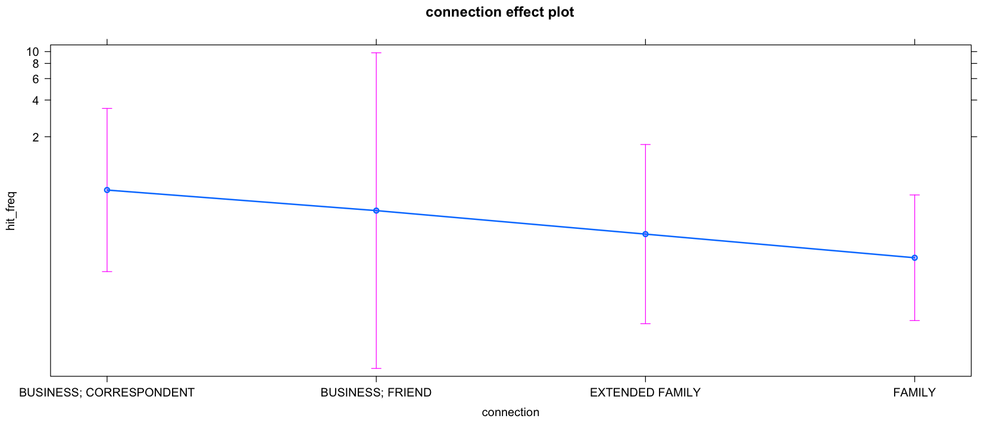

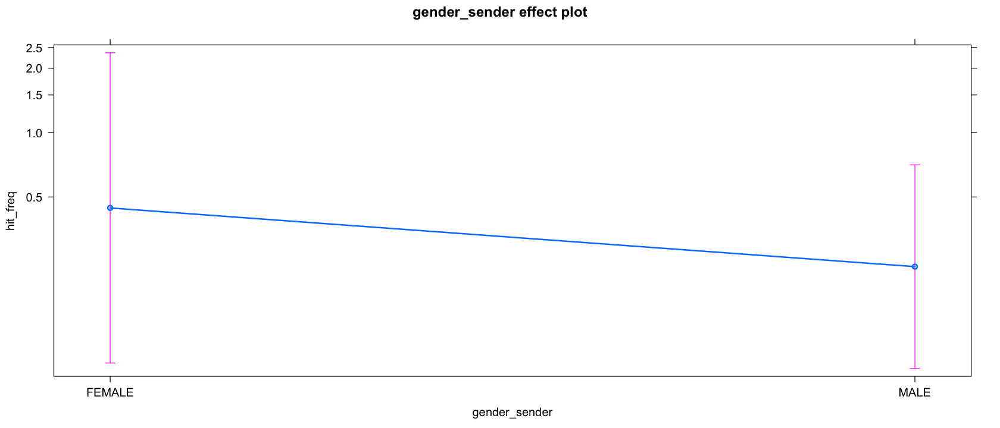

In [28]:
j_glmer7f <- glmer(hit_freq ~ connection + gender_sender + (1|sender) + (1|year),
                  data=jeake_nofriend,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7f)

"------------------------------drop1------------------------------"
drop1(j_glmer7f, test = "Chisq")

effect("connection", j_glmer7f)
effect("gender_sender", j_glmer7f)

plot(effect("connection", j_glmer7f))
plot(effect("gender_sender", j_glmer7f))

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_addressee + (1 | sender) + (1 |  
    quinquennial)
   Data: jnf_genderadd

     AIC      BIC   logLik deviance df.resid 
   713.2    741.8   -348.6    697.2      258 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9704 -0.6170 -0.5046 -0.3049  9.5327 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 4.0555   2.0138  
 quinquennial (Intercept) 0.5668   0.7529  
Number of obs: 266, groups:  sender, 31; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                -0.54162    0.77526  -0.699    0.485
connectionBUSINESS; FRIEND  0.09962    1.75015   0.057    0.955
connectionEXTENDED FAMILY  -0.66938    1.06898  -0.626    0.531
connectionFAMILY           -0.80297    0.63008  -1.274  

[1] "------------------------------dispersion------------------------------"

[1] 1.149986

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,713.1707,NA,NA
connection,3,708.6689,1.4982032,0.6826851
gender_addressee,1,711.2776,0.1069139,0.7436853



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.5182685               0.5725564               0.2653660 
                 FAMILY 
              0.2321820 


 gender_addressee effect
gender_addressee
   FEMALE      MALE 
0.3137008 0.2649185 

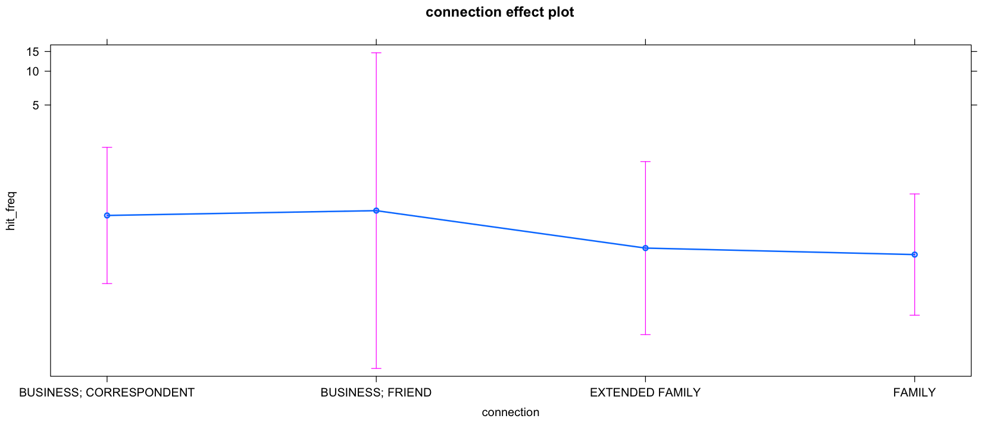

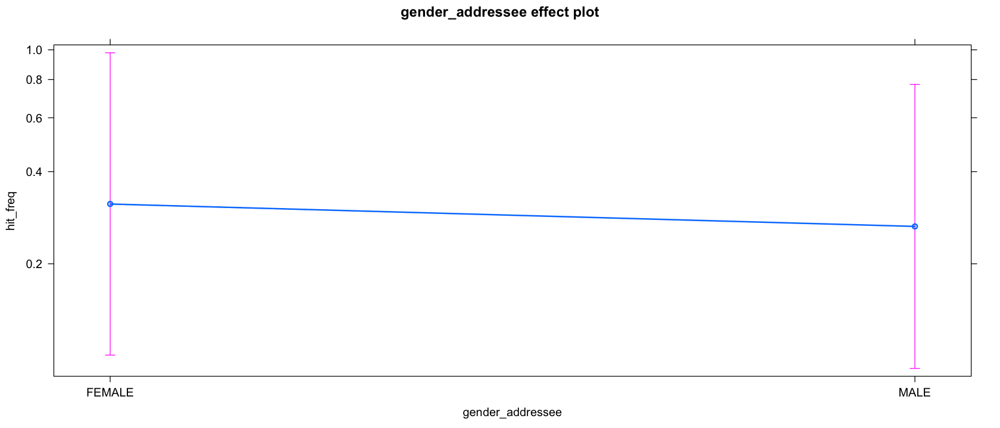

In [72]:
j_glmer7g <- glmer(hit_freq ~ connection + gender_addressee + (1|sender) + (1|quinquennial),
                  data=jnf_genderadd,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7g)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7g)

"------------------------------drop1------------------------------"
drop1(j_glmer7g, test = "Chisq")

effect("connection", j_glmer7g)
effect("gender_addressee", j_glmer7g)

plot(effect("connection", j_glmer7g))
plot(effect("gender_addressee", j_glmer7g))

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_addressee + (1 | sender) + (1 |  
    year)
   Data: jnf_genderadd

     AIC      BIC   logLik deviance df.resid 
   671.8    700.2   -327.9    655.8      249 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9722 -0.6481 -0.4692 -0.2586  8.7837 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.363    1.834   
 year   (Intercept) 1.167    1.080   
Number of obs: 257, groups:  sender, 31; year, 28

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.7381     0.9193  -0.803    0.422
connectionBUSINESS; FRIEND  -0.4226     1.6916  -0.250    0.803
connectionEXTENDED FAMILY   -0.5929     1.0659  -0.556    0.578
connectionFAMILY            -1.0522     0.7875  -1.336    0.182
gender_addresseeMALE      

[1] "------------------------------dispersion------------------------------"

[1] 1.100424

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,671.8397,NA,NA
connection,3,667.3476,1.507821,0.6804664
gender_addressee,1,670.4129,0.573200,0.4489901



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.6163126               0.4038906               0.3406411 
                 FAMILY 
              0.2152016 


 gender_addressee effect
gender_addressee
   FEMALE      MALE 
0.2137760 0.3099263 

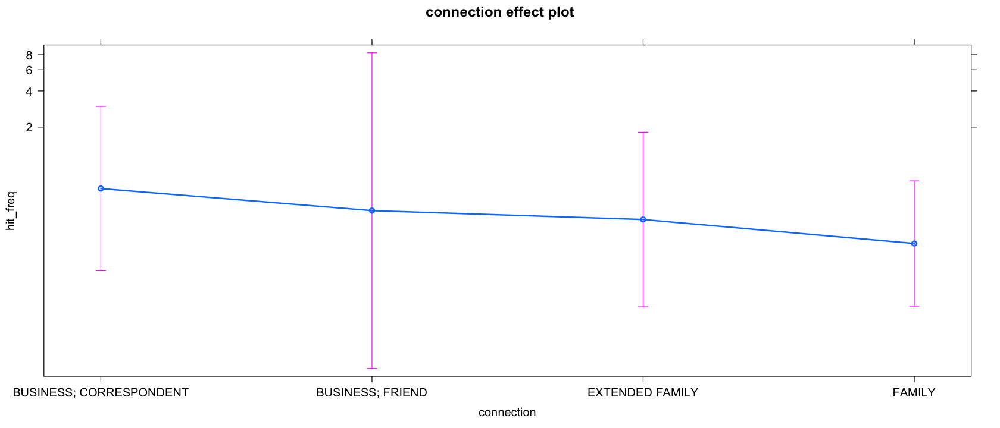

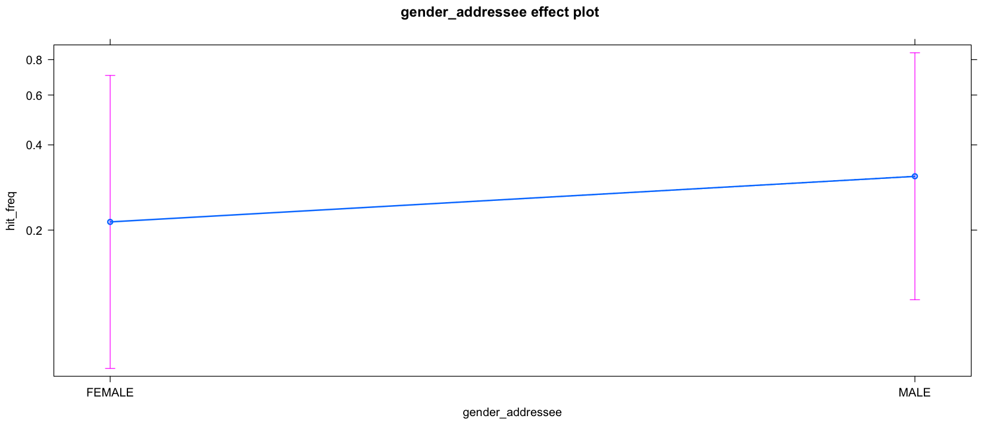

In [31]:
j_glmer7g <- glmer(hit_freq ~ connection + gender_addressee + (1|sender) + (1|year),
                  data=jnf_genderadd,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7g)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7g)

"------------------------------drop1------------------------------"
drop1(j_glmer7g, test = "Chisq")

effect("connection", j_glmer7g)
effect("gender_addressee", j_glmer7g)

plot(effect("connection", j_glmer7g))
plot(effect("gender_addressee", j_glmer7g))

Separated from their pairings, the gender variables do not become significant either.

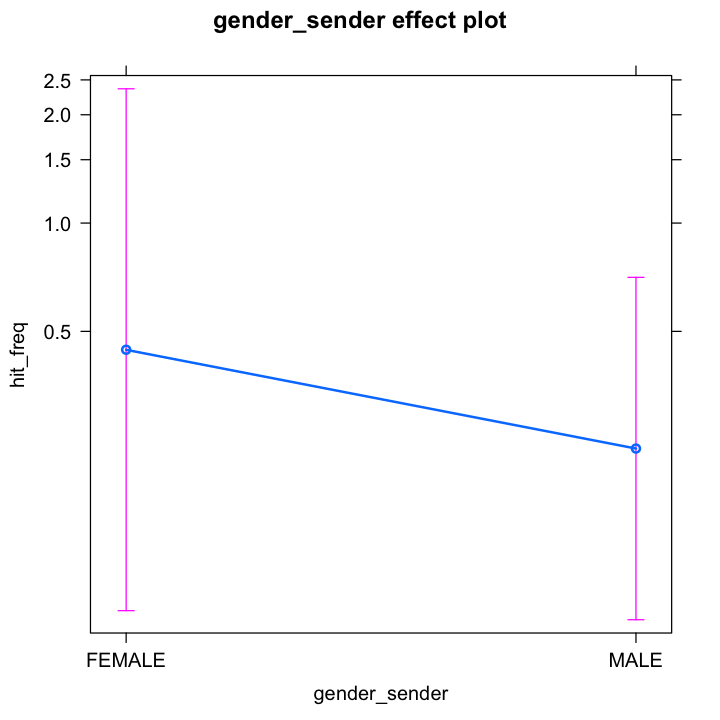

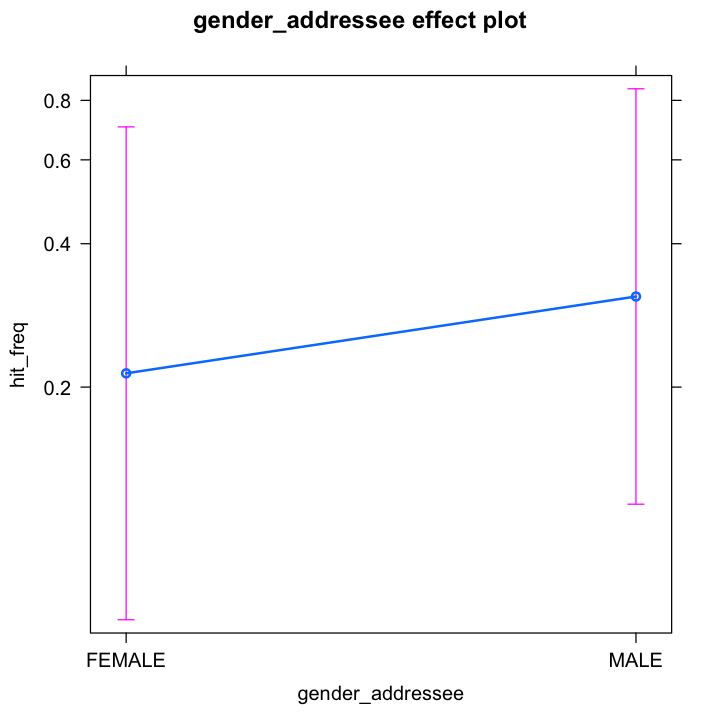

In [45]:
plot(effect("gender_sender", j_glmer7f))
plot(effect("gender_addressee", j_glmer7g))

par(cex.axis = 0.8)

options(repr.plot.width = 6, repr.plot.height = 6)

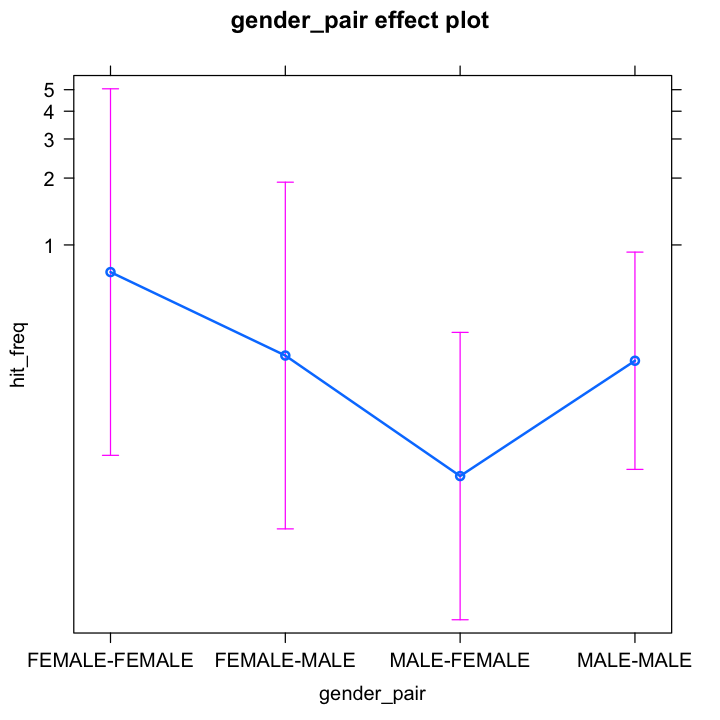

In [46]:
plot(effect("gender_pair", j_glmer7e))

### 9.1 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "sender" as random effect, negative binomial

In [73]:
# remove "UNK" and "MULT" values from significant predictor columns

"Regular dataset:"
j_conn_sig <- subset(jeake_conn, !(age_gap_over_20 %in% c("MULT", "UNK") | 
                                   sender_over_40 %in% c("MULT", "UNK")))

j_conn_sig$age_gap_over_20 <- droplevels(j_conn_sig$age_gap_over_20)
j_conn_sig$sender_over_40 <- droplevels(j_conn_sig$sender_over_40)

levels(j_conn_sig$age_gap_over_20)
levels(j_conn_sig$sender_over_40)

nrow(j_conn_sig)

'"FRIEND" variable removed:'
jnf_sig <- subset(jeake_nofriend, !(age_gap_over_20 %in% c("MULT", "UNK") | 
                                   sender_over_40 %in% c("MULT", "UNK")))

jnf_sig$age_gap_over_20 <- droplevels(jnf_sig$age_gap_over_20)
jnf_sig$sender_over_40 <- droplevels(jnf_sig$sender_over_40)

levels(jnf_sig$age_gap_over_20)
levels(jnf_sig$sender_over_40)

nrow(jnf_sig)

[1] "Regular dataset:"

[1] "FALSE" "TRUE"

[1] "FALSE" "TRUE"

[1] 186

[1] "\"FRIEND\" variable removed:"

[1] "FALSE" "TRUE"

[1] "FALSE" "TRUE"

[1] 186

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    sender)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   516.4    539.0   -251.2    502.4      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7436 -0.5805 -0.1208  6.3509 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0        0       
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                0.24444    0.35251   0.693  0.48804    
connectionEXTENDED FAMILY -0.04303    0.55655  -0.077  0.93837    
connectionFAMILY          -1.77855    0.35340  -5.033 4.84e-07 ***
age_gap_over_20TRUE        0.85747    0.29503   2.906  0.00366 ** 
sender_over_40TRUE         0.88916    0.27033   3.289  0.00

[1] "------------------------------dispersion------------------------------"

[1] 1.22352

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,516.4113,NA,NA
connection,2,528.7188,16.307500,0.0002876546
age_gap_over_20,1,522.8591,8.447791,0.0036548707
sender_over_40,1,524.4927,10.081460,0.0014976862



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.7469007        3.5890938        0.6327855 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5188745 1.2230849 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4742455 1.1538796 

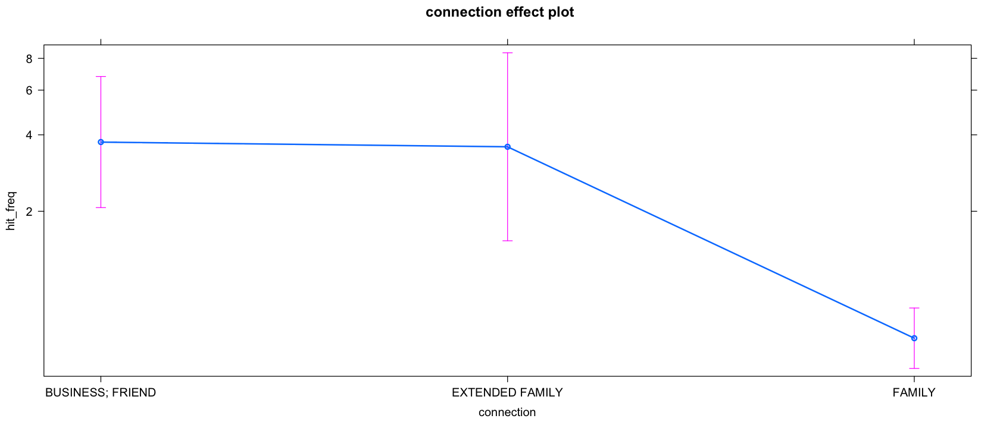

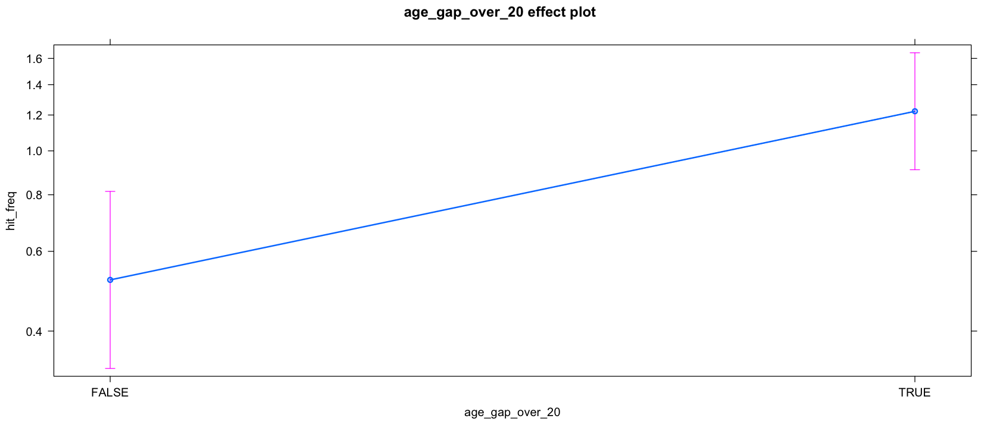

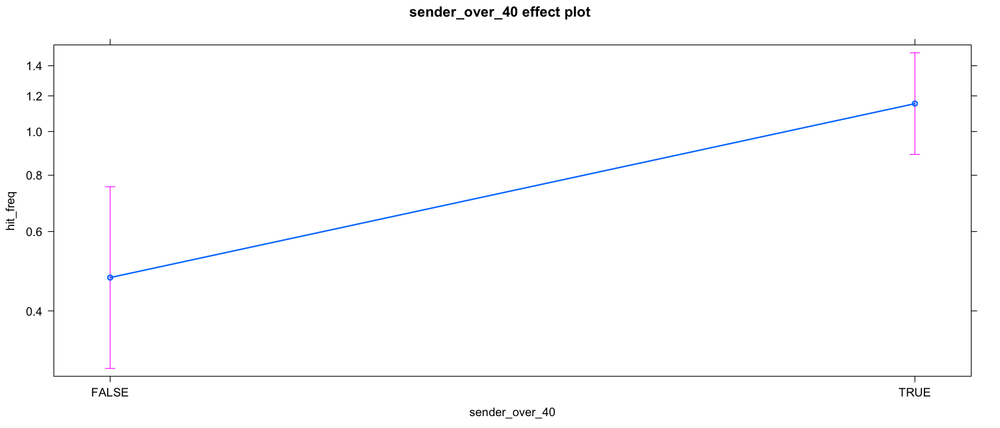

In [74]:
j_glmer8 <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|sender),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer8)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8)

"------------------------------drop1------------------------------"
drop1(j_glmer8, test = "Chisq")

effect("connection", j_glmer8)
effect("age_gap_over_20", j_glmer8)
effect("sender_over_40", j_glmer8)

plot(effect("connection", j_glmer8))
plot(effect("age_gap_over_20", j_glmer8))
plot(effect("sender_over_40", j_glmer8))

There is zero variance and standard deviance in the random effect. This could indicate model overfitting, or difficulties for the model to estimate the variability accurately. Either way, it seems that this model is too complex for the data at hand.

### 9.2 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    pair)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   516.4    539.0   -251.2    502.4      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7436 -0.5805 -0.1208  6.3507 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 0        0       
Number of obs: 186, groups:  pair, 24

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                0.24441    0.35250   0.693  0.48809    
connectionEXTENDED FAMILY -0.04303    0.55654  -0.077  0.93837    
connectionFAMILY          -1.77857    0.35339  -5.033 4.83e-07 ***
age_gap_over_20TRUE        0.85751    0.29501   2.907  0.00365 ** 
sender_over_40TRUE         0.88920    0.27032   3.289  0.00100 

[1] "------------------------------dispersion------------------------------"

[1] 1.22352

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,516.4113,NA,NA
connection,2,520.8557,8.444478,0.01466577
age_gap_over_20,1,516.1001,1.688823,0.19375622
sender_over_40,1,519.9242,5.512943,0.01887625



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.7469728        3.5891641        0.6327858 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5188642 1.2231106 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4742352 1.1538991 

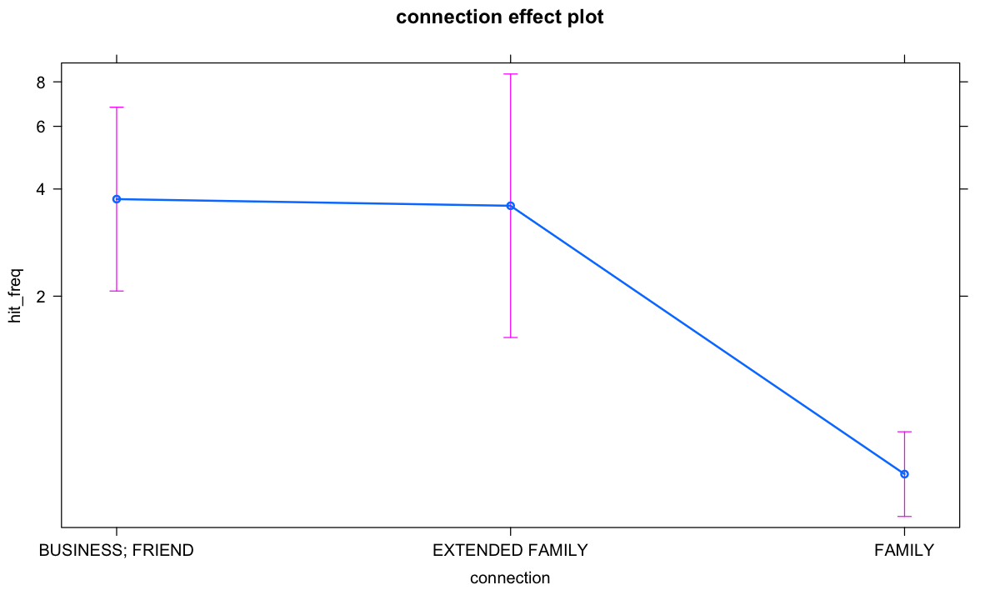

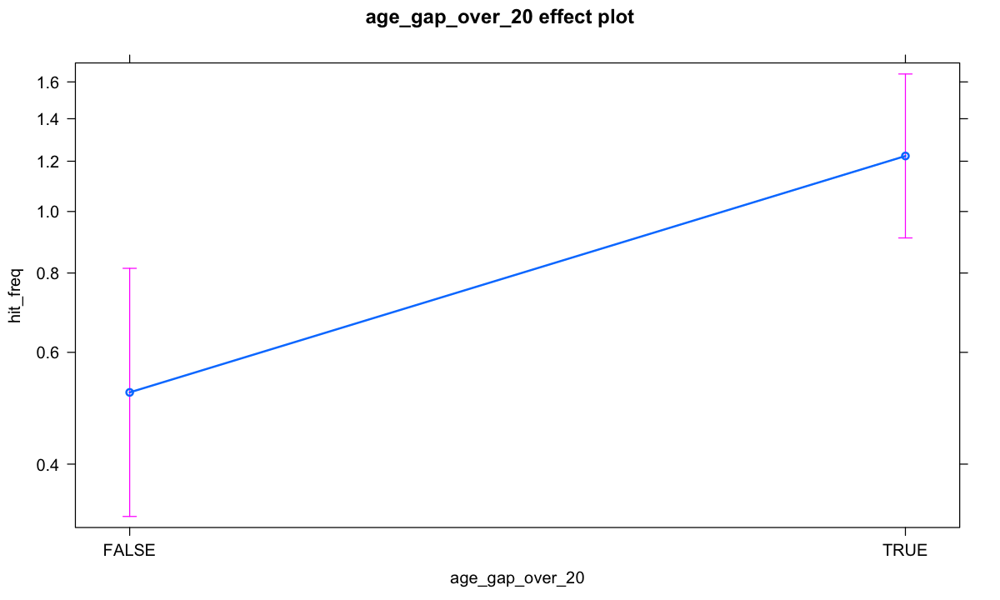

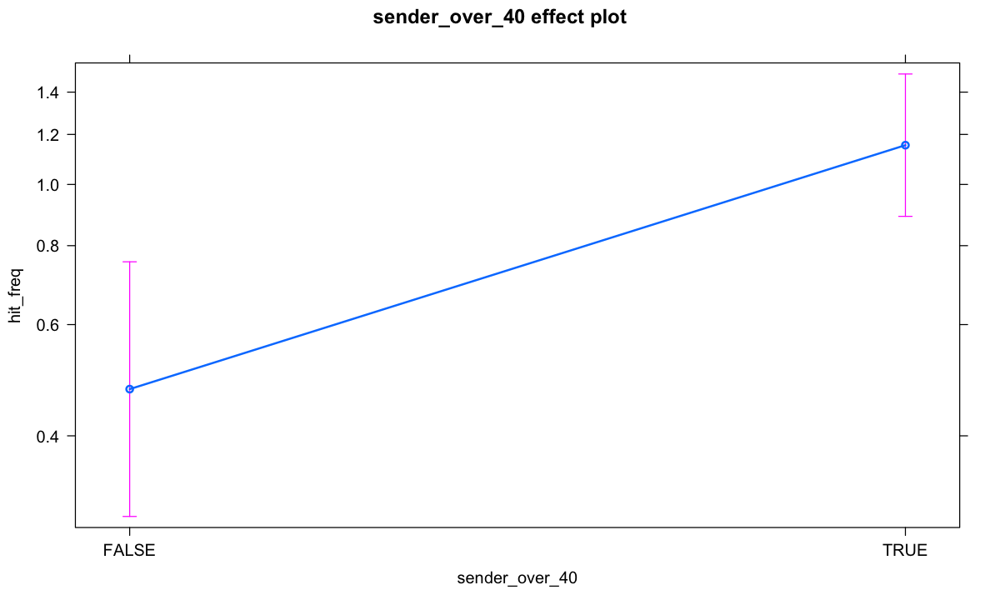

In [86]:
#addressee_over_40 is added due to it being a significant predictor while using "pair" as random effect

j_glmer8b <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|pair),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8b)

"------------------------------drop1------------------------------"
drop1(j_glmer8b, test = "Chisq")

effect("connection", j_glmer8b)
effect("age_gap_over_20", j_glmer8b)
effect("sender_over_40", j_glmer8b)

plot(effect("connection", j_glmer8b))
plot(effect("age_gap_over_20", j_glmer8b))
plot(effect("sender_over_40", j_glmer8b))

The model shows that sender over 40 remains a significant predictor for the frequency of divine appeals. It has positive moderate correlation to FAMILY, which, in this model, is highly significant. It's overall effect, however, remains low.

### 9.3 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "sender" and "decennium" as random effects, negative binomial 

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    sender) + (1 | decennium)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   515.5    541.3   -249.8    499.5      178 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9268 -0.6787 -0.5449 -0.1724  7.3558 

Random effects:
 Groups    Name        Variance Std.Dev.
 sender    (Intercept) 0.0000   0.0000  
 decennium (Intercept) 0.1564   0.3954  
Number of obs: 186, groups:  sender, 12; decennium, 10

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)               -0.07922    0.43372  -0.183  0.85507   
connectionEXTENDED FAMILY -0.15742    0.65923  -0.239  0.81127   
connectionFAMILY          -1.47393    0.45109  -3.268  0.00108 **
age_gap_over_20TRUE        0.83239    0.37741   2.

[1] "------------------------------dispersion------------------------------"

[1] 1.202754

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,515.5421,NA,NA
connection,2,520.6138,9.071696,0.01071781
age_gap_over_20,1,518.7766,5.234447,0.02214385
sender_over_40,1,519.7311,6.189003,0.01285466



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       2.6166235        2.2354997        0.5992658 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.4718146 1.0846151 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4340591 1.0228934 

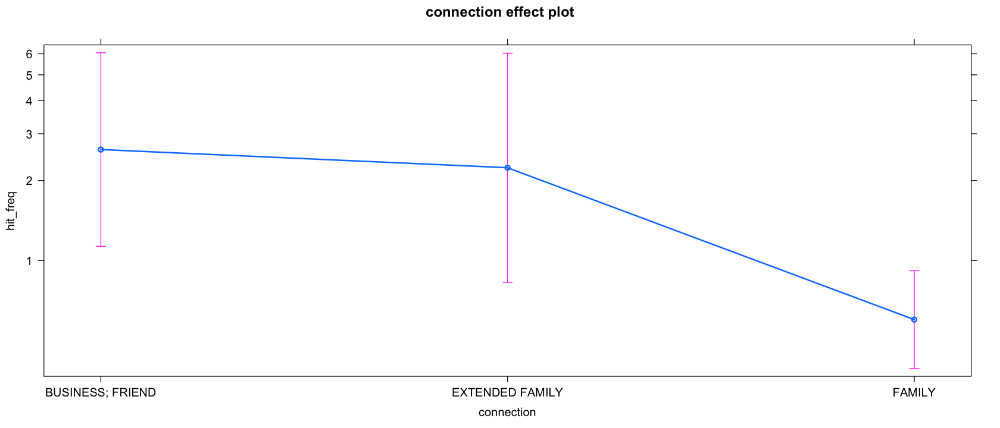

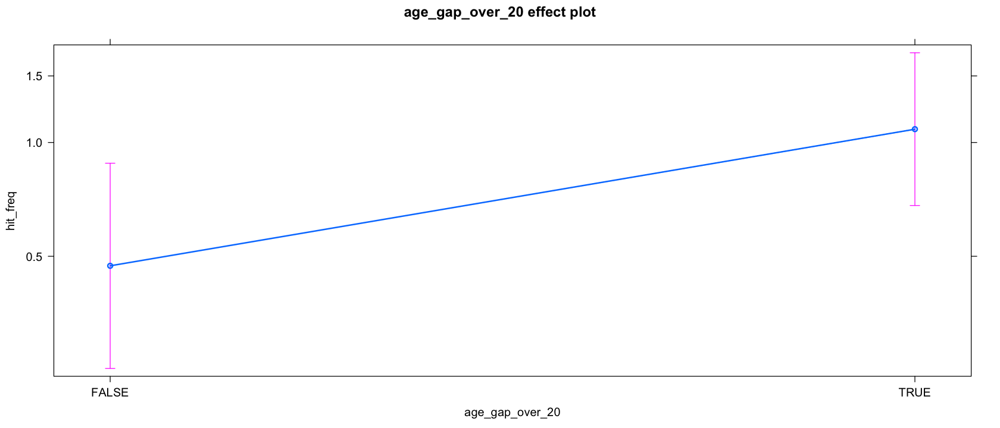

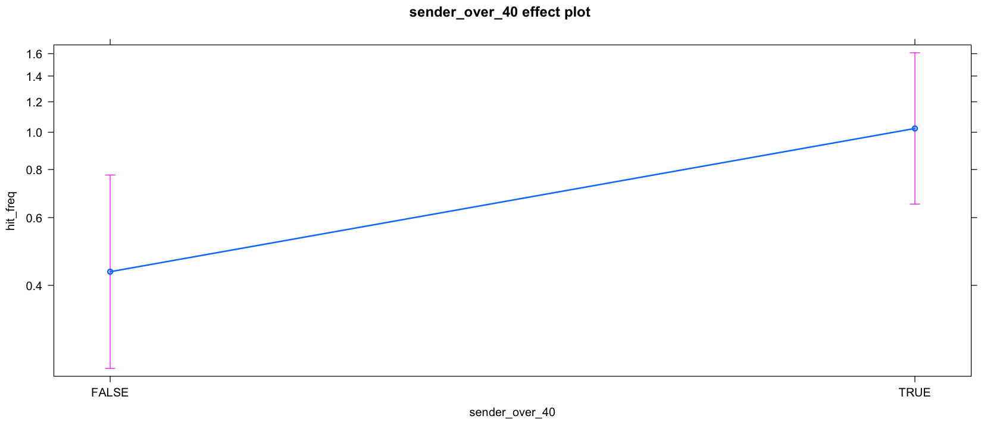

In [76]:
j_glmer8c <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|sender) + (1|decennium),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer8c)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8c)

"------------------------------drop1------------------------------"
drop1(j_glmer8c, test = "Chisq")

effect("connection", j_glmer8c)
effect("age_gap_over_20", j_glmer8c)
effect("sender_over_40", j_glmer8c)

plot(effect("connection", j_glmer8c))
plot(effect("age_gap_over_20", j_glmer8c))
plot(effect("sender_over_40", j_glmer8c))

No variance and no standard deviation. This model is not reliable.

### 9.4 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "pair" and "decennium" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    pair) + (1 | decennium)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   515.5    541.3   -249.8    499.5      178 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9268 -0.6787 -0.5449 -0.1723  7.3560 

Random effects:
 Groups    Name        Variance Std.Dev.
 pair      (Intercept) 0.0000   0.0000  
 decennium (Intercept) 0.1564   0.3955  
Number of obs: 186, groups:  pair, 24; decennium, 10

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)               -0.07929    0.43373  -0.183  0.85495   
connectionEXTENDED FAMILY -0.15705    0.65920  -0.238  0.81169   
connectionFAMILY          -1.47400    0.45105  -3.268  0.00108 **
age_gap_over_20TRUE        0.83252    0.37737   2.206 

[1] "------------------------------dispersion------------------------------"

[1] 1.202754

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,515.5420,NA,NA
connection,2,518.0519,6.509895,0.03858285
age_gap_over_20,1,516.2854,2.743453,0.09765355
sender_over_40,1,519.7936,6.251569,0.01240833



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       2.6166892        2.2363732        0.5992389 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.4717714 1.0846517 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4340434 1.0228824 

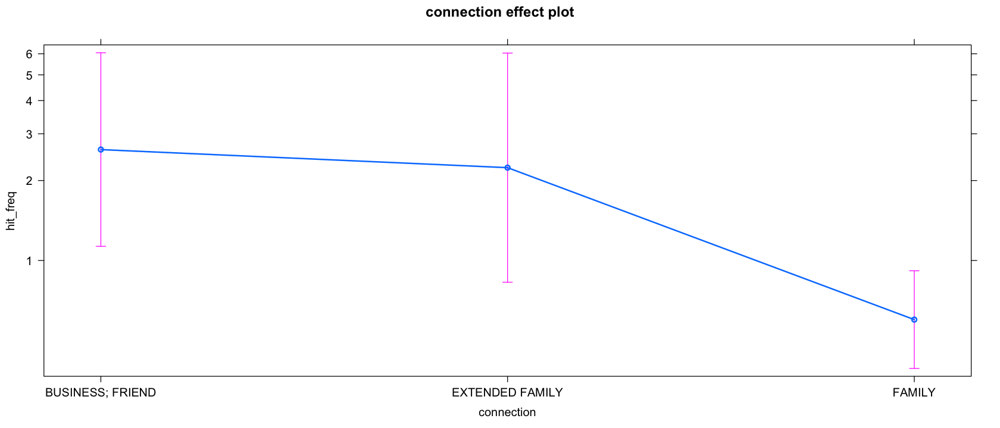

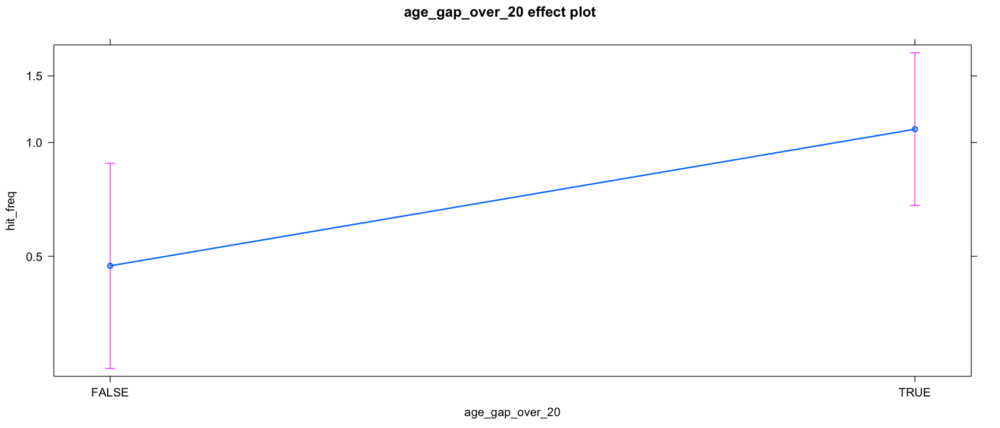

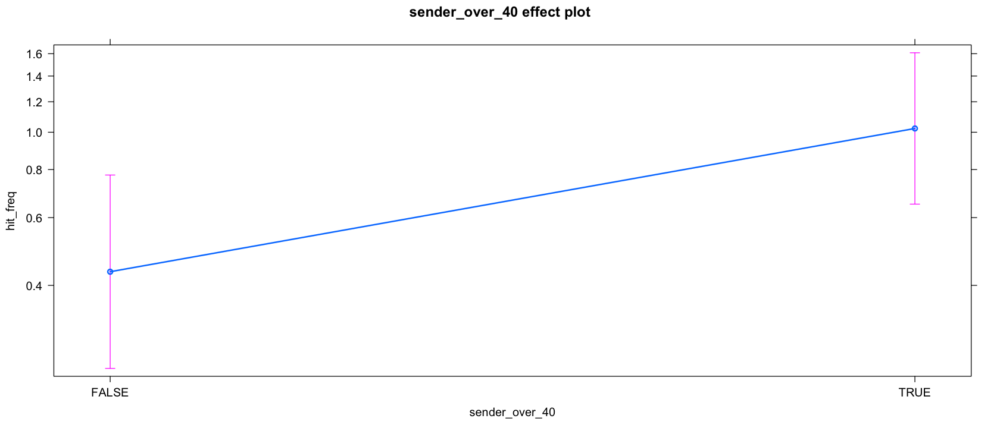

In [77]:
j_glmer8d <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|pair) + (1|decennium),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8d)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8d)

"------------------------------drop1------------------------------"
drop1(j_glmer8d, test = "Chisq")

effect("connection", j_glmer8d)
effect("age_gap_over_20", j_glmer8d)
effect("sender_over_40", j_glmer8d)

plot(effect("connection", j_glmer8d))
plot(effect("age_gap_over_20", j_glmer8d))
plot(effect("sender_over_40", j_glmer8d))

"sender_over_40" is not longer (marginally) a significant predictor. There is a positive moderate correlation with FAMILY, although the effect is low. This model is the best fit.

### 9.5 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    sender) + (1 | quinquennial)
   Data: jnf_sig

     AIC      BIC   logLik deviance df.resid 
   498.3    524.1   -241.2    482.3      178 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9508 -0.6554 -0.5418 -0.2815  8.1443 

Random effects:
 Groups       Name        Variance Std.Dev.
 quinquennial (Intercept) 0.3184   0.5643  
 sender       (Intercept) 0.0000   0.0000  
Number of obs: 186, groups:  quinquennial, 13; sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)                 0.1281     0.4664   0.275  0.78365   
connectionEXTENDED FAMILY  -0.1519     0.6957  -0.218  0.82713   
connectionFAMILY           -1.4963     0.5002  -2.991  0.00278 **
age_gap_over_20TRUE         0.7355    

[1] "------------------------------dispersion------------------------------"

[1] 1.151255

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,498.3314,NA,NA
connection,2,501.8584,7.526978,0.02320265
age_gap_over_20,1,499.7624,3.431014,0.06398279
sender_over_40,1,499.8877,3.556244,0.05932184



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       2.7155718        2.3328063        0.6081888 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5082709 1.0605596 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4958829 0.9814796 

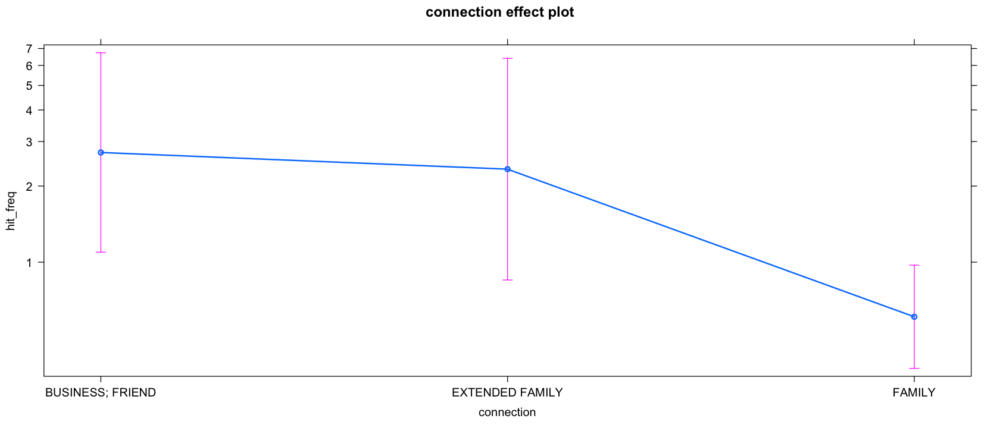

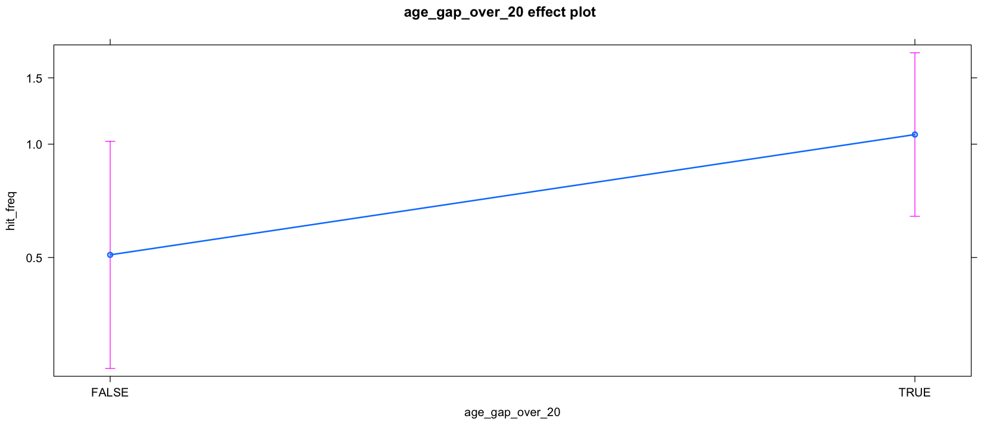

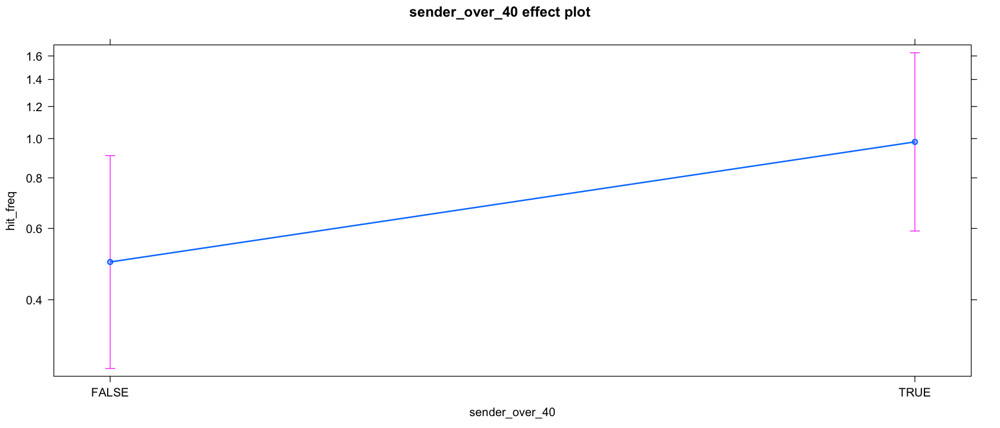

In [78]:
j_glmer8e <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8e)

"------------------------------drop1------------------------------"
drop1(j_glmer8e, test = "Chisq")

effect("connection", j_glmer8e)
effect("age_gap_over_20", j_glmer8e)
effect("sender_over_40", j_glmer8e)

plot(effect("connection", j_glmer8e))
plot(effect("age_gap_over_20", j_glmer8e))
plot(effect("sender_over_40", j_glmer8e))

"age_gap_over_20" is a marginally significant predictor (it does not reach the 0.05 treshold). There is a negative strong correlation with "FAMILY", which is also a highly signficant predictive variable. This is consistent with the model's result using the same random effects while using age_gap_over_20 as a fixed effect (section 4.5).

In [79]:
j_lm1 <- lm(hit_freq ~ connection + age_gap,
            data=jeake_conn)

summary(j_lm1)
"------- drop 1 -------"
#drop1(j_lmer1, test="Chisq")


Call:
lm(formula = hit_freq ~ connection + age_gap, data = jeake_conn)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0067 -1.1850 -0.5781 -0.0036 17.9967 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)                2.72654    0.76462   3.566 0.000488 ***
connectionEXTENDED FAMILY  4.02299    1.75084   2.298 0.022968 *  
connectionFAMILY          -2.79870    0.90884  -3.079 0.002470 ** 
connectionFRIEND          -1.40998    3.56890  -0.395 0.693352    
age_gap                    0.04335    0.03428   1.265 0.208014    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.497 on 149 degrees of freedom
  (118 observations deleted due to missingness)
Multiple R-squared:  0.1736,	Adjusted R-squared:  0.1514 
F-statistic: 7.826 on 4 and 149 DF,  p-value: 9.416e-06


[1] "------- drop 1 -------"


 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY           FRIEND 
        3.579172         7.602164         0.780469         2.169189 


 age_gap effect
age_gap
        2        10        20        30        40 
0.7254918 1.0722886 1.5057846 1.9392806 2.3727766 

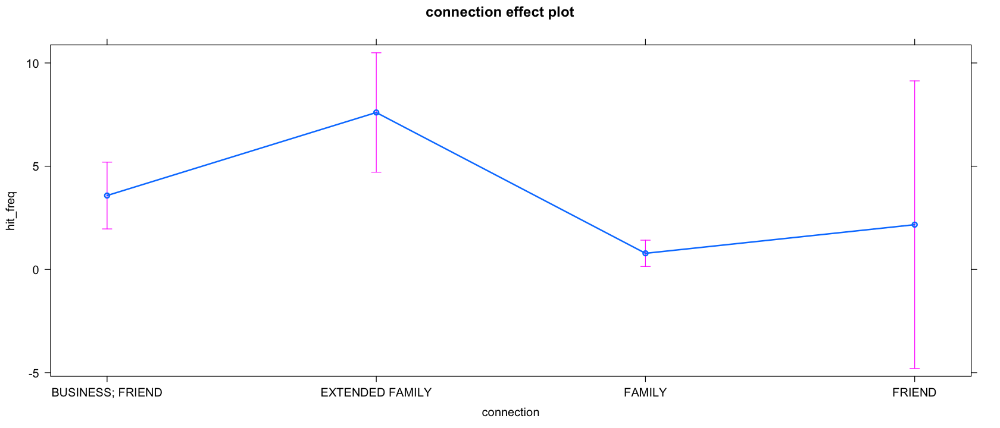

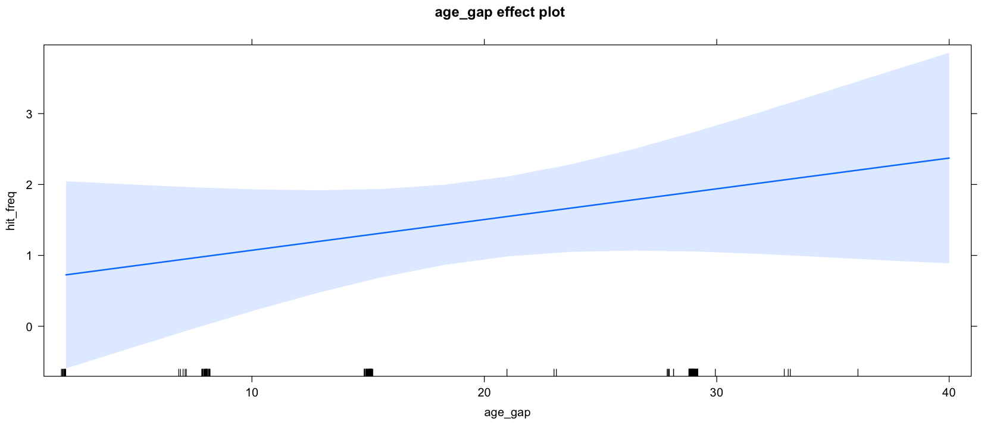

In [80]:
effect("connection", j_lm1)
effect("age_gap", j_lm1)
plot(effect("connection", j_lm1))
plot(effect("age_gap", j_lm1))
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)


Call:
lm(formula = hit_freq ~ connection + age_gap, data = jeake_nofriend)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0067 -1.1850 -0.5781 -0.0145 17.9967 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)                2.72654    0.76462   3.566 0.000488 ***
connectionEXTENDED FAMILY  4.02299    1.75084   2.298 0.022968 *  
connectionFAMILY          -2.79870    0.90884  -3.079 0.002470 ** 
age_gap                    0.04335    0.03428   1.265 0.208014    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.497 on 149 degrees of freedom
  (115 observations deleted due to missingness)
Multiple R-squared:  0.1736,	Adjusted R-squared:  0.157 
F-statistic: 10.43 on 3 and 149 DF,  p-value: 2.842e-06



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.5827619        7.6057537        0.7840585 


 age_gap effect
age_gap
       2       10       20       30       40 
0.721062 1.067859 1.501355 1.934851 2.368347 

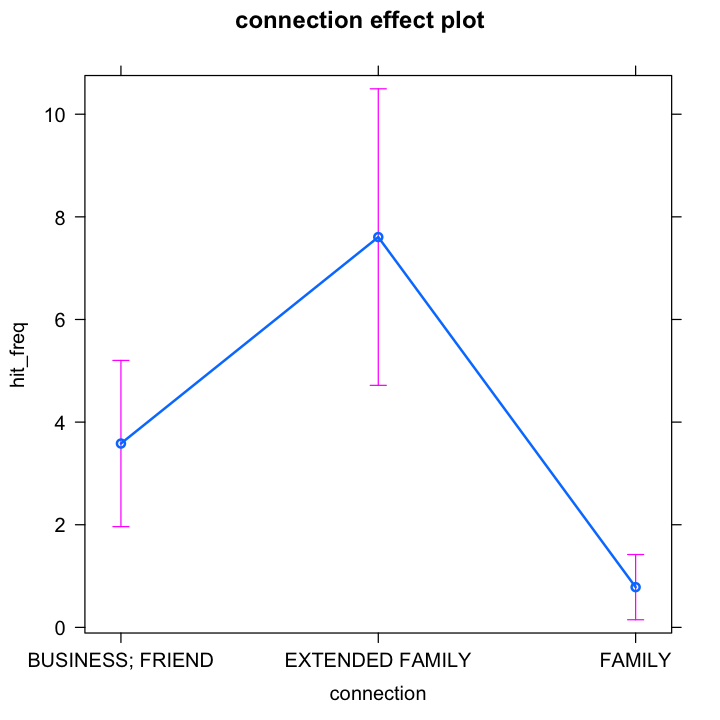

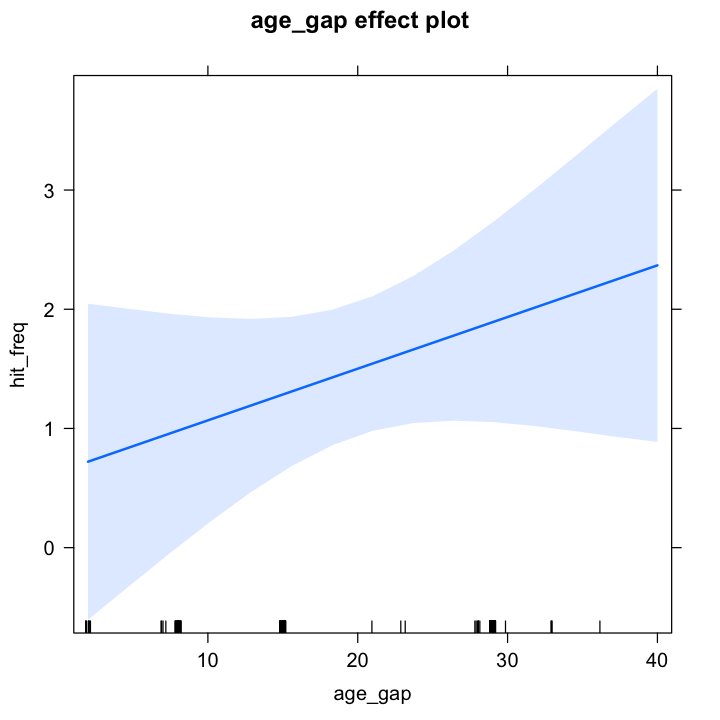

In [59]:
j_lm2 <- lm(hit_freq ~ connection + age_gap,
            data=jeake_nofriend)
summary(j_lm2)

effect("connection", j_lm2)
effect("age_gap", j_lm2)
plot(effect("connection", j_lm2))
plot(effect("age_gap", j_lm2))
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 6, repr.plot.height = 6)

## Appendix: failed experiments
### Mixed model using "decennium" and "connection" as a predictor and "sender" as a random effect

In [82]:
glmer(hit_freq ~ decennium + connection + (1|sender), data=jeake_conn, family=poisson)

Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 281.580000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 442.480000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 10.110000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 15.170000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 10.110000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr,

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“no

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-int

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“no

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in 

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in 

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: poisson  ( log )
Formula: hit_freq ~ decennium + connection + (1 | sender)
   Data: jeake_conn
     AIC      BIC   logLik deviance df.resid 
     Inf      Inf     -Inf      Inf      256 
Random effects:
 Groups Name        Std.Dev.
 sender (Intercept) 1       
Number of obs: 272, groups:  sender, 33
Fixed Effects:
               (Intercept)          decennium1640-1649  
                    0.5408                     -0.4494  
        decennium1650-1659          decennium1660-1669  
                   -0.8066                     -1.6135  
        decennium1670-1679          decennium1680-1689  
                   -0.3876                     -0.6471  
        decennium1690-1699          decennium1700-1709  
                   -1.3674                     -1.5630  
        decennium1710-1719          decennium1720-1729  
                    0.4627                      0.3837  
        dec

The above model doesn't work, since quasipoisson doesn't work with mixed models, and rather than numeric values, poisson family only accepts integer values as response variables.

### Generalised linear model using "sender" as an interaction with "connection" predictor

In [83]:
testset <- read.delim(file = "test_set.tsv", sep = "\t", header = T)
str(testset)

'data.frame':	66 obs. of  5 variables:
 $ pair          : Factor w/ 66 levels "ANN WIGHTMAN, ELIZABETH JEAKE",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Sum.of.N_WORDS: int  267 853 526 1235 508 2321 174 2030 407 273 ...
 $ hits          : int  NA NA NA 1 1 3 NA 13 NA NA ...
 $ hit_freq      : num  0 0 0 81 197 ...
 $ connection    : Factor w/ 8 levels "BUSINESS","BUSINESS; FRIEND",..: 3 3 4 4 1 4 1 3 4 4 ...


In [84]:
test2 <- glm(hit_freq ~ connection * pair, data=testset)
summary(test2)


Call:
glm(formula = hit_freq ~ connection * pair, data = testset)

Deviance Residuals: 
 [1]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
[26]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
[51]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0

Coefficients: (462 not defined because of singularities)
                                                                                         Estimate
(Intercept)                                                                             5.073e-14
connectionBUSINESS; FRIEND                                                              1.011e+02
connectionEXTENDED FAMILY                                                              -9.015e-13
connectionFAMILY                                                                        3.704e+02
connectionFRIEND                                                                        1.309e+03
connectionPATRON                                    

In [85]:
test <- glm(hit_freq ~ connection * sender, data=jeake_conn, family=quasipoisson)
test(summary)

Warning message:
“step size truncated due to divergence”

ERROR: Error: inner loop 1; cannot correct step size


I can't make sense of the above error message. Is it due to the numeric values in "hit_freq"?

### Linear model with "sender" as an interaction with "connection" predictor

In [ ]:
j_lm2 <- lm(hit_freq ~ connection * sender, data=jeake_conn)
summary(j_lm2)
"------- drop 1 -------"
drop1(j_lm2, test="Chisq")

### Linear model using "connection" as a predictor and "hit_freq" as response variable

In [ ]:
j_conn_model <- lm(hit_freq ~ connection, data=jeake_conn)

summary(j_conn_model)
summary(j_conn_model)$coef
"------- drop 1 -------"
drop1(j_conn_model, test="Chisq")

In [ ]:
eff <- effect("connection", j_conn_model)
eff

In [ ]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 14, repr.plot.height = 6)

The linear model seems more strict than the generalised linear model. Let's re-run the test without the "FRIEND" term.

#### Linear model using "connection" as a predictor, without "FRIEND", and "hit_freq" as response variable

In [ ]:
j_nofriend_model <- lm(hit_freq ~ connection, data=jeake_nofriend)

summary(j_nofriend_model)
summary(j_nofriend_model)$coef
"------- drop 1 -------"
drop1(j_conn_model, test="Chisq")

In [ ]:
eff <- effect("connection", j_nofriend_model)
eff

In [ ]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)

It seems that the model is more statistically signficant, however, take note of the low R-squared values, indicating that the variability in the dependent variable "hit_freq" is not well explained by its independent variable "connection". Furthermore, the residuals show extreme outliers and deviate generally far more from 0 than the glm models do, indicating that the linear models fit the data more poorly. Last but not least, the Shapiro-Wilk test indicates that the data is not normally distributed, meaning that linear models are not the most appropriate models to use in the first place.

### Linear mixed effects model using "connection" as a fixed effect and "sender" as a random effect

In [ ]:
j_lmer1 <- lmer(hit_freq ~ connection + (1|sender), data=jeake_conn)
summary(j_lmer1)
"------- drop 1 -------"
drop1(j_lmer1, test="Chisq")

In [ ]:
effect("connection",j_lmer1)

In [ ]:
plot(effect("connection", j_lmer1))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### Generalised linear model using "connection" and "sender_over_40" as an interaction

In [ ]:
j_glm5b <- glm(hit_freq ~ connection * sender_over_40,
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1))
summary(j_glm5b)

"------------------------------dispersion------------------------------"
366.67 / 209

"------------------------------drop1------------------------------"
drop1(j_glm5b, test = "Chisq")

effect("connection", j_glm5b)
effect("sender_over_40", j_glm5b)

In [ ]:
j_glmer8f <- glmer(hit_freq ~ age_gap_over_20 * sender_over_40 + age_gap_over_20 * addressee_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8f)

"------------------------------drop1------------------------------"
drop1(j_glmer8f, test = "Chisq")

effect("connection", j_glmer8f)
effect("age_gap_over_20", j_glmer8f)
effect("sender_over_40", j_glmer8f)
effect("addressee_over_40", j_glmer8f)

plot(effect("connection", j_glmer8f))
plot(effect("age_gap_over_20", j_glmer8f))
plot(effect("sender_over_40", j_glmer8f))
plot(effect("addressee_over_40", j_glmer8f))